An attempt to fix the problems in FrequencyEvolution using numerical integration, specifically the Runge-Kutta method. The hope was that since freqChangeRate() didn't tend to return errors, I could just approximate the solution to an ODE outwards from that and get basically the same result as changeInFreq() would have given me if it worked. Um. But. I couldn't get the Runge-Kutta to work. It might be an issue with tolerance--the last thing I was working on with this before I abandoned it was trying to get it to do the calculation in nHz, rather than Hz, in the hopes that that would keep it from pitching a fit about the difference in scale between the x and y. But who knows if that would've done it.

(I also think that sometimes the freqChangeRate() even threw errors with the complex numbers, much as with changeInFreq(), so even this would have been an imperfect solution--but the point is moot, since this notebook was abandoned.)

In [44]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
from enterprise import constants as const

In [4]:
def freqChangeRate(mass, gwFreq): #mass in solar masses, freq in s^-1
    #where freq is the gravitational wave frequency
    freq = gwFreq * np.pi #orbital frequency
    M = mass * 5 * (10 ** -6) # find mass expressed in seconds, rather than solar masses
    dwdt = (-96/5) * (M**(5/3)) * (freq**(11/3))
    return dwdt / np.pi

In [5]:
def changeInFreq(mass, freq, yrs):
    seconds = yrs * 3.154 * (10 ** 7) # convert the years to seconds
    M = mass * 5 * (10 ** -6) # find mass expressed in seconds, rather than solar masses
    inside = ( (1 - (256/5) * (M ** (5/3)) * ( (np.pi * freq) ** (8/3)) * seconds) )
    #print(str(yrs) + ": " + str(inside))
    #val = np.abs(complex(inside) ** (-3/8))
    val = inside ** (-3/8)
    #print(val)
    return (freq * val) - freq

In [234]:
def freqChangeRateNumerical(t, values):
    #values contains [m in solar masses, GW frequency]
    M = values[0] #* const.Tsun
    gwFreq = values[1]
    freq = gwFreq * np.pi
        
    dwdt = (96/5) * (M**(5/3)) * (freq**(11/3)) #should not be negative
    print("orbital frequency at {0}: {2}; dw/dt at {0}: {1}".format(t, dwdt, freq))
    return [0, dwdt / np.pi]

In [ ]:
def function(t, values):
    M = values[0]
    f = values[1]
    return [0, M * f ** 11/3]

In [235]:
def changeInFreqNumerical(mass, freq, yrs):
    seconds = yrs * const.yr
    M = mass * const.Tsun
    initialValues = [M, freq]
    print("Initial values: {0}".format(initialValues))
    sol = solve_ivp(
        freqChangeRateNumerical, [0, seconds], initialValues, method="RK23", 
        max_step = 1e6, first_step = 1e6, rtol = 1e-8, atol = 1e-30 )
    print(sol)
    return sol.y[1][-1] - freq

In [236]:
print(changeInFreqNumerical(1e9, 1e-8, 1000))

Initial values: [4925.490947641268, 1e-08]
orbital frequency at 0.0: 3.141592653589793e-08; dw/dt at 0.0: 8.4514904288519e-21
orbital frequency at 500000.0: 3.1415930761643145e-08; dw/dt at 500000.0: 8.451494597144984e-21
orbital frequency at 750000.0: 3.1415932874518875e-08; dw/dt at 750000.0: 8.451496681295168e-21
orbital frequency at 1000000.0: 3.141593498739253e-08; dw/dt at 1000000.0: 8.451498765443676e-21
orbital frequency at 1500000.0: 3.141593921314191e-08; dw/dt at 1500000.0: 8.451502933743863e-21
orbital frequency at 1750000.0: 3.1415941326019725e-08; dw/dt at 1750000.0: 8.451505017897598e-21
orbital frequency at 2000000.0: 3.1415943438895455e-08; dw/dt at 2000000.0: 8.451507102049651e-21
orbital frequency at 2500000.0: 3.141594766464901e-08; dw/dt at 2500000.0: 8.451511270356942e-21
orbital frequency at 2750000.0: 3.1415949777528906e-08; dw/dt at 2750000.0: 8.451513354514228e-21
orbital frequency at 3000000.0: 3.141595189040673e-08; dw/dt at 3000000.0: 8.451515438669837e-21


orbital frequency at 1733500000.0: 3.14305897327112e-08; dw/dt at 1733500000.0: 8.465963269621205e-21
orbital frequency at 1733750000.0: 3.143059184920411e-08; dw/dt at 1733750000.0: 8.465965359938134e-21
orbital frequency at 1734000000.0: 3.143059396569492e-08; dw/dt at 1734000000.0: 8.465967450253367e-21
orbital frequency at 1734500000.0: 3.143059819867865e-08; dw/dt at 1734500000.0: 8.465971630887031e-21
orbital frequency at 1734750000.0: 3.1430600315173644e-08; dw/dt at 1734750000.0: 8.465973721207522e-21
orbital frequency at 1735000000.0: 3.1430602431666556e-08; dw/dt at 1735000000.0: 8.465975811526327e-21
orbital frequency at 1735500000.0: 3.143060666465446e-08; dw/dt at 1735500000.0: 8.465979992167118e-21
orbital frequency at 1735750000.0: 3.143060878115155e-08; dw/dt at 1735750000.0: 8.46598208249118e-21
orbital frequency at 1736000000.0: 3.143061089764655e-08; dw/dt at 1736000000.0: 8.465984172813547e-21
orbital frequency at 1736500000.0: 3.143061513063863e-08; dw/dt at 173650

orbital frequency at 2873500000.0: 3.144024636750893e-08; dw/dt at 2873500000.0: 8.475504381536844e-21
orbital frequency at 2873750000.0: 3.144024848638712e-08; dw/dt at 2873750000.0: 8.475506475924513e-21
orbital frequency at 2874000000.0: 3.144025060526321e-08; dw/dt at 2874000000.0: 8.475508570310485e-21
orbital frequency at 2874500000.0: 3.144025484301749e-08; dw/dt at 2874500000.0: 8.475512759085633e-21
orbital frequency at 2874750000.0: 3.144025696189778e-08; dw/dt at 2874750000.0: 8.475514853476881e-21
orbital frequency at 2875000000.0: 3.144025908077596e-08; dw/dt at 2875000000.0: 8.475516947866425e-21
orbital frequency at 2875500000.0: 3.144026331853444e-08; dw/dt at 2875500000.0: 8.47552113664873e-21
orbital frequency at 2875750000.0: 3.144026543741682e-08; dw/dt at 2875750000.0: 8.475523231043551e-21
orbital frequency at 2876000000.0: 3.14402675562971e-08; dw/dt at 2876000000.0: 8.475525325436675e-21
orbital frequency at 2876500000.0: 3.1440271794059764e-08; dw/dt at 2876500

orbital frequency at 3625500000.0: 3.1446622316584654e-08; dw/dt at 3625500000.0: 8.481808339529191e-21
orbital frequency at 3625750000.0: 3.1446624437038835e-08; dw/dt at 3625750000.0: 8.481810436608292e-21
orbital frequency at 3626000000.0: 3.144662655749092e-08; dw/dt at 3626000000.0: 8.481812533685694e-21
orbital frequency at 3626500000.0: 3.144663079839719e-08; dw/dt at 3626500000.0: 8.48181672784371e-21
orbital frequency at 3626750000.0: 3.1446632918853465e-08; dw/dt at 3626750000.0: 8.481818824926393e-21
orbital frequency at 3627000000.0: 3.1446635039307646e-08; dw/dt at 3627000000.0: 8.481820922007378e-21
orbital frequency at 3627500000.0: 3.144663928021811e-08; dw/dt at 3627500000.0: 8.48182511617256e-21
orbital frequency at 3627750000.0: 3.1446641400676487e-08; dw/dt at 3627750000.0: 8.481827213258826e-21
orbital frequency at 3628000000.0: 3.144664352113276e-08; dw/dt at 3628000000.0: 8.481829310343387e-21
orbital frequency at 3628500000.0: 3.144664776204742e-08; dw/dt at 362

orbital frequency at 4262500000.0: 3.1452026930972024e-08; dw/dt at 4262500000.0: 8.487154599980618e-21
orbital frequency at 4262750000.0: 3.1452029052762776e-08; dw/dt at 4262750000.0: 8.487156699343411e-21
orbital frequency at 4263000000.0: 3.1452031174551424e-08; dw/dt at 4263000000.0: 8.4871587987045e-21
orbital frequency at 4263500000.0: 3.1452035418130824e-08; dw/dt at 4263500000.0: 8.487162997429893e-21
orbital frequency at 4263750000.0: 3.145203753992367e-08; dw/dt at 4263750000.0: 8.487165096796267e-21
orbital frequency at 4264000000.0: 3.145203966171442e-08; dw/dt at 4264000000.0: 8.487167196160949e-21
orbital frequency at 4264500000.0: 3.145204390529802e-08; dw/dt at 4264500000.0: 8.487171394893523e-21
orbital frequency at 4264750000.0: 3.145204602709297e-08; dw/dt at 4264750000.0: 8.487173494263488e-21
orbital frequency at 4265000000.0: 3.145204814888581e-08; dw/dt at 4265000000.0: 8.487175593631751e-21
orbital frequency at 4265500000.0: 3.145205239247361e-08; dw/dt at 4265

orbital frequency at 4772500000.0: 3.1456356472222756e-08; dw/dt at 4772500000.0: 8.491439162615935e-21
orbital frequency at 4772750000.0: 3.145635859508465e-08; dw/dt at 4772750000.0: 8.49144126380966e-21
orbital frequency at 4773000000.0: 3.145636071794444e-08; dw/dt at 4773000000.0: 8.491443365001687e-21
orbital frequency at 4773500000.0: 3.1456364963666126e-08; dw/dt at 4773500000.0: 8.49144756738895e-21
orbital frequency at 4773750000.0: 3.1456367086530115e-08; dw/dt at 4773750000.0: 8.491449668586264e-21
orbital frequency at 4774000000.0: 3.1456369209392006e-08; dw/dt at 4774000000.0: 8.491451769781879e-21
orbital frequency at 4774500000.0: 3.145637345511789e-08; dw/dt at 4774500000.0: 8.49145597217632e-21
orbital frequency at 4774750000.0: 3.145637557798399e-08; dw/dt at 4774750000.0: 8.491458073377236e-21
orbital frequency at 4775000000.0: 3.145637770084798e-08; dw/dt at 4775000000.0: 8.491460174576447e-21
orbital frequency at 4775500000.0: 3.1456381946578065e-08; dw/dt at 4775

orbital frequency at 5247000000.0: 3.1460386606529955e-08; dw/dt at 5247000000.0: 8.49542884223079e-21
orbital frequency at 5247500000.0: 3.146039085424438e-08; dw/dt at 5247500000.0: 8.495433048025507e-21
orbital frequency at 5247750000.0: 3.146039297810474e-08; dw/dt at 5247750000.0: 8.495435150926554e-21
orbital frequency at 5248000000.0: 3.1460395101963e-08; dw/dt at 5248000000.0: 8.4954372538259e-21
orbital frequency at 5248500000.0: 3.146039934968163e-08; dw/dt at 5248500000.0: 8.495441459627804e-21
orbital frequency at 5248750000.0: 3.1460401473544096e-08; dw/dt at 5248750000.0: 8.49544356253245e-21
orbital frequency at 5249000000.0: 3.146040359740446e-08; dw/dt at 5249000000.0: 8.495445665435391e-21
orbital frequency at 5249500000.0: 3.1460407845127294e-08; dw/dt at 5249500000.0: 8.495449871244492e-21
orbital frequency at 5249750000.0: 3.146040996899186e-08; dw/dt at 5249750000.0: 8.495451974152728e-21
orbital frequency at 5250000000.0: 3.146041209285433e-08; dw/dt at 525000000

orbital frequency at 5693750000.0: 3.146418277899558e-08; dw/dt at 5693750000.0: 8.4991881552433e-21
orbital frequency at 5694000000.0: 3.14641849037921e-08; dw/dt at 5694000000.0: 8.499190259747527e-21
orbital frequency at 5694500000.0: 3.1464189153387225e-08; dw/dt at 5694500000.0: 8.499194468759195e-21
orbital frequency at 5694750000.0: 3.146419127818795e-08; dw/dt at 5694750000.0: 8.499196573268728e-21
orbital frequency at 5695000000.0: 3.146419340298657e-08; dw/dt at 5695000000.0: 8.499198677776556e-21
orbital frequency at 5695500000.0: 3.14641976525859e-08; dw/dt at 5695500000.0: 8.499202886795423e-21
orbital frequency at 5695750000.0: 3.146419977738873e-08; dw/dt at 5695750000.0: 8.499204991308557e-21
orbital frequency at 5696000000.0: 3.146420190218945e-08; dw/dt at 5696000000.0: 8.499207095819977e-21
orbital frequency at 5696500000.0: 3.1464206151793e-08; dw/dt at 5696500000.0: 8.499211304846052e-21
orbital frequency at 5696750000.0: 3.146420827659793e-08; dw/dt at 5696750000.

orbital frequency at 6114500000.0: 3.146775955771217e-08; dw/dt at 6114500000.0: 8.50273131158431e-21
orbital frequency at 6114750000.0: 3.14677616833971e-08; dw/dt at 6114750000.0: 8.502733417606759e-21
orbital frequency at 6115000000.0: 3.146776380907993e-08; dw/dt at 6115000000.0: 8.502735523627502e-21
orbital frequency at 6115500000.0: 3.1467768060447685e-08; dw/dt at 6115500000.0: 8.502739735672205e-21
orbital frequency at 6115750000.0: 3.146777018613473e-08; dw/dt at 6115750000.0: 8.502741841698264e-21
orbital frequency at 6116000000.0: 3.146777231181966e-08; dw/dt at 6116000000.0: 8.502743947722608e-21
orbital frequency at 6116500000.0: 3.146777656319164e-08; dw/dt at 6116500000.0: 8.50274815977453e-21
orbital frequency at 6116750000.0: 3.146777868888078e-08; dw/dt at 6116750000.0: 8.502750265804184e-21
orbital frequency at 6117000000.0: 3.146778081456782e-08; dw/dt at 6117000000.0: 8.502752371832133e-21
orbital frequency at 6117500000.0: 3.1467785065944005e-08; dw/dt at 6117500

orbital frequency at 6495500000.0: 3.1470999709898744e-08; dw/dt at 6495500000.0: 8.505941932979006e-21
orbital frequency at 6495750000.0: 3.1471001836386333e-08; dw/dt at 6495750000.0: 8.505944040375225e-21
orbital frequency at 6496000000.0: 3.147100396287182e-08; dw/dt at 6496000000.0: 8.505946147769739e-21
orbital frequency at 6496500000.0: 3.147100821584489e-08; dw/dt at 6496500000.0: 8.505950362561991e-21
orbital frequency at 6496750000.0: 3.1471010342334594e-08; dw/dt at 6496750000.0: 8.505952469961822e-21
orbital frequency at 6497000000.0: 3.147101246882218e-08; dw/dt at 6497000000.0: 8.505954577359941e-21
orbital frequency at 6497500000.0: 3.147101672179947e-08; dw/dt at 6497500000.0: 8.505958792159408e-21
orbital frequency at 6497750000.0: 3.147101884829128e-08; dw/dt at 6497750000.0: 8.505960899562843e-21
orbital frequency at 6498000000.0: 3.147102097478097e-08; dw/dt at 6498000000.0: 8.505963006964566e-21
orbital frequency at 6498500000.0: 3.147102522776248e-08; dw/dt at 649

orbital frequency at 6830750000.0: 3.147385180073505e-08; dw/dt at 6830750000.0: 8.508768759359935e-21
orbital frequency at 6831000000.0: 3.147385392792671e-08; dw/dt at 6831000000.0: 8.508770867963405e-21
orbital frequency at 6831500000.0: 3.147385818231214e-08; dw/dt at 6831500000.0: 8.508775085173574e-21
orbital frequency at 6831750000.0: 3.1473860309508025e-08; dw/dt at 6831750000.0: 8.508777193782374e-21
orbital frequency at 6832000000.0: 3.1473862436701796e-08; dw/dt at 6832000000.0: 8.508779302389455e-21
orbital frequency at 6832500000.0: 3.147386669109145e-08; dw/dt at 6832500000.0: 8.50878351960685e-21
orbital frequency at 6832750000.0: 3.147386881828943e-08; dw/dt at 6832750000.0: 8.50878562821925e-21
orbital frequency at 6833000000.0: 3.147387094548531e-08; dw/dt at 6833000000.0: 8.508787736829943e-21
orbital frequency at 6833500000.0: 3.1473875199879186e-08; dw/dt at 6833500000.0: 8.508791954054564e-21
orbital frequency at 6833750000.0: 3.147387732707928e-08; dw/dt at 68337

orbital frequency at 7087500000.0: 3.147603670515359e-08; dw/dt at 7087500000.0: 8.510934771551434e-21
orbital frequency at 7087750000.0: 3.147603883288939e-08; dw/dt at 7087750000.0: 8.510936881084758e-21
orbital frequency at 7088000000.0: 3.1476040960623086e-08; dw/dt at 7088000000.0: 8.510938990616371e-21
orbital frequency at 7088500000.0: 3.1476045216092585e-08; dw/dt at 7088500000.0: 8.510943209682829e-21
orbital frequency at 7088750000.0: 3.1476047343830494e-08; dw/dt at 7088750000.0: 8.510945319219761e-21
orbital frequency at 7089000000.0: 3.147604947156629e-08; dw/dt at 7089000000.0: 8.51094742875498e-21
orbital frequency at 7089500000.0: 3.147605372704001e-08; dw/dt at 7089500000.0: 8.51095164782866e-21
orbital frequency at 7089750000.0: 3.147605585478003e-08; dw/dt at 7089750000.0: 8.510953757369207e-21
orbital frequency at 7090000000.0: 3.1476057982517943e-08; dw/dt at 7090000000.0: 8.510955866908045e-21
orbital frequency at 7090500000.0: 3.147606223799588e-08; dw/dt at 7090

orbital frequency at 7327000000.0: 3.147807531607195e-08; dw/dt at 7327000000.0: 8.512956116804885e-21
orbital frequency at 7327500000.0: 3.147807957255001e-08; dw/dt at 7327500000.0: 8.51296033759865e-21
orbital frequency at 7327750000.0: 3.14780817007922e-08; dw/dt at 7327750000.0: 8.512962447999238e-21
orbital frequency at 7328000000.0: 3.147808382903229e-08; dw/dt at 7328000000.0: 8.51296455839812e-21
orbital frequency at 7328500000.0: 3.147808808551457e-08; dw/dt at 7328500000.0: 8.512968779199115e-21
orbital frequency at 7328750000.0: 3.147809021375887e-08; dw/dt at 7328750000.0: 8.512970889603319e-21
orbital frequency at 7329000000.0: 3.147809234200107e-08; dw/dt at 7329000000.0: 8.512973000005816e-21
orbital frequency at 7329500000.0: 3.147809659848757e-08; dw/dt at 7329500000.0: 8.51297722081404e-21
orbital frequency at 7329750000.0: 3.147809872673399e-08; dw/dt at 7329750000.0: 8.512979331221867e-21
orbital frequency at 7330000000.0: 3.147810085497829e-08; dw/dt at 7330000000

orbital frequency at 7574500000.0: 3.148018253129629e-08; dw/dt at 7574500000.0: 8.515045852271647e-21
orbital frequency at 7574750000.0: 3.148018466005986e-08; dw/dt at 7574750000.0: 8.515047963565334e-21
orbital frequency at 7575000000.0: 3.1480186788821324e-08; dw/dt at 7575000000.0: 8.515050074857307e-21
orbital frequency at 7575500000.0: 3.148019104634636e-08; dw/dt at 7575500000.0: 8.515054297444487e-21
orbital frequency at 7575750000.0: 3.1480193175112045e-08; dw/dt at 7575750000.0: 8.51505640874179e-21
orbital frequency at 7576000000.0: 3.148019530387562e-08; dw/dt at 7576000000.0: 8.51505852003738e-21
orbital frequency at 7576500000.0: 3.1480199561404876e-08; dw/dt at 7576500000.0: 8.515062742631794e-21
orbital frequency at 7576750000.0: 3.148020169017268e-08; dw/dt at 7576750000.0: 8.515064853932718e-21
orbital frequency at 7577000000.0: 3.148020381893836e-08; dw/dt at 7577000000.0: 8.515066965231924e-21
orbital frequency at 7577500000.0: 3.148020807647184e-08; dw/dt at 75775

orbital frequency at 7808500000.0: 3.148217528326839e-08; dw/dt at 7808500000.0: 8.517022417187414e-21
orbital frequency at 7808750000.0: 3.14821774125261e-08; dw/dt at 7808750000.0: 8.517024529327681e-21
orbital frequency at 7809000000.0: 3.1482179541781706e-08; dw/dt at 7809000000.0: 8.51702664146624e-21
orbital frequency at 7809500000.0: 3.1482183800295025e-08; dw/dt at 7809500000.0: 8.517030865746591e-21
orbital frequency at 7809750000.0: 3.1482185929554854e-08; dw/dt at 7809750000.0: 8.517032977890481e-21
orbital frequency at 7810000000.0: 3.148218805881257e-08; dw/dt at 7810000000.0: 8.517035090032658e-21
orbital frequency at 7810500000.0: 3.148219231733011e-08; dw/dt at 7810500000.0: 8.517039314320244e-21
orbital frequency at 7810750000.0: 3.148219444659206e-08; dw/dt at 7810750000.0: 8.517041426467759e-21
orbital frequency at 7811000000.0: 3.148219657585188e-08; dw/dt at 7811000000.0: 8.517043538613548e-21
orbital frequency at 7811500000.0: 3.148220083437365e-08; dw/dt at 78115

orbital frequency at 8078500000.0: 3.148447518731822e-08; dw/dt at 8078500000.0: 8.519304053964406e-21
orbital frequency at 8078750000.0: 3.1484477317146356e-08; dw/dt at 8078750000.0: 8.519306167082114e-21
orbital frequency at 8079000000.0: 3.148447944697237e-08; dw/dt at 8079000000.0: 8.519308280198096e-21
orbital frequency at 8079500000.0: 3.148448370662651e-08; dw/dt at 8079500000.0: 8.519312506433303e-21
orbital frequency at 8079750000.0: 3.1484485836456747e-08; dw/dt at 8079750000.0: 8.519314619554624e-21
orbital frequency at 8080000000.0: 3.148448796628487e-08; dw/dt at 8080000000.0: 8.519316732674225e-21
orbital frequency at 8080500000.0: 3.148449222594324e-08; dw/dt at 8080500000.0: 8.519320958916677e-21
orbital frequency at 8080750000.0: 3.148449435577559e-08; dw/dt at 8080750000.0: 8.519323072041616e-21
orbital frequency at 8081000000.0: 3.1484496485605833e-08; dw/dt at 8081000000.0: 8.519325185164851e-21
orbital frequency at 8081500000.0: 3.1484500745268424e-08; dw/dt at 80

orbital frequency at 8325000000.0: 3.148657545260004e-08; dw/dt at 8325000000.0: 8.521388025925447e-21
orbital frequency at 8325500000.0: 3.148657971329405e-08; dw/dt at 8325500000.0: 8.521392253942864e-21
orbital frequency at 8325750000.0: 3.148658184364423e-08; dw/dt at 8325750000.0: 8.521394367955294e-21
orbital frequency at 8326000000.0: 3.148658397399229e-08; dw/dt at 8326000000.0: 8.521396481966004e-21
orbital frequency at 8326500000.0: 3.148658823469053e-08; dw/dt at 8326500000.0: 8.521400709990669e-21
orbital frequency at 8326750000.0: 3.148659036504282e-08; dw/dt at 8326750000.0: 8.52140282400672e-21
orbital frequency at 8327000000.0: 3.1486592495393e-08; dw/dt at 8327000000.0: 8.521404938021056e-21
orbital frequency at 8327500000.0: 3.148659675609547e-08; dw/dt at 8327500000.0: 8.521409166052968e-21
orbital frequency at 8327750000.0: 3.148659888644987e-08; dw/dt at 8327750000.0: 8.52141128007264e-21
orbital frequency at 8328000000.0: 3.148660101680217e-08; dw/dt at 8328000000

orbital frequency at 8551750000.0: 3.1488507894749724e-08; dw/dt at 8551750000.0: 8.523305804153327e-21
orbital frequency at 8552000000.0: 3.148851002557565e-08; dw/dt at 8552000000.0: 8.523307918983174e-21
orbital frequency at 8552500000.0: 3.148851428722961e-08; dw/dt at 8552500000.0: 8.523312148646098e-21
orbital frequency at 8552750000.0: 3.1488516418059764e-08; dw/dt at 8552750000.0: 8.523314263481287e-21
orbital frequency at 8553000000.0: 3.14885185488878e-08; dw/dt at 8553000000.0: 8.523316378314754e-21
orbital frequency at 8553500000.0: 3.1488522810545995e-08; dw/dt at 8553500000.0: 8.523320607984935e-21
orbital frequency at 8553750000.0: 3.148852494137826e-08; dw/dt at 8553750000.0: 8.523322722823746e-21
orbital frequency at 8554000000.0: 3.148852707220841e-08; dw/dt at 8554000000.0: 8.523324837660836e-21
orbital frequency at 8554500000.0: 3.148853133387083e-08; dw/dt at 8554500000.0: 8.523329067338266e-21
orbital frequency at 8554750000.0: 3.148853346470521e-08; dw/dt at 8554

orbital frequency at 8782500000.0: 3.149047487280251e-08; dw/dt at 8782500000.0: 8.5252581785558e-21
orbital frequency at 8782750000.0: 3.149047700411917e-08; dw/dt at 8782750000.0: 8.52526029422508e-21
orbital frequency at 8783000000.0: 3.149047913543371e-08; dw/dt at 8783000000.0: 8.525262409892634e-21
orbital frequency at 8783500000.0: 3.149048339806491e-08; dw/dt at 8783500000.0: 8.525266641230997e-21
orbital frequency at 8783750000.0: 3.149048552938369e-08; dw/dt at 8783750000.0: 8.525268756903907e-21
orbital frequency at 8784000000.0: 3.1490487660700356e-08; dw/dt at 8784000000.0: 8.525270872575098e-21
orbital frequency at 8784500000.0: 3.1490491923335787e-08; dw/dt at 8784500000.0: 8.525275103920713e-21
orbital frequency at 8784750000.0: 3.149049405465668e-08; dw/dt at 8784750000.0: 8.525277219597245e-21
orbital frequency at 8785000000.0: 3.149049618597546e-08; dw/dt at 8785000000.0: 8.525279335272066e-21
orbital frequency at 8785500000.0: 3.1490500448615125e-08; dw/dt at 878550

orbital frequency at 8989500000.0: 3.149223978257534e-08; dw/dt at 8989500000.0: 8.527010261743203e-21
orbital frequency at 8989750000.0: 3.149224191433002e-08; dw/dt at 8989750000.0: 8.527012378163562e-21
orbital frequency at 8990000000.0: 3.149224404608259e-08; dw/dt at 8990000000.0: 8.527014494582207e-21
orbital frequency at 8990500000.0: 3.149224830958984e-08; dw/dt at 8990500000.0: 8.527018727422746e-21
orbital frequency at 8990750000.0: 3.149225044134664e-08; dw/dt at 8990750000.0: 8.527020843846734e-21
orbital frequency at 8991000000.0: 3.1492252573101323e-08; dw/dt at 8991000000.0: 8.52702296026901e-21
orbital frequency at 8991500000.0: 3.1492256836612805e-08; dw/dt at 8991500000.0: 8.527027193116802e-21
orbital frequency at 8991750000.0: 3.149225896837171e-08; dw/dt at 8991750000.0: 8.527029309544417e-21
orbital frequency at 8992000000.0: 3.1492261100128515e-08; dw/dt at 8992000000.0: 8.527031425970322e-21
orbital frequency at 8992500000.0: 3.1492265363644225e-08; dw/dt at 899

orbital frequency at 9196000000.0: 3.1494000790714445e-08; dw/dt at 9196000000.0: 8.528758732647943e-21
orbital frequency at 9196500000.0: 3.149400505509381e-08; dw/dt at 9196500000.0: 8.528762966984139e-21
orbital frequency at 9196750000.0: 3.149400718728667e-08; dw/dt at 9196750000.0: 8.528765084155964e-21
orbital frequency at 9197000000.0: 3.149400931947741e-08; dw/dt at 9197000000.0: 8.528767201326068e-21
orbital frequency at 9197500000.0: 3.149401358386101e-08; dw/dt at 9197500000.0: 8.52877143566953e-21
orbital frequency at 9197750000.0: 3.149401571605599e-08; dw/dt at 9197750000.0: 8.528773552844987e-21
orbital frequency at 9198000000.0: 3.149401784824885e-08; dw/dt at 9198000000.0: 8.528775670018723e-21
orbital frequency at 9198500000.0: 3.149402211263668e-08; dw/dt at 9198500000.0: 8.528779904369439e-21
orbital frequency at 9198750000.0: 3.149402424483377e-08; dw/dt at 9198750000.0: 8.528782021548527e-21
orbital frequency at 9199000000.0: 3.149402637702875e-08; dw/dt at 919900

orbital frequency at 9395500000.0: 3.1495702446627374e-08; dw/dt at 9395500000.0: 8.530448521573521e-21
orbital frequency at 9395750000.0: 3.1495704579241626e-08; dw/dt at 9395750000.0: 8.530450639468128e-21
orbital frequency at 9396000000.0: 3.1495706711853753e-08; dw/dt at 9396000000.0: 8.530452757361007e-21
orbital frequency at 9396500000.0: 3.149571097708013e-08; dw/dt at 9396500000.0: 8.530456993150022e-21
orbital frequency at 9396750000.0: 3.1495713109696495e-08; dw/dt at 9396750000.0: 8.530459111048256e-21
orbital frequency at 9397000000.0: 3.1495715242310746e-08; dw/dt at 9397000000.0: 8.530461228944774e-21
orbital frequency at 9397500000.0: 3.149571950754136e-08; dw/dt at 9397500000.0: 8.530465464741057e-21
orbital frequency at 9397750000.0: 3.149572164015984e-08; dw/dt at 9397750000.0: 8.530467582642922e-21
orbital frequency at 9398000000.0: 3.149572377277621e-08; dw/dt at 9398000000.0: 8.530469700543074e-21
orbital frequency at 9398500000.0: 3.149572803801106e-08; dw/dt at 9

orbital frequency at 9596500000.0: 3.1497417237929786e-08; dw/dt at 9596500000.0: 8.532151600585792e-21
orbital frequency at 9596750000.0: 3.1497419370969804e-08; dw/dt at 9596750000.0: 8.532153719210793e-21
orbital frequency at 9597000000.0: 3.1497421504007704e-08; dw/dt at 9597000000.0: 8.532155837834073e-21
orbital frequency at 9597500000.0: 3.149742577008562e-08; dw/dt at 9597500000.0: 8.532160075083887e-21
orbital frequency at 9597750000.0: 3.149742790312776e-08; dw/dt at 9597750000.0: 8.532162193712521e-21
orbital frequency at 9598000000.0: 3.1497430036167776e-08; dw/dt at 9598000000.0: 8.532164312339436e-21
orbital frequency at 9598500000.0: 3.1497434302249936e-08; dw/dt at 9598500000.0: 8.532168549596521e-21
orbital frequency at 9598750000.0: 3.149743643529419e-08; dw/dt at 9598750000.0: 8.532170668228791e-21
orbital frequency at 9599000000.0: 3.1497438568336325e-08; dw/dt at 9599000000.0: 8.532172786859338e-21
orbital frequency at 9599500000.0: 3.149744283442272e-08; dw/dt at 

orbital frequency at 9813750000.0: 3.149927104787935e-08; dw/dt at 9813750000.0: 8.533993026878939e-21
orbital frequency at 9814000000.0: 3.149927318137707e-08; dw/dt at 9814000000.0: 8.533995146291154e-21
orbital frequency at 9814500000.0: 3.149927744837465e-08; dw/dt at 9814500000.0: 8.533999385118855e-21
orbital frequency at 9814750000.0: 3.149927958187662e-08; dw/dt at 9814750000.0: 8.534001504536438e-21
orbital frequency at 9815000000.0: 3.149928171537646e-08; dw/dt at 9815000000.0: 8.534003623952295e-21
orbital frequency at 9815500000.0: 3.1499285982378275e-08; dw/dt at 9815500000.0: 8.534007862787265e-21
orbital frequency at 9815750000.0: 3.149928811588236e-08; dw/dt at 9815750000.0: 8.534009982208482e-21
orbital frequency at 9816000000.0: 3.149929024938432e-08; dw/dt at 9816000000.0: 8.534012101627973e-21
orbital frequency at 9816500000.0: 3.149929451639038e-08; dw/dt at 9816500000.0: 8.53401634047022e-21
orbital frequency at 9816750000.0: 3.149929664989658e-08; dw/dt at 981675

orbital frequency at 10048750000.0: 3.150127677036126e-08; dw/dt at 10048750000.0: 8.535985676424691e-21
orbital frequency at 10049000000.0: 3.150127890435715e-08; dw/dt at 10049000000.0: 8.535987796691766e-21
orbital frequency at 10049500000.0: 3.150128317235104e-08; dw/dt at 10049500000.0: 8.535992037229167e-21
orbital frequency at 10049750000.0: 3.150128530635117e-08; dw/dt at 10049750000.0: 8.535994157501604e-21
orbital frequency at 10050000000.0: 3.150128744034918e-08; dw/dt at 10050000000.0: 8.535996277772321e-21
orbital frequency at 10050500000.0: 3.150129170834732e-08; dw/dt at 10050500000.0: 8.536000518317e-21
orbital frequency at 10050750000.0: 3.150129384234957e-08; dw/dt at 10050750000.0: 8.53600263859308e-21
orbital frequency at 10051000000.0: 3.15012959763497e-08; dw/dt at 10051000000.0: 8.536004758867433e-21
orbital frequency at 10051500000.0: 3.1501300244352086e-08; dw/dt at 10051500000.0: 8.536008999419398e-21
orbital frequency at 10051750000.0: 3.150130237835646e-08; 

orbital frequency at 10223500000.0: 3.150276856336491e-08; dw/dt at 10223500000.0: 8.537467965609293e-21
orbital frequency at 10223750000.0: 3.150277069773403e-08; dw/dt at 10223750000.0: 8.537470086515009e-21
orbital frequency at 10224000000.0: 3.1502772832101015e-08; dw/dt at 10224000000.0: 8.537472207418993e-21
orbital frequency at 10224500000.0: 3.150277710083712e-08; dw/dt at 10224500000.0: 8.537476449230225e-21
orbital frequency at 10224750000.0: 3.150277923520835e-08; dw/dt at 10224750000.0: 8.537478570139573e-21
orbital frequency at 10225000000.0: 3.150278136957746e-08; dw/dt at 10225000000.0: 8.5374806910472e-21
orbital frequency at 10225500000.0: 3.150278563831781e-08; dw/dt at 10225500000.0: 8.537484932865712e-21
orbital frequency at 10225750000.0: 3.1502787772691164e-08; dw/dt at 10225750000.0: 8.537487053778703e-21
orbital frequency at 10226000000.0: 3.15027899070624e-08; dw/dt at 10226000000.0: 8.537489174689973e-21
orbital frequency at 10226500000.0: 3.1502794175806984e-

orbital frequency at 10380000000.0: 3.1504104781003297e-08; dw/dt at 10380000000.0: 8.538795829485606e-21
orbital frequency at 10380500000.0: 3.150410905040121e-08; dw/dt at 10380500000.0: 8.538800072432814e-21
orbital frequency at 10380750000.0: 3.150411118510335e-08; dw/dt at 10380750000.0: 8.53880219391016e-21
orbital frequency at 10381000000.0: 3.1504113319803366e-08; dw/dt at 10381000000.0: 8.538804315385776e-21
orbital frequency at 10381500000.0: 3.1504117589205524e-08; dw/dt at 10381500000.0: 8.538808558340273e-21
orbital frequency at 10381750000.0: 3.1504119723909783e-08; dw/dt at 10381750000.0: 8.538810679821257e-21
orbital frequency at 10382000000.0: 3.1504121858611925e-08; dw/dt at 10382000000.0: 8.538812801300519e-21
orbital frequency at 10382500000.0: 3.1504126128018325e-08; dw/dt at 10382500000.0: 8.538817044262297e-21
orbital frequency at 10382750000.0: 3.150412826272471e-08; dw/dt at 10382750000.0: 8.538819165746925e-21
orbital frequency at 10383000000.0: 3.150413039742

orbital frequency at 10566500000.0: 3.150569741401939e-08; dw/dt at 10566500000.0: 8.540378701877377e-21
orbital frequency at 10566750000.0: 3.1505699549116184e-08; dw/dt at 10566750000.0: 8.54038082403222e-21
orbital frequency at 10567000000.0: 3.1505701684210866e-08; dw/dt at 10567000000.0: 8.540382946185347e-21
orbital frequency at 10567500000.0: 3.1505705954402334e-08; dw/dt at 10567500000.0: 8.540387190494847e-21
orbital frequency at 10567750000.0: 3.150570808950126e-08; dw/dt at 10567750000.0: 8.540389312653341e-21
orbital frequency at 10568000000.0: 3.1505710224598056e-08; dw/dt at 10568000000.0: 8.540391434810108e-21
orbital frequency at 10568500000.0: 3.150571449479377e-08; dw/dt at 10568500000.0: 8.540395679126898e-21
orbital frequency at 10568750000.0: 3.1505716629894814e-08; dw/dt at 10568750000.0: 8.540397801289032e-21
orbital frequency at 10569000000.0: 3.150571876499373e-08; dw/dt at 10569000000.0: 8.540399923449437e-21
orbital frequency at 10569500000.0: 3.1505723035193

orbital frequency at 10736500000.0: 3.150714940107106e-08; dw/dt at 10736500000.0: 8.54182197622207e-21
orbital frequency at 10736750000.0: 3.150715153652868e-08; dw/dt at 10736750000.0: 8.541824098996417e-21
orbital frequency at 10737000000.0: 3.150715367198417e-08; dw/dt at 10737000000.0: 8.54182622176903e-21
orbital frequency at 10737500000.0: 3.1507157942897283e-08; dw/dt at 10737500000.0: 8.541830467317523e-21
orbital frequency at 10737750000.0: 3.150716007835702e-08; dw/dt at 10737750000.0: 8.541832590095507e-21
orbital frequency at 10738000000.0: 3.150716221381464e-08; dw/dt at 10738000000.0: 8.541834712871766e-21
orbital frequency at 10738500000.0: 3.1507166484731994e-08; dw/dt at 10738500000.0: 8.541838958427546e-21
orbital frequency at 10738750000.0: 3.150716862019386e-08; dw/dt at 10738750000.0: 8.541841081209178e-21
orbital frequency at 10739000000.0: 3.15071707556536e-08; dw/dt at 10739000000.0: 8.541843203989082e-21
orbital frequency at 10739500000.0: 3.15071750265752e-08

orbital frequency at 10855500000.0: 3.1508165938011455e-08; dw/dt at 10855500000.0: 8.542832518951549e-21
orbital frequency at 10855750000.0: 3.1508168073721705e-08; dw/dt at 10855750000.0: 8.542834642159686e-21
orbital frequency at 10856000000.0: 3.150817020942984e-08; dw/dt at 10856000000.0: 8.5428367653661e-21
orbital frequency at 10856500000.0: 3.1508174480848225e-08; dw/dt at 10856500000.0: 8.542841011782192e-21
orbital frequency at 10856750000.0: 3.15081766165606e-08; dw/dt at 10856750000.0: 8.542843134993976e-21
orbital frequency at 10857000000.0: 3.150817875227085e-08; dw/dt at 10857000000.0: 8.542845258204031e-21
orbital frequency at 10857500000.0: 3.150818302369348e-08; dw/dt at 10857500000.0: 8.54284950462741e-21
orbital frequency at 10857750000.0: 3.150818515940798e-08; dw/dt at 10857750000.0: 8.54285162784284e-21
orbital frequency at 10858000000.0: 3.150818729512035e-08; dw/dt at 10858000000.0: 8.542853751056542e-21
orbital frequency at 10858500000.0: 3.150819156654723e-08

orbital frequency at 10956500000.0: 3.150902880741602e-08; dw/dt at 10956500000.0: 8.543690368499117e-21
orbital frequency at 10956750000.0: 3.150903094334074e-08; dw/dt at 10956750000.0: 8.543692492075542e-21
orbital frequency at 10957000000.0: 3.150903307926333e-08; dw/dt at 10957000000.0: 8.543694615650233e-21
orbital frequency at 10957500000.0: 3.1509037351110644e-08; dw/dt at 10957500000.0: 8.543698862802884e-21
orbital frequency at 10957750000.0: 3.150903948703748e-08; dw/dt at 10957750000.0: 8.543700986382949e-21
orbital frequency at 10958000000.0: 3.15090416229622e-08; dw/dt at 10958000000.0: 8.543703109961288e-21
orbital frequency at 10958500000.0: 3.150904589481375e-08; dw/dt at 10958500000.0: 8.543707357121228e-21
orbital frequency at 10958750000.0: 3.150904803074271e-08; dw/dt at 10958750000.0: 8.54370948070494e-21
orbital frequency at 10959000000.0: 3.150905016666955e-08; dw/dt at 10959000000.0: 8.543711604286925e-21
orbital frequency at 10959500000.0: 3.150905443852536e-0

orbital frequency at 11061500000.0: 3.150992594173234e-08; dw/dt at 11061500000.0: 8.544582350046655e-21
orbital frequency at 11061750000.0: 3.1509928077880046e-08; dw/dt at 11061750000.0: 8.544584474006034e-21
orbital frequency at 11062000000.0: 3.150993021402564e-08; dw/dt at 11062000000.0: 8.544586597963693e-21
orbital frequency at 11062500000.0: 3.150993448631893e-08; dw/dt at 11062500000.0: 8.544590845882259e-21
orbital frequency at 11062750000.0: 3.1509936622468765e-08; dw/dt at 11062750000.0: 8.544592969845288e-21
orbital frequency at 11063000000.0: 3.150993875861648e-08; dw/dt at 11063000000.0: 8.544595093806594e-21
orbital frequency at 11063500000.0: 3.150994303091403e-08; dw/dt at 11063500000.0: 8.544599341732464e-21
orbital frequency at 11063750000.0: 3.150994516706599e-08; dw/dt at 11063750000.0: 8.54460146569914e-21
orbital frequency at 11064000000.0: 3.150994730321582e-08; dw/dt at 11064000000.0: 8.544603589664087e-21
orbital frequency at 11064500000.0: 3.150995157551762e

orbital frequency at 11169500000.0: 3.1510848806176864e-08; dw/dt at 11169500000.0: 8.545499984605984e-21
orbital frequency at 11169750000.0: 3.1510850942553986e-08; dw/dt at 11169750000.0: 8.545502108959374e-21
orbital frequency at 11170000000.0: 3.1510853078928985e-08; dw/dt at 11170000000.0: 8.545504233311036e-21
orbital frequency at 11170500000.0: 3.1510857351681106e-08; dw/dt at 11170500000.0: 8.545508482017626e-21
orbital frequency at 11170750000.0: 3.1510859488060346e-08; dw/dt at 11170750000.0: 8.545510606374658e-21
orbital frequency at 11171000000.0: 3.151086162443747e-08; dw/dt at 11171000000.0: 8.545512730729969e-21
orbital frequency at 11171500000.0: 3.151086589719383e-08; dw/dt at 11171500000.0: 8.54551697944385e-21
orbital frequency at 11171750000.0: 3.15108680335752e-08; dw/dt at 11171750000.0: 8.545519103804536e-21
orbital frequency at 11172000000.0: 3.151087016995445e-08; dw/dt at 11172000000.0: 8.545521228163497e-21
orbital frequency at 11172500000.0: 3.15108744427150

orbital frequency at 11276750000.0: 3.15117653599261e-08; dw/dt at 11276750000.0: 8.546411415168676e-21
orbital frequency at 11277000000.0: 3.151176749652842e-08; dw/dt at 11277000000.0: 8.546413539910787e-21
orbital frequency at 11277500000.0: 3.151177176973519e-08; dw/dt at 11277500000.0: 8.546417789398296e-21
orbital frequency at 11277750000.0: 3.151177390634176e-08; dw/dt at 11277750000.0: 8.546419914145792e-21
orbital frequency at 11278000000.0: 3.151177604294621e-08; dw/dt at 11278000000.0: 8.546422038891566e-21
orbital frequency at 11278500000.0: 3.151178031615723e-08; dw/dt at 11278500000.0: 8.546426288386373e-21
orbital frequency at 11278750000.0: 3.151178245276593e-08; dw/dt at 11278750000.0: 8.546428413137526e-21
orbital frequency at 11279000000.0: 3.15117845893725e-08; dw/dt at 11279000000.0: 8.546430537886943e-21
orbital frequency at 11279500000.0: 3.151178886258777e-08; dw/dt at 11279500000.0: 8.546434787389048e-21
orbital frequency at 11279750000.0: 3.151179099919859e-08

orbital frequency at 11397000000.0: 3.151279312735003e-08; dw/dt at 11397000000.0: 8.547433521847725e-21
orbital frequency at 11397500000.0: 3.151279740106679e-08; dw/dt at 11397500000.0: 8.547437772211271e-21
orbital frequency at 11397750000.0: 3.1512799537928355e-08; dw/dt at 11397750000.0: 8.54743989739679e-21
orbital frequency at 11398000000.0: 3.15128016747878e-08; dw/dt at 11398000000.0: 8.547442022580586e-21
orbital frequency at 11398500000.0: 3.151280594850881e-08; dw/dt at 11398500000.0: 8.547446272951433e-21
orbital frequency at 11398750000.0: 3.15128080853725e-08; dw/dt at 11398750000.0: 8.5474483981406e-21
orbital frequency at 11399000000.0: 3.1512810222234074e-08; dw/dt at 11399000000.0: 8.547450523328047e-21
orbital frequency at 11399500000.0: 3.151281449595933e-08; dw/dt at 11399500000.0: 8.547454773706193e-21
orbital frequency at 11399750000.0: 3.151281663282515e-08; dw/dt at 11399750000.0: 8.547456898899016e-21
orbital frequency at 11400000000.0: 3.151281876968884e-08;

orbital frequency at 11507750000.0: 3.1513739807749756e-08; dw/dt at 11507750000.0: 8.548375066768223e-21
orbital frequency at 11508000000.0: 3.151374194484299e-08; dw/dt at 11508000000.0: 8.548377192353648e-21
orbital frequency at 11508500000.0: 3.151374621903159e-08; dw/dt at 11508500000.0: 8.548381443527764e-21
orbital frequency at 11508750000.0: 3.151374835612907e-08; dw/dt at 11508750000.0: 8.548383569118566e-21
orbital frequency at 11509000000.0: 3.151375049322443e-08; dw/dt at 11509000000.0: 8.548385694707641e-21
orbital frequency at 11509500000.0: 3.151375476741728e-08; dw/dt at 11509500000.0: 8.548389945889058e-21
orbital frequency at 11509750000.0: 3.151375690451689e-08; dw/dt at 11509750000.0: 8.548392071483518e-21
orbital frequency at 11510000000.0: 3.151375904161438e-08; dw/dt at 11510000000.0: 8.548394197076243e-21
orbital frequency at 11510500000.0: 3.151376331581148e-08; dw/dt at 11510500000.0: 8.548398448264966e-21
orbital frequency at 11510750000.0: 3.151376545291321e

orbital frequency at 11606750000.0: 3.151458613854945e-08; dw/dt at 11606750000.0: 8.549216870315639e-21
orbital frequency at 11607000000.0: 3.151458827585314e-08; dw/dt at 11607000000.0: 8.549218996262629e-21
orbital frequency at 11607500000.0: 3.151459255046264e-08; dw/dt at 11607500000.0: 8.549223248159868e-21
orbital frequency at 11607750000.0: 3.151459468777058e-08; dw/dt at 11607750000.0: 8.549225374112238e-21
orbital frequency at 11608000000.0: 3.151459682507639e-08; dw/dt at 11608000000.0: 8.549227500062872e-21
orbital frequency at 11608500000.0: 3.1514601099690136e-08; dw/dt at 11608500000.0: 8.549231751967413e-21
orbital frequency at 11608750000.0: 3.1514603237000206e-08; dw/dt at 11608750000.0: 8.549233877923441e-21
orbital frequency at 11609000000.0: 3.151460537430814e-08; dw/dt at 11609000000.0: 8.549236003877727e-21
orbital frequency at 11609500000.0: 3.151460964892614e-08; dw/dt at 11609500000.0: 8.549240255789576e-21
orbital frequency at 11609750000.0: 3.151461178623833

orbital frequency at 11704750000.0: 3.151542400264023e-08; dw/dt at 11704750000.0: 8.550050311830179e-21
orbital frequency at 11705000000.0: 3.151542614015227e-08; dw/dt at 11705000000.0: 8.550052438135155e-21
orbital frequency at 11705500000.0: 3.15154304151785e-08; dw/dt at 11705500000.0: 8.550056690748394e-21
orbital frequency at 11705750000.0: 3.1515432552694795e-08; dw/dt at 11705750000.0: 8.550058817058754e-21
orbital frequency at 11706000000.0: 3.151543469020897e-08; dw/dt at 11706000000.0: 8.550060943367388e-21
orbital frequency at 11706500000.0: 3.151543896523944e-08; dw/dt at 11706500000.0: 8.550065195987928e-21
orbital frequency at 11706750000.0: 3.151544110275787e-08; dw/dt at 11706750000.0: 8.550067322301949e-21
orbital frequency at 11707000000.0: 3.1515443240274164e-08; dw/dt at 11707000000.0: 8.550069448614233e-21
orbital frequency at 11707500000.0: 3.1515447515308886e-08; dw/dt at 11707500000.0: 8.550073701242077e-21
orbital frequency at 11707750000.0: 3.151544965282944

orbital frequency at 11815500000.0: 3.151637097287438e-08; dw/dt at 11815500000.0: 8.550992354715367e-21
orbital frequency at 11815750000.0: 3.1516373110624586e-08; dw/dt at 11815750000.0: 8.550994481427661e-21
orbital frequency at 11816000000.0: 3.151637524837268e-08; dw/dt at 11816000000.0: 8.550996608138234e-21
orbital frequency at 11816500000.0: 3.1516379523870986e-08; dw/dt at 11816500000.0: 8.551000861562644e-21
orbital frequency at 11816750000.0: 3.1516381661623326e-08; dw/dt at 11816750000.0: 8.551002988278599e-21
orbital frequency at 11817000000.0: 3.1516383799373535e-08; dw/dt at 11817000000.0: 8.551005114992817e-21
orbital frequency at 11817500000.0: 3.151638807487609e-08; dw/dt at 11817500000.0: 8.55100936842453e-21
orbital frequency at 11817750000.0: 3.151639021263056e-08; dw/dt at 11817750000.0: 8.551011495144143e-21
orbital frequency at 11818000000.0: 3.15163923503829e-08; dw/dt at 11818000000.0: 8.551013621862019e-21
orbital frequency at 11818500000.0: 3.151639662588971

orbital frequency at 11923000000.0: 3.1517290253710174e-08; dw/dt at 11923000000.0: 8.551906924483674e-21
orbital frequency at 11923500000.0: 3.1517294529663636e-08; dw/dt at 11923500000.0: 8.551911178690236e-21
orbital frequency at 11923750000.0: 3.151729666764356e-08; dw/dt at 11923750000.0: 8.551913305797267e-21
orbital frequency at 11924000000.0: 3.1517298805621354e-08; dw/dt at 11924000000.0: 8.55191543290257e-21
orbital frequency at 11924500000.0: 3.1517303081579064e-08; dw/dt at 11924500000.0: 8.551919687116438e-21
orbital frequency at 11924750000.0: 3.1517305219561116e-08; dw/dt at 11924750000.0: 8.551921814227129e-21
orbital frequency at 11925000000.0: 3.151730735754104e-08; dw/dt at 11925000000.0: 8.55192394133609e-21
orbital frequency at 11925500000.0: 3.1517311633503015e-08; dw/dt at 11925500000.0: 8.551928195557274e-21
orbital frequency at 11925750000.0: 3.151731377148719e-08; dw/dt at 11925750000.0: 8.551930322671618e-21
orbital frequency at 11926000000.0: 3.1517315909469

orbital frequency at 12032000000.0: 3.1518222462112327e-08; dw/dt at 12032000000.0: 8.552834428213693e-21
orbital frequency at 12032500000.0: 3.151822673852954e-08; dw/dt at 12032500000.0: 8.552838683217238e-21
orbital frequency at 12032750000.0: 3.151822887674134e-08; dw/dt at 12032750000.0: 8.552840810722767e-21
orbital frequency at 12033000000.0: 3.1518231014951014e-08; dw/dt at 12033000000.0: 8.552842938226562e-21
orbital frequency at 12033500000.0: 3.151823529137248e-08; dw/dt at 12033500000.0: 8.552847193237418e-21
orbital frequency at 12033750000.0: 3.151823742958641e-08; dw/dt at 12033750000.0: 8.552849320746601e-21
orbital frequency at 12034000000.0: 3.1518239567798205e-08; dw/dt at 12034000000.0: 8.552851448254049e-21
orbital frequency at 12034500000.0: 3.1518243844223934e-08; dw/dt at 12034500000.0: 8.552855703272224e-21
orbital frequency at 12034750000.0: 3.1518245982439985e-08; dw/dt at 12034750000.0: 8.55285783078506e-21
orbital frequency at 12035000000.0: 3.1518248120653

orbital frequency at 12135750000.0: 3.1519109864488884e-08; dw/dt at 12135750000.0: 8.553717420011902e-21
orbital frequency at 12136000000.0: 3.151911200291771e-08; dw/dt at 12136000000.0: 8.553719547892355e-21
orbital frequency at 12136500000.0: 3.151911627977749e-08; dw/dt at 12136500000.0: 8.553723803656522e-21
orbital frequency at 12136750000.0: 3.1519118418210564e-08; dw/dt at 12136750000.0: 8.553725931542357e-21
orbital frequency at 12137000000.0: 3.1519120556641516e-08; dw/dt at 12137000000.0: 8.553728059426464e-21
orbital frequency at 12137500000.0: 3.1519124833505546e-08; dw/dt at 12137500000.0: 8.553732315197946e-21
orbital frequency at 12137750000.0: 3.1519126971940747e-08; dw/dt at 12137750000.0: 8.553734443087434e-21
orbital frequency at 12138000000.0: 3.151912911037383e-08; dw/dt at 12138000000.0: 8.553736570975202e-21
orbital frequency at 12138500000.0: 3.1519133387242114e-08; dw/dt at 12138500000.0: 8.553740826753998e-21
orbital frequency at 12138750000.0: 3.15191355256

orbital frequency at 12250000000.0: 3.1520087182257705e-08; dw/dt at 12250000000.0: 8.554689957016479e-21
orbital frequency at 12250500000.0: 3.1520091459602684e-08; dw/dt at 12250500000.0: 8.554694213614627e-21
orbital frequency at 12250750000.0: 3.152009359827837e-08; dw/dt at 12250750000.0: 8.554696341917461e-21
orbital frequency at 12251000000.0: 3.1520095736951924e-08; dw/dt at 12251000000.0: 8.554698470218558e-21
orbital frequency at 12251500000.0: 3.152010001430116e-08; dw/dt at 12251500000.0: 8.554702726824022e-21
orbital frequency at 12251750000.0: 3.152010215297897e-08; dw/dt at 12251750000.0: 8.55470485513051e-21
orbital frequency at 12252000000.0: 3.152010429165465e-08; dw/dt at 12252000000.0: 8.554706983435267e-21
orbital frequency at 12252500000.0: 3.152010856900814e-08; dw/dt at 12252500000.0: 8.554711240048047e-21
orbital frequency at 12252750000.0: 3.152011070768808e-08; dw/dt at 12252750000.0: 8.554713368358195e-21
orbital frequency at 12253000000.0: 3.15201128463659e

orbital frequency at 12350750000.0: 3.152094911048107e-08; dw/dt at 12350750000.0: 8.555547735663257e-21
orbital frequency at 12351000000.0: 3.152095124936747e-08; dw/dt at 12351000000.0: 8.555549864330227e-21
orbital frequency at 12351500000.0: 3.15209555271424e-08; dw/dt at 12351500000.0: 8.55555412166745e-21
orbital frequency at 12351750000.0: 3.152095766603306e-08; dw/dt at 12351750000.0: 8.555556250339816e-21
orbital frequency at 12352000000.0: 3.152095980492159e-08; dw/dt at 12352000000.0: 8.555558379010448e-21
orbital frequency at 12352500000.0: 3.152096408270078e-08; dw/dt at 12352500000.0: 8.555562636354987e-21
orbital frequency at 12352750000.0: 3.1520966221593564e-08; dw/dt at 12352750000.0: 8.555564765031008e-21
orbital frequency at 12353000000.0: 3.152096836048423e-08; dw/dt at 12353000000.0: 8.555566893705307e-21
orbital frequency at 12353500000.0: 3.1520972638267674e-08; dw/dt at 12353500000.0: 8.555571151057161e-21
orbital frequency at 12353750000.0: 3.152097477716259e-

orbital frequency at 12450500000.0: 3.1521802568729e-08; dw/dt at 12450500000.0: 8.556397146743185e-21
orbital frequency at 12450750000.0: 3.1521804707830414e-08; dw/dt at 12450750000.0: 8.556399275777854e-21
orbital frequency at 12451000000.0: 3.15218068469297e-08; dw/dt at 12451000000.0: 8.556401404810797e-21
orbital frequency at 12451500000.0: 3.15218111251304e-08; dw/dt at 12451500000.0: 8.55640566287995e-21
orbital frequency at 12451750000.0: 3.1521813264233945e-08; dw/dt at 12451750000.0: 8.556407791918282e-21
orbital frequency at 12452000000.0: 3.1521815403335364e-08; dw/dt at 12452000000.0: 8.556409920954886e-21
orbital frequency at 12452500000.0: 3.1521819681540326e-08; dw/dt at 12452500000.0: 8.556414179031364e-21
orbital frequency at 12452750000.0: 3.1521821820646e-08; dw/dt at 12452750000.0: 8.556416308073357e-21
orbital frequency at 12453000000.0: 3.152182395974954e-08; dw/dt at 12453000000.0: 8.556418437113614e-21
orbital frequency at 12453500000.0: 3.1521828237958767e-08

orbital frequency at 12543750000.0: 3.152260048979305e-08; dw/dt at 12543750000.0: 8.557191339474519e-21
orbital frequency at 12544000000.0: 3.1522602629090353e-08; dw/dt at 12544000000.0: 8.557193468847886e-21
orbital frequency at 12544500000.0: 3.152260690768708e-08; dw/dt at 12544500000.0: 8.557197727597895e-21
orbital frequency at 12544750000.0: 3.1522609046988645e-08; dw/dt at 12544750000.0: 8.557199856976663e-21
orbital frequency at 12545000000.0: 3.152261118628808e-08; dw/dt at 12545000000.0: 8.557201986353694e-21
orbital frequency at 12545500000.0: 3.1522615464889073e-08; dw/dt at 12545500000.0: 8.557206245111033e-21
orbital frequency at 12545750000.0: 3.152261760419276e-08; dw/dt at 12545750000.0: 8.557208374493456e-21
orbital frequency at 12546000000.0: 3.1522619743494325e-08; dw/dt at 12546000000.0: 8.55721050387415e-21
orbital frequency at 12546500000.0: 3.1522624022099576e-08; dw/dt at 12546500000.0: 8.557214762638807e-21
orbital frequency at 12546750000.0: 3.1522626161405

orbital frequency at 12634000000.0: 3.152337281100018e-08; dw/dt at 12634000000.0: 8.557960103023519e-21
orbital frequency at 12634500000.0: 3.152337708998023e-08; dw/dt at 12634500000.0: 8.557964362432576e-21
orbital frequency at 12634750000.0: 3.152337922947345e-08; dw/dt at 12634750000.0: 8.557966492140861e-21
orbital frequency at 12635000000.0: 3.152338136896454e-08; dw/dt at 12635000000.0: 8.557968621847409e-21
orbital frequency at 12635500000.0: 3.152338564794885e-08; dw/dt at 12635500000.0: 8.557972881263792e-21
orbital frequency at 12635750000.0: 3.15233877874442e-08; dw/dt at 12635750000.0: 8.55797501097574e-21
orbital frequency at 12636000000.0: 3.152338992693742e-08; dw/dt at 12636000000.0: 8.557977140685959e-21
orbital frequency at 12636500000.0: 3.1523394205925995e-08; dw/dt at 12636500000.0: 8.557981400109666e-21
orbital frequency at 12636750000.0: 3.1523396345423475e-08; dw/dt at 12636750000.0: 8.557983529825276e-21
orbital frequency at 12637000000.0: 3.152339848491882e-

orbital frequency at 12717500000.0: 3.152408743036679e-08; dw/dt at 12717500000.0: 8.558671475271237e-21
orbital frequency at 12717750000.0: 3.152408957003679e-08; dw/dt at 12717750000.0: 8.558673605283486e-21
orbital frequency at 12718000000.0: 3.1524091709704664e-08; dw/dt at 12718000000.0: 8.558675735294e-21
orbital frequency at 12718500000.0: 3.152409598904253e-08; dw/dt at 12718500000.0: 8.558679995318296e-21
orbital frequency at 12718750000.0: 3.152409812871466e-08; dw/dt at 12718750000.0: 8.558682125334201e-21
orbital frequency at 12719000000.0: 3.152410026838466e-08; dw/dt at 12719000000.0: 8.558684255348377e-21
orbital frequency at 12719500000.0: 3.1524104547726786e-08; dw/dt at 12719500000.0: 8.558688515379995e-21
orbital frequency at 12719750000.0: 3.1524106687401044e-08; dw/dt at 12719750000.0: 8.558690645399564e-21
orbital frequency at 12720000000.0: 3.152410882707317e-08; dw/dt at 12720000000.0: 8.558692775417396e-21
orbital frequency at 12720500000.0: 3.152411310641956e-

orbital frequency at 12803500000.0: 3.152482350762232e-08; dw/dt at 12803500000.0: 8.559404252867131e-21
orbital frequency at 12803750000.0: 3.152482564747551e-08; dw/dt at 12803750000.0: 8.559406383194383e-21
orbital frequency at 12804000000.0: 3.1524827787326575e-08; dw/dt at 12804000000.0: 8.559408513519903e-21
orbital frequency at 12804500000.0: 3.152483206703083e-08; dw/dt at 12804500000.0: 8.559412774174215e-21
orbital frequency at 12804750000.0: 3.1524834206886156e-08; dw/dt at 12804750000.0: 8.559414904505132e-21
orbital frequency at 12805000000.0: 3.152483634673935e-08; dw/dt at 12805000000.0: 8.559417034834314e-21
orbital frequency at 12805500000.0: 3.152484062644787e-08; dw/dt at 12805500000.0: 8.559421295495955e-21
orbital frequency at 12805750000.0: 3.152484276630532e-08; dw/dt at 12805750000.0: 8.559423425830536e-21
orbital frequency at 12806000000.0: 3.152484490616065e-08; dw/dt at 12806000000.0: 8.559425556163381e-21
orbital frequency at 12806500000.0: 3.152484918587342

orbital frequency at 12893500000.0: 3.1525593888518126e-08; dw/dt at 12893500000.0: 8.560171229194723e-21
orbital frequency at 12893750000.0: 3.152559602856307e-08; dw/dt at 12893750000.0: 8.560173359851712e-21
orbital frequency at 12894000000.0: 3.152559816860587e-08; dw/dt at 12894000000.0: 8.560175490506956e-21
orbital frequency at 12894500000.0: 3.1525602448693614e-08; dw/dt at 12894500000.0: 8.56017975182073e-21
orbital frequency at 12894750000.0: 3.1525604588740686e-08; dw/dt at 12894750000.0: 8.560181882481382e-21
orbital frequency at 12895000000.0: 3.1525606728785626e-08; dw/dt at 12895000000.0: 8.560184013140298e-21
orbital frequency at 12895500000.0: 3.1525611008877626e-08; dw/dt at 12895500000.0: 8.560188274461394e-21
orbital frequency at 12895750000.0: 3.152561314892683e-08; dw/dt at 12895750000.0: 8.56019040512571e-21
orbital frequency at 12896000000.0: 3.15256152889739e-08; dw/dt at 12896000000.0: 8.56019253578829e-21
orbital frequency at 12896500000.0: 3.152561956907017e

orbital frequency at 12979750000.0: 3.152633223499022e-08; dw/dt at 12979750000.0: 8.560906359576233e-21
orbital frequency at 12980000000.0: 3.152633437521628e-08; dw/dt at 12980000000.0: 8.560908490546628e-21
orbital frequency at 12980500000.0: 3.1526338655670525e-08; dw/dt at 12980500000.0: 8.560912752490692e-21
orbital frequency at 12980750000.0: 3.152634079590085e-08; dw/dt at 12980750000.0: 8.560914883466489e-21
orbital frequency at 12981000000.0: 3.152634293612903e-08; dw/dt at 12981000000.0: 8.560917014440542e-21
orbital frequency at 12981500000.0: 3.152634721658754e-08; dw/dt at 12981500000.0: 8.560921276391935e-21
orbital frequency at 12981750000.0: 3.152634935681999e-08; dw/dt at 12981750000.0: 8.560923407371396e-21
orbital frequency at 12982000000.0: 3.152635149705031e-08; dw/dt at 12982000000.0: 8.560925538349121e-21
orbital frequency at 12982500000.0: 3.152635577751308e-08; dw/dt at 12982500000.0: 8.560929800307844e-21
orbital frequency at 12982750000.0: 3.152635791774766e

orbital frequency at 13065500000.0: 3.152706636404856e-08; dw/dt at 13065500000.0: 8.561637336434338e-21
orbital frequency at 13065750000.0: 3.1527068504460024e-08; dw/dt at 13065750000.0: 8.561639467721672e-21
orbital frequency at 13066000000.0: 3.152707064486936e-08; dw/dt at 13066000000.0: 8.561641599007278e-21
orbital frequency at 13066500000.0: 3.1527074925690166e-08; dw/dt at 13066500000.0: 8.561645861581769e-21
orbital frequency at 13066750000.0: 3.152707706610376e-08; dw/dt at 13066750000.0: 8.561647992872769e-21
orbital frequency at 13067000000.0: 3.1527079206515226e-08; dw/dt at 13067000000.0: 8.56165012416204e-21
orbital frequency at 13067500000.0: 3.1527083487340285e-08; dw/dt at 13067500000.0: 8.561654386743854e-21
orbital frequency at 13067750000.0: 3.1527085627756015e-08; dw/dt at 13067750000.0: 8.561656518038525e-21
orbital frequency at 13068000000.0: 3.1527087768169613e-08; dw/dt at 13068000000.0: 8.561658649331461e-21
orbital frequency at 13068500000.0: 3.152709204899

orbital frequency at 13154000000.0: 3.1527824102341114e-08; dw/dt at 13154000000.0: 8.562391868758084e-21
orbital frequency at 13154500000.0: 3.152782838353705e-08; dw/dt at 13154500000.0: 8.562396131977787e-21
orbital frequency at 13154750000.0: 3.152783052413821e-08; dw/dt at 13154750000.0: 8.562398263591401e-21
orbital frequency at 13155000000.0: 3.1527832664737245e-08; dw/dt at 13155000000.0: 8.56240039520328e-21
orbital frequency at 13155500000.0: 3.152783694593745e-08; dw/dt at 13155500000.0: 8.562404658430322e-21
orbital frequency at 13155750000.0: 3.152783908654074e-08; dw/dt at 13155750000.0: 8.562406790047601e-21
orbital frequency at 13156000000.0: 3.1527841227141905e-08; dw/dt at 13156000000.0: 8.562408921663144e-21
orbital frequency at 13156500000.0: 3.152784550834636e-08; dw/dt at 13156500000.0: 8.562413184897512e-21
orbital frequency at 13156750000.0: 3.1527847648951795e-08; dw/dt at 13156750000.0: 8.562415316518463e-21
orbital frequency at 13157000000.0: 3.15278497895550

orbital frequency at 13241500000.0: 3.1528573344270477e-08; dw/dt at 13241500000.0: 8.563137988216104e-21
orbital frequency at 13241750000.0: 3.152857548505711e-08; dw/dt at 13241750000.0: 8.563140120148731e-21
orbital frequency at 13242000000.0: 3.152857762584161e-08; dw/dt at 13242000000.0: 8.563142252079626e-21
orbital frequency at 13242500000.0: 3.152858190741273e-08; dw/dt at 13242500000.0: 8.563146515944686e-21
orbital frequency at 13242750000.0: 3.152858404820149e-08; dw/dt at 13242750000.0: 8.56314864788098e-21
orbital frequency at 13243000000.0: 3.152858618898812e-08; dw/dt at 13243000000.0: 8.56315077981554e-21
orbital frequency at 13243500000.0: 3.1528590470563515e-08; dw/dt at 13243500000.0: 8.563155043687938e-21
orbital frequency at 13243750000.0: 3.152859261135441e-08; dw/dt at 13243750000.0: 8.5631571756279e-21
orbital frequency at 13244000000.0: 3.152859475214316e-08; dw/dt at 13244000000.0: 8.563159307566119e-21
orbital frequency at 13244500000.0: 3.1528599033722815e-0

orbital frequency at 13336750000.0: 3.152938902185196e-08; dw/dt at 13336750000.0: 8.563950320213465e-21
orbital frequency at 13337000000.0: 3.1529391162839007e-08; dw/dt at 13337000000.0: 8.56395245249278e-21
orbital frequency at 13337500000.0: 3.152939544481524e-08; dw/dt at 13337500000.0: 8.563956717054695e-21
orbital frequency at 13337750000.0: 3.1529397585806545e-08; dw/dt at 13337750000.0: 8.56395884933941e-21
orbital frequency at 13338000000.0: 3.152939972679572e-08; dw/dt at 13338000000.0: 8.563960981622391e-21
orbital frequency at 13338500000.0: 3.1529404008776215e-08; dw/dt at 13338500000.0: 8.56396524619164e-21
orbital frequency at 13338750000.0: 3.152940614976966e-08; dw/dt at 13338750000.0: 8.56396737848003e-21
orbital frequency at 13339000000.0: 3.1529408290760975e-08; dw/dt at 13339000000.0: 8.563969510766684e-21
orbital frequency at 13339500000.0: 3.152941257274573e-08; dw/dt at 13339500000.0: 8.563973775343265e-21
orbital frequency at 13339750000.0: 3.1529414713741305e

orbital frequency at 13427500000.0: 3.153016623546453e-08; dw/dt at 13427500000.0: 8.56472439814678e-21
orbital frequency at 13427750000.0: 3.153016837664776e-08; dw/dt at 13427750000.0: 8.564726530761658e-21
orbital frequency at 13428000000.0: 3.1530170517828854e-08; dw/dt at 13428000000.0: 8.564728663374798e-21
orbital frequency at 13428500000.0: 3.153017480019319e-08; dw/dt at 13428500000.0: 8.564732928604373e-21
orbital frequency at 13428750000.0: 3.153017694137855e-08; dw/dt at 13428750000.0: 8.564735061222918e-21
orbital frequency at 13429000000.0: 3.153017908256179e-08; dw/dt at 13429000000.0: 8.564737193839738e-21
orbital frequency at 13429500000.0: 3.153018336493038e-08; dw/dt at 13429500000.0: 8.564741459076643e-21
orbital frequency at 13429750000.0: 3.153018550611788e-08; dw/dt at 13429750000.0: 8.564743591698862e-21
orbital frequency at 13430000000.0: 3.153018764730325e-08; dw/dt at 13430000000.0: 8.564745724319349e-21
orbital frequency at 13430500000.0: 3.153019192967611e-

orbital frequency at 13543500000.0: 3.1531159800891404e-08; dw/dt at 13543500000.0: 8.565714029122576e-21
orbital frequency at 13543750000.0: 3.153116194232204e-08; dw/dt at 13543750000.0: 8.5657161621631e-21
orbital frequency at 13544000000.0: 3.153116408375055e-08; dw/dt at 13544000000.0: 8.565718295201894e-21
orbital frequency at 13544500000.0: 3.153116836660969e-08; dw/dt at 13544500000.0: 8.565722561282759e-21
orbital frequency at 13544750000.0: 3.153117050804247e-08; dw/dt at 13544750000.0: 8.565724694326964e-21
orbital frequency at 13545000000.0: 3.153117264947311e-08; dw/dt at 13545000000.0: 8.565726827369427e-21
orbital frequency at 13545500000.0: 3.1531176932336526e-08; dw/dt at 13545500000.0: 8.56573109345764e-21
orbital frequency at 13545750000.0: 3.153117907377143e-08; dw/dt at 13545750000.0: 8.565733226505507e-21
orbital frequency at 13546000000.0: 3.1531181215204206e-08; dw/dt at 13546000000.0: 8.565735359551643e-21
orbital frequency at 13546500000.0: 3.1531185498071886e

orbital frequency at 13630000000.0: 3.153190076707742e-08; dw/dt at 13630000000.0: 8.566452115267516e-21
orbital frequency at 13630500000.0: 3.153190505030348e-08; dw/dt at 13630500000.0: 8.566456381979677e-21
orbital frequency at 13630750000.0: 3.153190719191971e-08; dw/dt at 13630750000.0: 8.566458515339523e-21
orbital frequency at 13631000000.0: 3.15319093335338e-08; dw/dt at 13631000000.0: 8.56646064869763e-21
orbital frequency at 13631500000.0: 3.1531913616764125e-08; dw/dt at 13631500000.0: 8.566464915417131e-21
orbital frequency at 13631750000.0: 3.153191575838249e-08; dw/dt at 13631750000.0: 8.56646704878065e-21
orbital frequency at 13632000000.0: 3.1531917899998716e-08; dw/dt at 13632000000.0: 8.566469182142427e-21
orbital frequency at 13632500000.0: 3.1531922183233306e-08; dw/dt at 13632500000.0: 8.566473448869269e-21
orbital frequency at 13632750000.0: 3.15319243248538e-08; dw/dt at 13632750000.0: 8.566475582236455e-21
orbital frequency at 13633000000.0: 3.1531926466472165e-

orbital frequency at 13716750000.0: 3.15326439389102e-08; dw/dt at 13716750000.0: 8.567192444945637e-21
orbital frequency at 13717000000.0: 3.1532646080707776e-08; dw/dt at 13717000000.0: 8.567194578619457e-21
orbital frequency at 13717500000.0: 3.153265036430507e-08; dw/dt at 13717500000.0: 8.567198845970386e-21
orbital frequency at 13717750000.0: 3.153265250610691e-08; dw/dt at 13717750000.0: 8.567200979649611e-21
orbital frequency at 13718000000.0: 3.153265464790662e-08; dw/dt at 13718000000.0: 8.567203113327107e-21
orbital frequency at 13718500000.0: 3.153265893150818e-08; dw/dt at 13718500000.0: 8.567207380685374e-21
orbital frequency at 13718750000.0: 3.1532661073312154e-08; dw/dt at 13718750000.0: 8.567209514368273e-21
orbital frequency at 13719000000.0: 3.1532663215114e-08; dw/dt at 13719000000.0: 8.567211648049438e-21
orbital frequency at 13719500000.0: 3.153266749871982e-08; dw/dt at 13719500000.0: 8.567215915415048e-21
orbital frequency at 13719750000.0: 3.153266964052593e-0

orbital frequency at 13804500000.0: 3.153339574290588e-08; dw/dt at 13804500000.0: 8.567941421118389e-21
orbital frequency at 13804750000.0: 3.153339788489337e-08; dw/dt at 13804750000.0: 8.567943555117067e-21
orbital frequency at 13805000000.0: 3.153340002687872e-08; dw/dt at 13805000000.0: 8.56794568911401e-21
orbital frequency at 13805500000.0: 3.153340431085157e-08; dw/dt at 13805500000.0: 8.567949957111183e-21
orbital frequency at 13805750000.0: 3.153340645284119e-08; dw/dt at 13805750000.0: 8.567952091113539e-21
orbital frequency at 13806000000.0: 3.153340859482868e-08; dw/dt at 13806000000.0: 8.567954225114156e-21
orbital frequency at 13806500000.0: 3.1533412878805796e-08; dw/dt at 13806500000.0: 8.567958493118675e-21
orbital frequency at 13806750000.0: 3.153341502079755e-08; dw/dt at 13806750000.0: 8.567960627124697e-21
orbital frequency at 13807000000.0: 3.153341716278717e-08; dw/dt at 13807000000.0: 8.567962761128985e-21
orbital frequency at 13807500000.0: 3.1533421446768554e

orbital frequency at 13886000000.0: 3.153409405848319e-08; dw/dt at 13886000000.0: 8.568637152721186e-21
orbital frequency at 13886500000.0: 3.1534098342801766e-08; dw/dt at 13886500000.0: 8.56864142131332e-21
orbital frequency at 13886750000.0: 3.1534100484964256e-08; dw/dt at 13886750000.0: 8.568643555613158e-21
orbital frequency at 13887000000.0: 3.153410262712461e-08; dw/dt at 13887000000.0: 8.568645689911254e-21
orbital frequency at 13887500000.0: 3.153410691144745e-08; dw/dt at 13887500000.0: 8.568649958510734e-21
orbital frequency at 13887750000.0: 3.153410905361208e-08; dw/dt at 13887750000.0: 8.568652092814248e-21
orbital frequency at 13888000000.0: 3.153411119577457e-08; dw/dt at 13888000000.0: 8.568654227116018e-21
orbital frequency at 13888500000.0: 3.1534115480101686e-08; dw/dt at 13888500000.0: 8.56865849572285e-21
orbital frequency at 13888750000.0: 3.1534117622268444e-08; dw/dt at 13888750000.0: 8.568660630030035e-21
orbital frequency at 13889000000.0: 3.153411976443306

orbital frequency at 13965750000.0: 3.153477743444667e-08; dw/dt at 13965750000.0: 8.569318039768138e-21
orbital frequency at 13966000000.0: 3.153477957677565e-08; dw/dt at 13966000000.0: 8.56932017435643e-21
orbital frequency at 13966500000.0: 3.1534783861435734e-08; dw/dt at 13966500000.0: 8.569324443536302e-21
orbital frequency at 13966750000.0: 3.1534786003768974e-08; dw/dt at 13966750000.0: 8.569326578130002e-21
orbital frequency at 13967000000.0: 3.153478814610009e-08; dw/dt at 13967000000.0: 8.569328712721972e-21
orbital frequency at 13967500000.0: 3.1534792430764446e-08; dw/dt at 13967500000.0: 8.569332981909189e-21
orbital frequency at 13967750000.0: 3.153479457309982e-08; dw/dt at 13967750000.0: 8.569335116506565e-21
orbital frequency at 13968000000.0: 3.153479671543307e-08; dw/dt at 13968000000.0: 8.569337251102205e-21
orbital frequency at 13968500000.0: 3.15348010001017e-08; dw/dt at 13968500000.0: 8.569341520296775e-21
orbital frequency at 13968750000.0: 3.1534803142439215

orbital frequency at 14047000000.0: 3.153547371972117e-08; dw/dt at 14047000000.0: 8.570011829579564e-21
orbital frequency at 14047500000.0: 3.1535478004727083e-08; dw/dt at 14047500000.0: 8.570016099354632e-21
orbital frequency at 14047750000.0: 3.153548014723325e-08; dw/dt at 14047750000.0: 8.570018234245946e-21
orbital frequency at 14048000000.0: 3.153548228973727e-08; dw/dt at 14048000000.0: 8.5700203691355e-21
orbital frequency at 14048500000.0: 3.153548657474746e-08; dw/dt at 14048500000.0: 8.570024638917923e-21
orbital frequency at 14048750000.0: 3.153548871725575e-08; dw/dt at 14048750000.0: 8.5700267738129e-21
orbital frequency at 14049000000.0: 3.153549085976191e-08; dw/dt at 14049000000.0: 8.57002890870614e-21
orbital frequency at 14049500000.0: 3.153549514477636e-08; dw/dt at 14049500000.0: 8.570033178495904e-21
orbital frequency at 14049750000.0: 3.153549728728679e-08; dw/dt at 14049750000.0: 8.570035313394557e-21
orbital frequency at 14050000000.0: 3.1535499429795087e-08;

orbital frequency at 14125750000.0: 3.153614863463401e-08; dw/dt at 14125750000.0: 8.570684364609036e-21
orbital frequency at 14126000000.0: 3.1536150777304567e-08; dw/dt at 14126000000.0: 8.570686499785234e-21
orbital frequency at 14126500000.0: 3.153615506264782e-08; dw/dt at 14126500000.0: 8.57069077014092e-21
orbital frequency at 14126750000.0: 3.1536157205322645e-08; dw/dt at 14126750000.0: 8.570692905322531e-21
orbital frequency at 14127000000.0: 3.153615934799534e-08; dw/dt at 14127000000.0: 8.570695040502406e-21
orbital frequency at 14127500000.0: 3.1536163633342854e-08; dw/dt at 14127500000.0: 8.570699310865434e-21
orbital frequency at 14127750000.0: 3.153616577601982e-08; dw/dt at 14127750000.0: 8.570701446050724e-21
orbital frequency at 14128000000.0: 3.153616791869465e-08; dw/dt at 14128000000.0: 8.570703581234276e-21
orbital frequency at 14128500000.0: 3.153617220404644e-08; dw/dt at 14128500000.0: 8.57070785160466e-21
orbital frequency at 14128750000.0: 3.153617434672554e

orbital frequency at 14220000000.0: 3.1536956459570437e-08; dw/dt at 14220000000.0: 8.571489391460236e-21
orbital frequency at 14220500000.0: 3.1536960745315137e-08; dw/dt at 14220500000.0: 8.571493662506928e-21
orbital frequency at 14220750000.0: 3.153696288819068e-08; dw/dt at 14220750000.0: 8.571495798034042e-21
orbital frequency at 14221000000.0: 3.15369650310641e-08; dw/dt at 14221000000.0: 8.571497933559417e-21
orbital frequency at 14221500000.0: 3.1536969316813066e-08; dw/dt at 14221500000.0: 8.571502204613459e-21
orbital frequency at 14221750000.0: 3.1536971459690756e-08; dw/dt at 14221750000.0: 8.571504340144255e-21
orbital frequency at 14222000000.0: 3.153697360256631e-08; dw/dt at 14222000000.0: 8.571506475673309e-21
orbital frequency at 14222500000.0: 3.1536977888319546e-08; dw/dt at 14222500000.0: 8.5715107467347e-21
orbital frequency at 14222750000.0: 3.153698003119937e-08; dw/dt at 14222750000.0: 8.571512882269167e-21
orbital frequency at 14223000000.0: 3.153698217407705

orbital frequency at 14299000000.0: 3.1537633633889176e-08; dw/dt at 14299000000.0: 8.572164262601281e-21
orbital frequency at 14299500000.0: 3.1537637919971306e-08; dw/dt at 14299500000.0: 8.572168534228829e-21
orbital frequency at 14299750000.0: 3.153764006301558e-08; dw/dt at 14299750000.0: 8.572170670046379e-21
orbital frequency at 14300000000.0: 3.153764220605771e-08; dw/dt at 14300000000.0: 8.572172805862186e-21
orbital frequency at 14300500000.0: 3.153764649214411e-08; dw/dt at 14300500000.0: 8.572177077497084e-21
orbital frequency at 14300750000.0: 3.153764863519052e-08; dw/dt at 14300750000.0: 8.572179213318311e-21
orbital frequency at 14301000000.0: 3.153765077823479e-08; dw/dt at 14301000000.0: 8.572181349137797e-21
orbital frequency at 14301500000.0: 3.153765506432546e-08; dw/dt at 14301500000.0: 8.572185620780052e-21
orbital frequency at 14301750000.0: 3.1537657207374e-08; dw/dt at 14301750000.0: 8.572187756604953e-21
orbital frequency at 14302000000.0: 3.153765935042041e-

orbital frequency at 14378500000.0: 3.1538315147945956e-08; dw/dt at 14378500000.0: 8.572843497735724e-21
orbital frequency at 14378750000.0: 3.1538317291158966e-08; dw/dt at 14378750000.0: 8.572845633843759e-21
orbital frequency at 14379000000.0: 3.153831943436984e-08; dw/dt at 14379000000.0: 8.572847769950048e-21
orbital frequency at 14379500000.0: 3.1538323720793726e-08; dw/dt at 14379500000.0: 8.57285204216593e-21
orbital frequency at 14379750000.0: 3.153832586400887e-08; dw/dt at 14379750000.0: 8.572854178277644e-21
orbital frequency at 14380000000.0: 3.153832800722188e-08; dw/dt at 14380000000.0: 8.572856314387612e-21
orbital frequency at 14380500000.0: 3.153833229365004e-08; dw/dt at 14380500000.0: 8.572860586610845e-21
orbital frequency at 14380750000.0: 3.153833443686732e-08; dw/dt at 14380750000.0: 8.572862722726236e-21
orbital frequency at 14381000000.0: 3.153833658008247e-08; dw/dt at 14381000000.0: 8.572864858839885e-21
orbital frequency at 14381500000.0: 3.153834086651489

orbital frequency at 14462750000.0: 3.1539037440338386e-08; dw/dt at 14462750000.0: 8.573563417571358e-21
orbital frequency at 14463000000.0: 3.1539039583728704e-08; dw/dt at 14463000000.0: 8.57356555398658e-21
orbital frequency at 14463500000.0: 3.153904387051148e-08; dw/dt at 14463500000.0: 8.573569826820329e-21
orbital frequency at 14463750000.0: 3.1539046013906074e-08; dw/dt at 14463750000.0: 8.573571963240975e-21
orbital frequency at 14464000000.0: 3.1539048157298536e-08; dw/dt at 14464000000.0: 8.573574099659887e-21
orbital frequency at 14464500000.0: 3.153905244408558e-08; dw/dt at 14464500000.0: 8.573578372500986e-21
orbital frequency at 14464750000.0: 3.153905458748231e-08; dw/dt at 14464750000.0: 8.573580508925312e-21
orbital frequency at 14465000000.0: 3.1539056730876904e-08; dw/dt at 14465000000.0: 8.573582645347895e-21
orbital frequency at 14465500000.0: 3.1539061017668225e-08; dw/dt at 14465500000.0: 8.573586918196352e-21
orbital frequency at 14465750000.0: 3.153906316106

orbital frequency at 14544500000.0: 3.153973835770284e-08; dw/dt at 14544500000.0: 8.57426207462576e-21
orbital frequency at 14544750000.0: 3.153974050127049e-08; dw/dt at 14544750000.0: 8.574264211344366e-21
orbital frequency at 14545000000.0: 3.153974264483601e-08; dw/dt at 14545000000.0: 8.574266348061236e-21
orbital frequency at 14545500000.0: 3.153974693196919e-08; dw/dt at 14545500000.0: 8.574270621498267e-21
orbital frequency at 14545750000.0: 3.153974907553898e-08; dw/dt at 14545750000.0: 8.574272758220551e-21
orbital frequency at 14546000000.0: 3.153975121910664e-08; dw/dt at 14546000000.0: 8.574274894941101e-21
orbital frequency at 14546500000.0: 3.153975550624408e-08; dw/dt at 14546500000.0: 8.574279168385478e-21
orbital frequency at 14546750000.0: 3.153975764981601e-08; dw/dt at 14546750000.0: 8.57428130511145e-21
orbital frequency at 14547000000.0: 3.15397597933858e-08; dw/dt at 14547000000.0: 8.574283441835672e-21
orbital frequency at 14547500000.0: 3.153976408052752e-08;

orbital frequency at 14629500000.0: 3.154046720085623e-08; dw/dt at 14629500000.0: 8.574988611326865e-21
orbital frequency at 14629750000.0: 3.154046934460552e-08; dw/dt at 14629750000.0: 8.574990748358212e-21
orbital frequency at 14630000000.0: 3.1540471488352675e-08; dw/dt at 14630000000.0: 8.574992885387822e-21
orbital frequency at 14630500000.0: 3.154047577584912e-08; dw/dt at 14630500000.0: 8.574997159450328e-21
orbital frequency at 14630750000.0: 3.154047791960054e-08; dw/dt at 14630750000.0: 8.574999296485353e-21
orbital frequency at 14631000000.0: 3.1540480063349836e-08; dw/dt at 14631000000.0: 8.575001433518644e-21
orbital frequency at 14631500000.0: 3.1540484350850555e-08; dw/dt at 14631500000.0: 8.575005707588509e-21
orbital frequency at 14631750000.0: 3.1540486494604117e-08; dw/dt at 14631750000.0: 8.575007844627216e-21
orbital frequency at 14632000000.0: 3.154048863835554e-08; dw/dt at 14632000000.0: 8.575009981664178e-21
orbital frequency at 14632500000.0: 3.1540492925860

orbital frequency at 14729500000.0: 3.154132474246039e-08; dw/dt at 14729500000.0: 8.575843496536237e-21
orbital frequency at 14729750000.0: 3.15413268864234e-08; dw/dt at 14729750000.0: 8.5758456339356e-21
orbital frequency at 14730000000.0: 3.1541329030384276e-08; dw/dt at 14730000000.0: 8.575847771333214e-21
orbital frequency at 14730500000.0: 3.154133331830816e-08; dw/dt at 14730500000.0: 8.575852046131743e-21
orbital frequency at 14730750000.0: 3.154133546227331e-08; dw/dt at 14730750000.0: 8.575854183534783e-21
orbital frequency at 14731000000.0: 3.154133760623632e-08; dw/dt at 14731000000.0: 8.575856320936082e-21
orbital frequency at 14731500000.0: 3.154134189416448e-08; dw/dt at 14731500000.0: 8.57586059574197e-21
orbital frequency at 14731750000.0: 3.1541344038131764e-08; dw/dt at 14731750000.0: 8.575862733148691e-21
orbital frequency at 14732000000.0: 3.154134618209691e-08; dw/dt at 14732000000.0: 8.57586487055367e-21
orbital frequency at 14732500000.0: 3.1541350470029346e-08

orbital frequency at 14805500000.0: 3.1541976531258414e-08; dw/dt at 14805500000.0: 8.576493307755906e-21
orbital frequency at 14805750000.0: 3.154197867538388e-08; dw/dt at 14805750000.0: 8.57649544543502e-21
orbital frequency at 14806000000.0: 3.154198081950721e-08; dw/dt at 14806000000.0: 8.576497583112385e-21
orbital frequency at 14806500000.0: 3.1541985107755995e-08; dw/dt at 14806500000.0: 8.576501858470409e-21
orbital frequency at 14806750000.0: 3.1541987251883595e-08; dw/dt at 14806750000.0: 8.576503996153197e-21
orbital frequency at 14807000000.0: 3.1541989396009064e-08; dw/dt at 14807000000.0: 8.576506133834249e-21
orbital frequency at 14807500000.0: 3.154199368426213e-08; dw/dt at 14807500000.0: 8.576510409199641e-21
orbital frequency at 14807750000.0: 3.154199582839187e-08; dw/dt at 14807750000.0: 8.576512546886113e-21
orbital frequency at 14808000000.0: 3.1541997972519477e-08; dw/dt at 14808000000.0: 8.576514684570846e-21
orbital frequency at 14808500000.0: 3.1542002260776

orbital frequency at 14880500000.0: 3.1542619792306394e-08; dw/dt at 14880500000.0: 8.577134652208177e-21
orbital frequency at 14880750000.0: 3.15426219365922e-08; dw/dt at 14880750000.0: 8.577136790163408e-21
orbital frequency at 14881000000.0: 3.1542624080875856e-08; dw/dt at 14881000000.0: 8.57713892811689e-21
orbital frequency at 14881500000.0: 3.154262836944532e-08; dw/dt at 14881500000.0: 8.577143204027156e-21
orbital frequency at 14881750000.0: 3.154263051373326e-08; dw/dt at 14881750000.0: 8.577145341986068e-21
orbital frequency at 14882000000.0: 3.154263265801906e-08; dw/dt at 14882000000.0: 8.577147479943238e-21
orbital frequency at 14882500000.0: 3.15426369465928e-08; dw/dt at 14882500000.0: 8.577151755860867e-21
orbital frequency at 14882750000.0: 3.154263909088288e-08; dw/dt at 14882750000.0: 8.577153893823461e-21
orbital frequency at 14883000000.0: 3.154264123517082e-08; dw/dt at 14883000000.0: 8.577156031784313e-21
orbital frequency at 14883500000.0: 3.154264552374883e-0

orbital frequency at 14980500000.0: 3.154347754853313e-08; dw/dt at 14980500000.0: 8.577989907014552e-21
orbital frequency at 14980750000.0: 3.1543479693032746e-08; dw/dt at 14980750000.0: 8.577992045338017e-21
orbital frequency at 14981000000.0: 3.154348183753023e-08; dw/dt at 14981000000.0: 8.577994183659746e-21
orbital frequency at 14981500000.0: 3.1543486126527316e-08; dw/dt at 14981500000.0: 8.577998460306486e-21
orbital frequency at 14981750000.0: 3.1543488271029066e-08; dw/dt at 14981750000.0: 8.578000598633633e-21
orbital frequency at 14982000000.0: 3.1543490415528686e-08; dw/dt at 14982000000.0: 8.578002736959043e-21
orbital frequency at 14982500000.0: 3.1543494704530055e-08; dw/dt at 14982500000.0: 8.578007013613154e-21
orbital frequency at 14982750000.0: 3.154349684903395e-08; dw/dt at 14982750000.0: 8.578009151943989e-21
orbital frequency at 14983000000.0: 3.15434989935357e-08; dw/dt at 14983000000.0: 8.578011290273077e-21
orbital frequency at 14983500000.0: 3.1543503282541

orbital frequency at 15059000000.0: 3.1544150947096836e-08; dw/dt at 15059000000.0: 8.57866138524618e-21
orbital frequency at 15059500000.0: 3.154415523642753e-08; dw/dt at 15059500000.0: 8.578665662467501e-21
orbital frequency at 15059750000.0: 3.1544157381096086e-08; dw/dt at 15059750000.0: 8.578667801081943e-21
orbital frequency at 15060000000.0: 3.1544159525762504e-08; dw/dt at 15060000000.0: 8.57866993969464e-21
orbital frequency at 15060500000.0: 3.154416381509747e-08; dw/dt at 15060500000.0: 8.578674216923325e-21
orbital frequency at 15060750000.0: 3.154416595976816e-08; dw/dt at 15060750000.0: 8.578676355541443e-21
orbital frequency at 15061000000.0: 3.1544168104436716e-08; dw/dt at 15061000000.0: 8.578678494157824e-21
orbital frequency at 15061500000.0: 3.1544172393775965e-08; dw/dt at 15061500000.0: 8.57868277139388e-21
orbital frequency at 15061750000.0: 3.1544174538448796e-08; dw/dt at 15061750000.0: 8.578684910015686e-21
orbital frequency at 15062000000.0: 3.15441766831194

orbital frequency at 15131750000.0: 3.154477506735183e-08; dw/dt at 15131750000.0: 8.579283759829086e-21
orbital frequency at 15132000000.0: 3.154477721217223e-08; dw/dt at 15132000000.0: 8.579285898707015e-21
orbital frequency at 15132500000.0: 3.154478150181518e-08; dw/dt at 15132500000.0: 8.579290176466179e-21
orbital frequency at 15132750000.0: 3.1544783646639864e-08; dw/dt at 15132750000.0: 8.57929231534954e-21
orbital frequency at 15133000000.0: 3.154478579146241e-08; dw/dt at 15133000000.0: 8.579294454231158e-21
orbital frequency at 15133500000.0: 3.154479008110963e-08; dw/dt at 15133500000.0: 8.579298731997687e-21
orbital frequency at 15133750000.0: 3.154479222593646e-08; dw/dt at 15133750000.0: 8.579300870884738e-21
orbital frequency at 15134000000.0: 3.154479437076114e-08; dw/dt at 15134000000.0: 8.57930300977004e-21
orbital frequency at 15134500000.0: 3.154479866041264e-08; dw/dt at 15134500000.0: 8.579307287543935e-21
orbital frequency at 15134750000.0: 3.154480080524161e-0

orbital frequency at 15205000000.0: 3.154540352283995e-08; dw/dt at 15205000000.0: 8.579910490700064e-21
orbital frequency at 15205500000.0: 3.15454078127952e-08; dw/dt at 15205500000.0: 8.57991476899717e-21
orbital frequency at 15205750000.0: 3.154540995777603e-08; dw/dt at 15205750000.0: 8.579916908149505e-21
orbital frequency at 15206000000.0: 3.154541210275472e-08; dw/dt at 15206000000.0: 8.57991904730009e-21
orbital frequency at 15206500000.0: 3.154541639271425e-08; dw/dt at 15206500000.0: 8.57992332560457e-21
orbital frequency at 15206750000.0: 3.154541853769722e-08; dw/dt at 15206750000.0: 8.579925464760589e-21
orbital frequency at 15207000000.0: 3.1545420682678046e-08; dw/dt at 15207000000.0: 8.579927603914856e-21
orbital frequency at 15207500000.0: 3.154542497264185e-08; dw/dt at 15207500000.0: 8.579931882226702e-21
orbital frequency at 15207750000.0: 3.154542711762696e-08; dw/dt at 15207750000.0: 8.579934021386403e-21
orbital frequency at 15208000000.0: 3.154542926260993e-08;

orbital frequency at 15281750000.0: 3.15460620561736e-08; dw/dt at 15281750000.0: 8.580567252601596e-21
orbital frequency at 15282000000.0: 3.154606420131488e-08; dw/dt at 15282000000.0: 8.580569392032262e-21
orbital frequency at 15282500000.0: 3.154606849159957e-08; dw/dt at 15282500000.0: 8.580573670896881e-21
orbital frequency at 15282750000.0: 3.154607063674513e-08; dw/dt at 15282750000.0: 8.580575810332979e-21
orbital frequency at 15283000000.0: 3.154607278188855e-08; dw/dt at 15283000000.0: 8.580577949767328e-21
orbital frequency at 15283500000.0: 3.154607707217753e-08; dw/dt at 15283500000.0: 8.580582228639327e-21
orbital frequency at 15283750000.0: 3.154607921732522e-08; dw/dt at 15283750000.0: 8.580584368079104e-21
orbital frequency at 15284000000.0: 3.1546081362470775e-08; dw/dt at 15284000000.0: 8.580586507517135e-21
orbital frequency at 15284500000.0: 3.1546085652764036e-08; dw/dt at 15284500000.0: 8.580590786396508e-21
orbital frequency at 15284750000.0: 3.154608779791387e

orbital frequency at 15358000000.0: 3.154671634930447e-08; dw/dt at 15358000000.0: 8.581219821915263e-21
orbital frequency at 15358500000.0: 3.154672063991438e-08; dw/dt at 15358500000.0: 8.581224101340143e-21
orbital frequency at 15358750000.0: 3.1546722785222546e-08; dw/dt at 15358750000.0: 8.581226241056367e-21
orbital frequency at 15359000000.0: 3.1546724930528574e-08; dw/dt at 15359000000.0: 8.581228380770847e-21
orbital frequency at 15359500000.0: 3.154672922114276e-08; dw/dt at 15359500000.0: 8.581232660203094e-21
orbital frequency at 15359750000.0: 3.154673136645306e-08; dw/dt at 15359750000.0: 8.581234799923001e-21
orbital frequency at 15360000000.0: 3.1546733511761235e-08; dw/dt at 15360000000.0: 8.58123693964117e-21
orbital frequency at 15360500000.0: 3.15467378023797e-08; dw/dt at 15360500000.0: 8.581241219080794e-21
orbital frequency at 15360750000.0: 3.154673994769214e-08; dw/dt at 15360750000.0: 8.581243358804385e-21
orbital frequency at 15361000000.0: 3.154674209300245e

orbital frequency at 15430500000.0: 3.1547338510235144e-08; dw/dt at 15430500000.0: 8.581840377162968e-21
orbital frequency at 15430750000.0: 3.154734065569738e-08; dw/dt at 15430750000.0: 8.581842517144628e-21
orbital frequency at 15431000000.0: 3.154734280115748e-08; dw/dt at 15431000000.0: 8.58184465712454e-21
orbital frequency at 15431500000.0: 3.1547347092079806e-08; dw/dt at 15431500000.0: 8.581848937087656e-21
orbital frequency at 15431750000.0: 3.1547349237544176e-08; dw/dt at 15431750000.0: 8.581851077072993e-21
orbital frequency at 15432000000.0: 3.154735138300641e-08; dw/dt at 15432000000.0: 8.581853217056589e-21
orbital frequency at 15432500000.0: 3.154735567393302e-08; dw/dt at 15432500000.0: 8.58185749702708e-21
orbital frequency at 15432750000.0: 3.154735781939953e-08; dw/dt at 15432750000.0: 8.58185963701611e-21
orbital frequency at 15433000000.0: 3.154735996486391e-08; dw/dt at 15433000000.0: 8.581861777003394e-21
orbital frequency at 15433500000.0: 3.154736425579479e-

orbital frequency at 15508500000.0: 3.1548007919824985e-08; dw/dt at 15508500000.0: 8.582508095577893e-21
orbital frequency at 15508750000.0: 3.154801006545415e-08; dw/dt at 15508750000.0: 8.582510235847154e-21
orbital frequency at 15509000000.0: 3.1548012211081176e-08; dw/dt at 15509000000.0: 8.582512376114671e-21
orbital frequency at 15509500000.0: 3.154801650233737e-08; dw/dt at 15509500000.0: 8.582516656653e-21
orbital frequency at 15509750000.0: 3.154801864796867e-08; dw/dt at 15509750000.0: 8.582518796925946e-21
orbital frequency at 15510000000.0: 3.154802079359783e-08; dw/dt at 15510000000.0: 8.582520937197147e-21
orbital frequency at 15510500000.0: 3.15480250848583e-08; dw/dt at 15510500000.0: 8.582525217742848e-21
orbital frequency at 15510750000.0: 3.1548027230491745e-08; dw/dt at 15510750000.0: 8.582527358019484e-21
orbital frequency at 15511000000.0: 3.1548029376123046e-08; dw/dt at 15511000000.0: 8.582529498294371e-21
orbital frequency at 15511500000.0: 3.15480336673878e-0

orbital frequency at 15589750000.0: 3.154870527686916e-08; dw/dt at 15589750000.0: 8.583203731023481e-21
orbital frequency at 15590000000.0: 3.1548707422669556e-08; dw/dt at 15590000000.0: 8.583205871589719e-21
orbital frequency at 15590500000.0: 3.154871171427249e-08; dw/dt at 15590500000.0: 8.583210152725492e-21
orbital frequency at 15590750000.0: 3.1548713860077167e-08; dw/dt at 15590750000.0: 8.583212293297166e-21
orbital frequency at 15591000000.0: 3.154871600587971e-08; dw/dt at 15591000000.0: 8.583214433867095e-21
orbital frequency at 15591500000.0: 3.154872029748693e-08; dw/dt at 15591500000.0: 8.583218715010253e-21
orbital frequency at 15591750000.0: 3.1548722443293744e-08; dw/dt at 15591750000.0: 8.58322085558561e-21
orbital frequency at 15592000000.0: 3.154872458909842e-08; dw/dt at 15592000000.0: 8.583222996159227e-21
orbital frequency at 15592500000.0: 3.1548728880709925e-08; dw/dt at 15592500000.0: 8.58322727730976e-21
orbital frequency at 15592750000.0: 3.154873102651888

orbital frequency at 15668000000.0: 3.1549376938775126e-08; dw/dt at 15668000000.0: 8.583873773532166e-21
orbital frequency at 15668500000.0: 3.1549381230712014e-08; dw/dt at 15668500000.0: 8.583878055243379e-21
orbital frequency at 15668750000.0: 3.154938337668367e-08; dw/dt at 15668750000.0: 8.583880196102772e-21
orbital frequency at 15669000000.0: 3.1549385522653184e-08; dw/dt at 15669000000.0: 8.583882336960415e-21
orbital frequency at 15669500000.0: 3.1549389814594347e-08; dw/dt at 15669500000.0: 8.583886618678997e-21
orbital frequency at 15669750000.0: 3.154939196056814e-08; dw/dt at 15669750000.0: 8.583888759542078e-21
orbital frequency at 15670000000.0: 3.1549394106539804e-08; dw/dt at 15670000000.0: 8.58389090040342e-21
orbital frequency at 15670500000.0: 3.154939839848525e-08; dw/dt at 15670500000.0: 8.58389518212938e-21
orbital frequency at 15670750000.0: 3.1549400544461187e-08; dw/dt at 15670750000.0: 8.58389732299615e-21
orbital frequency at 15671000000.0: 3.15494026904349

orbital frequency at 15746500000.0: 3.155005079925143e-08; dw/dt at 15746500000.0: 8.584546047537602e-21
orbital frequency at 15746750000.0: 3.155005294539008e-08; dw/dt at 15746750000.0: 8.58454818868476e-21
orbital frequency at 15747000000.0: 3.155005509152659e-08; dw/dt at 15747000000.0: 8.584550329830176e-21
orbital frequency at 15747500000.0: 3.1550059383801756e-08; dw/dt at 15747500000.0: 8.58455461212431e-21
orbital frequency at 15747750000.0: 3.155006152994255e-08; dw/dt at 15747750000.0: 8.584556753275162e-21
orbital frequency at 15748000000.0: 3.15500636760812e-08; dw/dt at 15748000000.0: 8.584558894424269e-21
orbital frequency at 15748500000.0: 3.155006796836065e-08; dw/dt at 15748500000.0: 8.584563176725782e-21
orbital frequency at 15748750000.0: 3.1550070114503585e-08; dw/dt at 15748750000.0: 8.584565317880325e-21
orbital frequency at 15749000000.0: 3.1550072260644384e-08; dw/dt at 15749000000.0: 8.584567459033126e-21
orbital frequency at 15749500000.0: 3.155007655292811e-

orbital frequency at 15826750000.0: 3.155073973665313e-08; dw/dt at 15826750000.0: 8.58523340255853e-21
orbital frequency at 15827000000.0: 3.155074188296095e-08; dw/dt at 15827000000.0: 8.585235543999162e-21
orbital frequency at 15827500000.0: 3.155074617557872e-08; dw/dt at 15827500000.0: 8.58523982688371e-21
orbital frequency at 15827750000.0: 3.155074832189082e-08; dw/dt at 15827750000.0: 8.585241968329773e-21
orbital frequency at 15828000000.0: 3.155075046820078e-08; dw/dt at 15828000000.0: 8.585244109774092e-21
orbital frequency at 15828500000.0: 3.155075476082283e-08; dw/dt at 15828500000.0: 8.58524839266602e-21
orbital frequency at 15828750000.0: 3.155075690713707e-08; dw/dt at 15828750000.0: 8.585250534115776e-21
orbital frequency at 15829000000.0: 3.155075905344917e-08; dw/dt at 15829000000.0: 8.585252675563782e-21
orbital frequency at 15829500000.0: 3.1550763346075503e-08; dw/dt at 15829500000.0: 8.585256958463089e-21
orbital frequency at 15829750000.0: 3.155076549239189e-08

orbital frequency at 15899750000.0: 3.1551366481515956e-08; dw/dt at 15899750000.0: 8.585858742655446e-21
orbital frequency at 15900000000.0: 3.15513686279801e-08; dw/dt at 15900000000.0: 8.585860884365495e-21
orbital frequency at 15900500000.0: 3.155137292091055e-08; dw/dt at 15900500000.0: 8.585865167788905e-21
orbital frequency at 15900750000.0: 3.155137506737898e-08; dw/dt at 15900750000.0: 8.585867309504397e-21
orbital frequency at 15901000000.0: 3.155137721384527e-08; dw/dt at 15901000000.0: 8.58586945121814e-21
orbital frequency at 15901500000.0: 3.155138150678e-08; dw/dt at 15901500000.0: 8.58587373464893e-21
orbital frequency at 15901750000.0: 3.155138365325057e-08; dw/dt at 15901750000.0: 8.58587587636811e-21
orbital frequency at 15902000000.0: 3.1551385799719006e-08; dw/dt at 15902000000.0: 8.585878018085546e-21
orbital frequency at 15902500000.0: 3.1551390092658014e-08; dw/dt at 15902500000.0: 8.585882301523716e-21
orbital frequency at 15902750000.0: 3.155139223913074e-08; 

orbital frequency at 16001500000.0: 3.155224013699028e-08; dw/dt at 16001500000.0: 8.58673049521851e-21
orbital frequency at 16001750000.0: 3.1552242283675054e-08; dw/dt at 16001750000.0: 8.58673263730686e-21
orbital frequency at 16002000000.0: 3.1552244430357676e-08; dw/dt at 16002000000.0: 8.586734779393452e-21
orbital frequency at 16002500000.0: 3.1552248723725064e-08; dw/dt at 16002500000.0: 8.586739063569941e-21
orbital frequency at 16002750000.0: 3.1552250870411974e-08; dw/dt at 16002750000.0: 8.586741205661979e-21
orbital frequency at 16003000000.0: 3.155225301709674e-08; dw/dt at 16003000000.0: 8.586743347752263e-21
orbital frequency at 16003500000.0: 3.1552257310468415e-08; dw/dt at 16003500000.0: 8.586747631936142e-21
orbital frequency at 16003750000.0: 3.155225945715747e-08; dw/dt at 16003750000.0: 8.586749774031873e-21
orbital frequency at 16004000000.0: 3.155226160384437e-08; dw/dt at 16004000000.0: 8.586751916125846e-21
orbital frequency at 16004500000.0: 3.15522658972203

orbital frequency at 16111000000.0: 3.1553180435352114e-08; dw/dt at 16111000000.0: 8.587668817437405e-21
orbital frequency at 16111500000.0: 3.155318472918652e-08; dw/dt at 16111500000.0: 8.587673102418868e-21
orbital frequency at 16111750000.0: 3.155318687610694e-08; dw/dt at 16111750000.0: 8.587675244913392e-21
orbital frequency at 16112000000.0: 3.1553189023025216e-08; dw/dt at 16112000000.0: 8.587677387406167e-21
orbital frequency at 16112500000.0: 3.155319331686391e-08; dw/dt at 16112500000.0: 8.58768167239502e-21
orbital frequency at 16112750000.0: 3.155319546378647e-08; dw/dt at 16112750000.0: 8.587683814893233e-21
orbital frequency at 16113000000.0: 3.155319761070689e-08; dw/dt at 16113000000.0: 8.5876859573897e-21
orbital frequency at 16113500000.0: 3.155320190454987e-08; dw/dt at 16113500000.0: 8.587690242385943e-21
orbital frequency at 16113750000.0: 3.155320405147457e-08; dw/dt at 16113750000.0: 8.58769238488785e-21
orbital frequency at 16114000000.0: 3.1553206198397137e-0

orbital frequency at 16214500000.0: 3.155406930497822e-08; dw/dt at 16214500000.0: 8.588555887566953e-21
orbital frequency at 16214750000.0: 3.155407145211933e-08; dw/dt at 16214750000.0: 8.588558030441905e-21
orbital frequency at 16215000000.0: 3.15540735992583e-08; dw/dt at 16215000000.0: 8.588560173315104e-21
orbital frequency at 16215500000.0: 3.1554077893538385e-08; dw/dt at 16215500000.0: 8.58856445906482e-21
orbital frequency at 16215750000.0: 3.155408004068165e-08; dw/dt at 16215750000.0: 8.588566601943472e-21
orbital frequency at 16216000000.0: 3.1554082187822765e-08; dw/dt at 16216000000.0: 8.588568744820374e-21
orbital frequency at 16216500000.0: 3.155408648210713e-08; dw/dt at 16216500000.0: 8.588573030577472e-21
orbital frequency at 16216750000.0: 3.155408862925254e-08; dw/dt at 16216750000.0: 8.58857517345982e-21
orbital frequency at 16217000000.0: 3.1554090776395794e-08; dw/dt at 16217000000.0: 8.588577316340411e-21
orbital frequency at 16217500000.0: 3.1554095070684456e

orbital frequency at 16320500000.0: 3.155497974005987e-08; dw/dt at 16320500000.0: 8.58946454857662e-21
orbital frequency at 16320750000.0: 3.1554981887428145e-08; dw/dt at 16320750000.0: 8.589466691843182e-21
orbital frequency at 16321000000.0: 3.155498403479428e-08; dw/dt at 16321000000.0: 8.589468835108e-21
orbital frequency at 16321500000.0: 3.15549883295287e-08; dw/dt at 16321500000.0: 8.58947312164094e-21
orbital frequency at 16321750000.0: 3.155499047689913e-08; dw/dt at 16321750000.0: 8.589475264911205e-21
orbital frequency at 16322000000.0: 3.155499262426741e-08; dw/dt at 16322000000.0: 8.589477408179718e-21
orbital frequency at 16322500000.0: 3.155499691900611e-08; dw/dt at 16322500000.0: 8.589481694720043e-21
orbital frequency at 16322750000.0: 3.155499906637867e-08; dw/dt at 16322750000.0: 8.589483837993997e-21
orbital frequency at 16323000000.0: 3.1555001213749106e-08; dw/dt at 16323000000.0: 8.589485981266213e-21
orbital frequency at 16323500000.0: 3.1555005508492095e-08;

orbital frequency at 16433750000.0: 3.1555952551902574e-08; dw/dt at 16433750000.0: 8.590435542064086e-21
orbital frequency at 16434000000.0: 3.155595469951092e-08; dw/dt at 16434000000.0: 8.590437685746487e-21
orbital frequency at 16434500000.0: 3.1555958994729766e-08; dw/dt at 16434500000.0: 8.590441973114599e-21
orbital frequency at 16434750000.0: 3.1555961142342403e-08; dw/dt at 16434750000.0: 8.590444116802447e-21
orbital frequency at 16435000000.0: 3.1555963289952903e-08; dw/dt at 16435000000.0: 8.590446260488551e-21
orbital frequency at 16435500000.0: 3.155596758517603e-08; dw/dt at 16435500000.0: 8.590450547864049e-21
orbital frequency at 16435750000.0: 3.1555969732790816e-08; dw/dt at 16435750000.0: 8.5904526915556e-21
orbital frequency at 16436000000.0: 3.155597188040345e-08; dw/dt at 16436000000.0: 8.590454835245387e-21
orbital frequency at 16436500000.0: 3.1555976175630866e-08; dw/dt at 16436500000.0: 8.590459122628283e-21
orbital frequency at 16436750000.0: 3.1555978323247

orbital frequency at 16542750000.0: 3.155688896031804e-08; dw/dt at 16542750000.0: 8.591370275570841e-21
orbital frequency at 16543000000.0: 3.1556891108160076e-08; dw/dt at 16543000000.0: 8.591372419656161e-21
orbital frequency at 16543500000.0: 3.155689540384628e-08; dw/dt at 16543500000.0: 8.591376707830095e-21
orbital frequency at 16543750000.0: 3.15568975516926e-08; dw/dt at 16543750000.0: 8.591378851920857e-21
orbital frequency at 16544000000.0: 3.1556899699536784e-08; dw/dt at 16544000000.0: 8.591380996009873e-21
orbital frequency at 16544500000.0: 3.1556903995227285e-08; dw/dt at 16544500000.0: 8.591385284191206e-21
orbital frequency at 16544750000.0: 3.155690614307575e-08; dw/dt at 16544750000.0: 8.591387428285664e-21
orbital frequency at 16545000000.0: 3.155690829092207e-08; dw/dt at 16545000000.0: 8.591389572378373e-21
orbital frequency at 16545500000.0: 3.155691258661686e-08; dw/dt at 16545500000.0: 8.5913938605671e-21
orbital frequency at 16545750000.0: 3.1556914734467465e

orbital frequency at 16642500000.0: 3.155774599217116e-08; dw/dt at 16642500000.0: 8.592225839321024e-21
orbital frequency at 16642750000.0: 3.155774814022977e-08; dw/dt at 16642750000.0: 8.592227983777833e-21
orbital frequency at 16643000000.0: 3.1557750288286224e-08; dw/dt at 16643000000.0: 8.592230128232883e-21
orbital frequency at 16643500000.0: 3.155775458440129e-08; dw/dt at 16643500000.0: 8.5922344171463e-21
orbital frequency at 16643750000.0: 3.155775673246204e-08; dw/dt at 16643750000.0: 8.592236561606806e-21
orbital frequency at 16644000000.0: 3.155775888052064e-08; dw/dt at 16644000000.0: 8.592238706065555e-21
orbital frequency at 16644500000.0: 3.155776317663999e-08; dw/dt at 16644500000.0: 8.592242994986366e-21
orbital frequency at 16644750000.0: 3.1557765324702885e-08; dw/dt at 16644750000.0: 8.592245139450568e-21
orbital frequency at 16645000000.0: 3.1557767472763636e-08; dw/dt at 16645000000.0: 8.592247283913021e-21
orbital frequency at 16645500000.0: 3.155777176888728e

orbital frequency at 16756500000.0: 3.155872556165916e-08; dw/dt at 16756500000.0: 8.593203806682898e-21
orbital frequency at 16756750000.0: 3.155872770996226e-08; dw/dt at 16756750000.0: 8.593205951561317e-21
orbital frequency at 16757000000.0: 3.155872985826321e-08; dw/dt at 16757000000.0: 8.593208096437983e-21
orbital frequency at 16757500000.0: 3.155873415486726e-08; dw/dt at 16757500000.0: 8.593212386194633e-21
orbital frequency at 16757750000.0: 3.15587363031725e-08; dw/dt at 16757750000.0: 8.59321453107675e-21
orbital frequency at 16758000000.0: 3.1558738451475596e-08; dw/dt at 16758000000.0: 8.593216675957114e-21
orbital frequency at 16758500000.0: 3.155874274808394e-08; dw/dt at 16758500000.0: 8.593220965721161e-21
orbital frequency at 16758750000.0: 3.155874489639132e-08; dw/dt at 16758750000.0: 8.593223110606974e-21
orbital frequency at 16759000000.0: 3.1558747044696566e-08; dw/dt at 16759000000.0: 8.593225255491044e-21
orbital frequency at 16759500000.0: 3.1558751341309195e

orbital frequency at 16867500000.0: 3.155967946013916e-08; dw/dt at 16867500000.0: 8.594156222820194e-21
orbital frequency at 16867750000.0: 3.1559681608680364e-08; dw/dt at 16867750000.0: 8.594158368109249e-21
orbital frequency at 16868000000.0: 3.155968375721942e-08; dw/dt at 16868000000.0: 8.594160513396547e-21
orbital frequency at 16868500000.0: 3.155968805429967e-08; dw/dt at 16868500000.0: 8.59416480397445e-21
orbital frequency at 16868750000.0: 3.155969020284302e-08; dw/dt at 16868750000.0: 8.59416694926721e-21
orbital frequency at 16869000000.0: 3.155969235138422e-08; dw/dt at 16869000000.0: 8.594169094558207e-21
orbital frequency at 16869500000.0: 3.1559696648468766e-08; dw/dt at 16869500000.0: 8.594173385143513e-21
orbital frequency at 16869750000.0: 3.155969879701426e-08; dw/dt at 16869750000.0: 8.594175530439964e-21
orbital frequency at 16870000000.0: 3.1559700945557606e-08; dw/dt at 16870000000.0: 8.594177675734665e-21
orbital frequency at 16870500000.0: 3.1559705242646446

orbital frequency at 16986500000.0: 3.156070222549265e-08; dw/dt at 16986500000.0: 8.595177484095025e-21
orbital frequency at 16986750000.0: 3.156070437428917e-08; dw/dt at 16986750000.0: 8.59517962982443e-21
orbital frequency at 16987000000.0: 3.1560706523083535e-08; dw/dt at 16987000000.0: 8.595181775552077e-21
orbital frequency at 16987500000.0: 3.156071082067443e-08; dw/dt at 16987500000.0: 8.595186067010694e-21
orbital frequency at 16987750000.0: 3.156071296947309e-08; dw/dt at 16987750000.0: 8.595188212743798e-21
orbital frequency at 16988000000.0: 3.156071511826961e-08; dw/dt at 16988000000.0: 8.59519035847515e-21
orbital frequency at 16988500000.0: 3.156071941586478e-08; dw/dt at 16988500000.0: 8.595194649941159e-21
orbital frequency at 16988750000.0: 3.1560721564665595e-08; dw/dt at 16988750000.0: 8.595196795677969e-21
orbital frequency at 16989000000.0: 3.156072371346426e-08; dw/dt at 16989000000.0: 8.595198941413022e-21
orbital frequency at 16989500000.0: 3.156072801106373e-

orbital frequency at 17073500000.0: 3.15614500384174e-08; dw/dt at 17073500000.0: 8.595924253143155e-21
orbital frequency at 17073750000.0: 3.156145218740061e-08; dw/dt at 17073750000.0: 8.595926399194578e-21
orbital frequency at 17074000000.0: 3.156145433638168e-08; dw/dt at 17074000000.0: 8.595928545244249e-21
orbital frequency at 17074500000.0: 3.156145863434595e-08; dw/dt at 17074500000.0: 8.5959328373469e-21
orbital frequency at 17074750000.0: 3.1561460783331307e-08; dw/dt at 17074750000.0: 8.595934983402024e-21
orbital frequency at 17075000000.0: 3.1561462932314516e-08; dw/dt at 17075000000.0: 8.595937129455394e-21
orbital frequency at 17075500000.0: 3.1561467230283086e-08; dw/dt at 17075500000.0: 8.595941421565452e-21
orbital frequency at 17075750000.0: 3.1561469379270584e-08; dw/dt at 17075750000.0: 8.595943567624275e-21
orbital frequency at 17076000000.0: 3.156147152825594e-08; dw/dt at 17076000000.0: 8.595945713681345e-21
orbital frequency at 17076500000.0: 3.1561475826228795

orbital frequency at 17162000000.0: 3.1562210811333376e-08; dw/dt at 17162000000.0: 8.596684012510375e-21
orbital frequency at 17162500000.0: 3.156221510967538e-08; dw/dt at 17162500000.0: 8.596688305264604e-21
orbital frequency at 17162750000.0: 3.1562217258849604e-08; dw/dt at 17162750000.0: 8.596690451645517e-21
orbital frequency at 17163000000.0: 3.156221940802168e-08; dw/dt at 17163000000.0: 8.59669259802468e-21
orbital frequency at 17163500000.0: 3.156222370636798e-08; dw/dt at 17163500000.0: 8.596696890786316e-21
orbital frequency at 17163750000.0: 3.156222585554435e-08; dw/dt at 17163750000.0: 8.596699037170932e-21
orbital frequency at 17164000000.0: 3.156222800471857e-08; dw/dt at 17164000000.0: 8.596701183553794e-21
orbital frequency at 17164500000.0: 3.1562232303069166e-08; dw/dt at 17164500000.0: 8.596705476322838e-21
orbital frequency at 17164750000.0: 3.1562234452247676e-08; dw/dt at 17164750000.0: 8.596707622711151e-21
orbital frequency at 17165000000.0: 3.15622366014240

orbital frequency at 17250750000.0: 3.156297380085413e-08; dw/dt at 17250750000.0: 8.597446034579631e-21
orbital frequency at 17251000000.0: 3.1562975950215104e-08; dw/dt at 17251000000.0: 8.597448181284653e-21
orbital frequency at 17251500000.0: 3.1562980248939194e-08; dw/dt at 17251500000.0: 8.597452474698011e-21
orbital frequency at 17251750000.0: 3.1562982398304456e-08; dw/dt at 17251750000.0: 8.597454621408486e-21
orbital frequency at 17252000000.0: 3.156298454766758e-08; dw/dt at 17252000000.0: 8.597456768117215e-21
orbital frequency at 17252500000.0: 3.1562988846395964e-08; dw/dt at 17252500000.0: 8.59746106153798e-21
orbital frequency at 17252750000.0: 3.1562990995763376e-08; dw/dt at 17252750000.0: 8.597463208252162e-21
orbital frequency at 17253000000.0: 3.156299314512864e-08; dw/dt at 17253000000.0: 8.597465354964587e-21
orbital frequency at 17253500000.0: 3.156299744386132e-08; dw/dt at 17253500000.0: 8.597469648392759e-21
orbital frequency at 17253750000.0: 3.1562999593230

orbital frequency at 17338750000.0: 3.1563730409355026e-08; dw/dt at 17338750000.0: 8.598201732229152e-21
orbital frequency at 17339000000.0: 3.156373255890492e-08; dw/dt at 17339000000.0: 8.598203879260105e-21
orbital frequency at 17339500000.0: 3.156373685800686e-08; dw/dt at 17339500000.0: 8.598208173325323e-21
orbital frequency at 17339750000.0: 3.1563739007561056e-08; dw/dt at 17339750000.0: 8.59821032036174e-21
orbital frequency at 17340000000.0: 3.1563741157113095e-08; dw/dt at 17340000000.0: 8.598212467396393e-21
orbital frequency at 17340500000.0: 3.156374545621933e-08; dw/dt at 17340500000.0: 8.598216761469023e-21
orbital frequency at 17340750000.0: 3.156374760577567e-08; dw/dt at 17340750000.0: 8.598218908509139e-21
orbital frequency at 17341000000.0: 3.156374975532986e-08; dw/dt at 17341000000.0: 8.5982210555475e-21
orbital frequency at 17341500000.0: 3.156375405444039e-08; dw/dt at 17341500000.0: 8.598225349627538e-21
orbital frequency at 17341750000.0: 3.1563756203998865e

orbital frequency at 17432000000.0: 3.156453222900704e-08; dw/dt at 17432000000.0: 8.599002639325446e-21
orbital frequency at 17432500000.0: 3.1564536528508354e-08; dw/dt at 17432500000.0: 8.599006934079715e-21
orbital frequency at 17432750000.0: 3.156453867826224e-08; dw/dt at 17432750000.0: 8.599009081460657e-21
orbital frequency at 17433000000.0: 3.156454082801397e-08; dw/dt at 17433000000.0: 8.59901122883984e-21
orbital frequency at 17433500000.0: 3.156454512751959e-08; dw/dt at 17433500000.0: 8.599015523601526e-21
orbital frequency at 17433750000.0: 3.156454727727561e-08; dw/dt at 17433750000.0: 8.599017670986164e-21
orbital frequency at 17434000000.0: 3.15645494270295e-08; dw/dt at 17434000000.0: 8.599019818369062e-21
orbital frequency at 17434500000.0: 3.1564553726539405e-08; dw/dt at 17434500000.0: 8.599024113138152e-21
orbital frequency at 17434750000.0: 3.1564555876297584e-08; dw/dt at 17434750000.0: 8.599026260526503e-21
orbital frequency at 17435000000.0: 3.156455802605361e

orbital frequency at 17529500000.0: 3.156537067259258e-08; dw/dt at 17529500000.0: 8.599840186702633e-21
orbital frequency at 17529750000.0: 3.156537282255477e-08; dw/dt at 17529750000.0: 8.599842334443e-21
orbital frequency at 17530000000.0: 3.156537497251482e-08; dw/dt at 17530000000.0: 8.599844482181618e-21
orbital frequency at 17530500000.0: 3.156537927243707e-08; dw/dt at 17530500000.0: 8.599848777662165e-21
orbital frequency at 17530750000.0: 3.1565381422401405e-08; dw/dt at 17530750000.0: 8.599850925406235e-21
orbital frequency at 17531000000.0: 3.15653835723636e-08; dw/dt at 17531000000.0: 8.599853073148554e-21
orbital frequency at 17531500000.0: 3.156538787229013e-08; dw/dt at 17531500000.0: 8.599857368636505e-21
orbital frequency at 17531750000.0: 3.156539002225663e-08; dw/dt at 17531750000.0: 8.599859516384292e-21
orbital frequency at 17532000000.0: 3.1565392172220967e-08; dw/dt at 17532000000.0: 8.599861664130314e-21
orbital frequency at 17532500000.0: 3.15653964721518e-08;

orbital frequency at 17624500000.0: 3.156618769617913e-08; dw/dt at 17624500000.0: 8.600656394049969e-21
orbital frequency at 17624750000.0: 3.156618984634538e-08; dw/dt at 17624750000.0: 8.600658542142443e-21
orbital frequency at 17625000000.0: 3.156619199650948e-08; dw/dt at 17625000000.0: 8.600660690233158e-21
orbital frequency at 17625500000.0: 3.156619629683983e-08; dw/dt at 17625500000.0: 8.600664986417909e-21
orbital frequency at 17625750000.0: 3.1566198447008214e-08; dw/dt at 17625750000.0: 8.600667134514078e-21
orbital frequency at 17626000000.0: 3.1566200597174464e-08; dw/dt at 17626000000.0: 8.600669282608503e-21
orbital frequency at 17626500000.0: 3.15662048975091e-08; dw/dt at 17626500000.0: 8.600673578800658e-21
orbital frequency at 17626750000.0: 3.1566207047679646e-08; dw/dt at 17626750000.0: 8.600675726900544e-21
orbital frequency at 17627000000.0: 3.156620919784804e-08; dw/dt at 17627000000.0: 8.60067787499867e-21
orbital frequency at 17627500000.0: 3.156621349818698e

orbital frequency at 17712000000.0: 3.156694028650897e-08; dw/dt at 17712000000.0: 8.601408282360078e-21
orbital frequency at 17712500000.0: 3.1566944587213104e-08; dw/dt at 17712500000.0: 8.601412579189863e-21
orbital frequency at 17712750000.0: 3.15669467375684e-08; dw/dt at 17712750000.0: 8.601414727608569e-21
orbital frequency at 17713000000.0: 3.156694888792155e-08; dw/dt at 17713000000.0: 8.601416876025514e-21
orbital frequency at 17713500000.0: 3.1566953188629985e-08; dw/dt at 17713500000.0: 8.60142117286272e-21
orbital frequency at 17713750000.0: 3.1566955338987426e-08; dw/dt at 17713750000.0: 8.601423321285127e-21
orbital frequency at 17714000000.0: 3.156695748934272e-08; dw/dt at 17714000000.0: 8.601425469705784e-21
orbital frequency at 17714500000.0: 3.1566961790055454e-08; dw/dt at 17714500000.0: 8.601429766550402e-21
orbital frequency at 17714750000.0: 3.1566963940415046e-08; dw/dt at 17714750000.0: 8.60143191497652e-21
orbital frequency at 17715000000.0: 3.156696609077249

orbital frequency at 17802750000.0: 3.156772089970006e-08; dw/dt at 17802750000.0: 8.602188217898476e-21
orbital frequency at 17803000000.0: 3.156772305024657e-08; dw/dt at 17803000000.0: 8.602190366649135e-21
orbital frequency at 17803500000.0: 3.156772735134176e-08; dw/dt at 17803500000.0: 8.60219466415378e-21
orbital frequency at 17803750000.0: 3.156772950189257e-08; dw/dt at 17803750000.0: 8.602196812909902e-21
orbital frequency at 17804000000.0: 3.1567731652441235e-08; dw/dt at 17804000000.0: 8.602198961664272e-21
orbital frequency at 17804500000.0: 3.1567735953540716e-08; dw/dt at 17804500000.0: 8.602203259176331e-21
orbital frequency at 17804750000.0: 3.156773810409368e-08; dw/dt at 17804750000.0: 8.602205407936169e-21
orbital frequency at 17805000000.0: 3.15677402546445e-08; dw/dt at 17805000000.0: 8.602207556694248e-21
orbital frequency at 17805500000.0: 3.1567744555748276e-08; dw/dt at 17805500000.0: 8.602211854213722e-21
orbital frequency at 17805750000.0: 3.156774670630339e

orbital frequency at 17895000000.0: 3.1568514488136306e-08; dw/dt at 17895000000.0: 8.602981170139765e-21
orbital frequency at 17895500000.0: 3.156851878962689e-08; dw/dt at 17895500000.0: 8.602985468326825e-21
orbital frequency at 17895750000.0: 3.156852094037541e-08; dw/dt at 17895750000.0: 8.602987617424167e-21
orbital frequency at 17896000000.0: 3.156852309112177e-08; dw/dt at 17896000000.0: 8.60298976651974e-21
orbital frequency at 17896500000.0: 3.156852739261666e-08; dw/dt at 17896500000.0: 8.602994064714223e-21
orbital frequency at 17896750000.0: 3.156852954336732e-08; dw/dt at 17896750000.0: 8.60299621381527e-21
orbital frequency at 17897000000.0: 3.156853169411584e-08; dw/dt at 17897000000.0: 8.602998362914561e-21
orbital frequency at 17897500000.0: 3.1568535995615024e-08; dw/dt at 17897500000.0: 8.603002661116459e-21
orbital frequency at 17897750000.0: 3.156853814636784e-08; dw/dt at 17897750000.0: 8.603004810221213e-21
orbital frequency at 17898000000.0: 3.156854029711851e-

orbital frequency at 17983500000.0: 3.156927588563499e-08; dw/dt at 17983500000.0: 8.60374200721756e-21
orbital frequency at 17983750000.0: 3.156927803657264e-08; dw/dt at 17983750000.0: 8.603744156641337e-21
orbital frequency at 17984000000.0: 3.1569280187508146e-08; dw/dt at 17984000000.0: 8.603746306063371e-21
orbital frequency at 17984500000.0: 3.156928448938129e-08; dw/dt at 17984500000.0: 8.60375060491074e-21
orbital frequency at 17984750000.0: 3.1569286640321096e-08; dw/dt at 17984750000.0: 8.603752754338237e-21
orbital frequency at 17985000000.0: 3.156928879125875e-08; dw/dt at 17985000000.0: 8.603754903763975e-21
orbital frequency at 17985500000.0: 3.1569293093136196e-08; dw/dt at 17985500000.0: 8.603759202618764e-21
orbital frequency at 17985750000.0: 3.156929524407815e-08; dw/dt at 17985750000.0: 8.603761352049973e-21
orbital frequency at 17986000000.0: 3.1569297395017946e-08; dw/dt at 17986000000.0: 8.603763501479416e-21
orbital frequency at 17986500000.0: 3.156930169689969

orbital frequency at 18066000000.0: 3.156998572361205e-08; dw/dt at 18066000000.0: 8.604451366800448e-21
orbital frequency at 18066500000.0: 3.1569990025837735e-08; dw/dt at 18066500000.0: 8.60445566625633e-21
orbital frequency at 18066750000.0: 3.156999217695381e-08; dw/dt at 18066750000.0: 8.604457815988084e-21
orbital frequency at 18067000000.0: 3.1569994328067715e-08; dw/dt at 18067000000.0: 8.604459965718065e-21
orbital frequency at 18067500000.0: 3.15699986302977e-08; dw/dt at 18067500000.0: 8.60446426518137e-21
orbital frequency at 18067750000.0: 3.1570000781415916e-08; dw/dt at 18067750000.0: 8.60446641491683e-21
orbital frequency at 18068000000.0: 3.157000293253198e-08; dw/dt at 18068000000.0: 8.60446856465053e-21
orbital frequency at 18068500000.0: 3.157000723476627e-08; dw/dt at 18068500000.0: 8.604472864121259e-21
orbital frequency at 18068750000.0: 3.157000938588663e-08; dw/dt at 18068750000.0: 8.604475013860423e-21
orbital frequency at 18069000000.0: 3.1570011537004844e-0

orbital frequency at 18159750000.0: 3.157079242871871e-08; dw/dt at 18159750000.0: 8.605257579865766e-21
orbital frequency at 18160000000.0: 3.157079458003257e-08; dw/dt at 18160000000.0: 8.605259729940901e-21
orbital frequency at 18160500000.0: 3.1570798882662436e-08; dw/dt at 18160500000.0: 8.605264030094488e-21
orbital frequency at 18160750000.0: 3.157080103398059e-08; dw/dt at 18160750000.0: 8.605266180175087e-21
orbital frequency at 18161000000.0: 3.15708031852966e-08; dw/dt at 18161000000.0: 8.605268330253935e-21
orbital frequency at 18161500000.0: 3.157080748793077e-08; dw/dt at 18161500000.0: 8.605272630414946e-21
orbital frequency at 18161750000.0: 3.1570809639251074e-08; dw/dt at 18161750000.0: 8.605274780499259e-21
orbital frequency at 18162000000.0: 3.1570811790569236e-08; dw/dt at 18162000000.0: 8.605276930581819e-21
orbital frequency at 18162500000.0: 3.15708160932077e-08; dw/dt at 18162500000.0: 8.605281230750248e-21
orbital frequency at 18162750000.0: 3.157081824453016e

orbital frequency at 18256000000.0: 3.15716207245991e-08; dw/dt at 18256000000.0: 8.606085427697656e-21
orbital frequency at 18256500000.0: 3.157162502764181e-08; dw/dt at 18256500000.0: 8.606089728563959e-21
orbital frequency at 18256750000.0: 3.157162717916639e-08; dw/dt at 18256750000.0: 8.60609187900092e-21
orbital frequency at 18257000000.0: 3.1571629330688827e-08; dw/dt at 18257000000.0: 8.606094029436127e-21
orbital frequency at 18257500000.0: 3.157163363373584e-08; dw/dt at 18257500000.0: 8.606098330309855e-21
orbital frequency at 18257750000.0: 3.157163578526257e-08; dw/dt at 18257750000.0: 8.606100480750529e-21
orbital frequency at 18258000000.0: 3.157163793678716e-08; dw/dt at 18258000000.0: 8.606102631189447e-21
orbital frequency at 18258500000.0: 3.157164223983847e-08; dw/dt at 18258500000.0: 8.606106932070596e-21
orbital frequency at 18258750000.0: 3.157164439136736e-08; dw/dt at 18258750000.0: 8.606109082514986e-21
orbital frequency at 18259000000.0: 3.1571646542894094e-

orbital frequency at 18346000000.0: 3.15723953071264e-08; dw/dt at 18346000000.0: 8.606859643638602e-21
orbital frequency at 18346500000.0: 3.157239961055622e-08; dw/dt at 18346500000.0: 8.60686394517323e-21
orbital frequency at 18346750000.0: 3.157240176227436e-08; dw/dt at 18346750000.0: 8.606866095944358e-21
orbital frequency at 18347000000.0: 3.1572403913990345e-08; dw/dt at 18347000000.0: 8.606868246713721e-21
orbital frequency at 18347500000.0: 3.1572408217424474e-08; dw/dt at 18347500000.0: 8.606872548255781e-21
orbital frequency at 18347750000.0: 3.157241036914476e-08; dw/dt at 18347750000.0: 8.606874699030615e-21
orbital frequency at 18348000000.0: 3.157241252086289e-08; dw/dt at 18348000000.0: 8.606876849803692e-21
orbital frequency at 18348500000.0: 3.1572416824301316e-08; dw/dt at 18348500000.0: 8.606881151353174e-21
orbital frequency at 18348750000.0: 3.157241897602376e-08; dw/dt at 18348750000.0: 8.606883302131727e-21
orbital frequency at 18349000000.0: 3.157242112774405e

orbital frequency at 18415500000.0: 3.157299350464887e-08; dw/dt at 18415500000.0: 8.607457592716801e-21
orbital frequency at 18415750000.0: 3.1572995656515414e-08; dw/dt at 18415750000.0: 8.607459743744162e-21
orbital frequency at 18416000000.0: 3.157299780837982e-08; dw/dt at 18416000000.0: 8.607461894769776e-21
orbital frequency at 18416500000.0: 3.157300211211077e-08; dw/dt at 18416500000.0: 8.607466196824316e-21
orbital frequency at 18416750000.0: 3.157300426397947e-08; dw/dt at 18416750000.0: 8.607468347855397e-21
orbital frequency at 18417000000.0: 3.157300641584601e-08; dw/dt at 18417000000.0: 8.607470498884712e-21
orbital frequency at 18417500000.0: 3.157301071958126e-08; dw/dt at 18417500000.0: 8.607474800946679e-21
orbital frequency at 18417750000.0: 3.157301287145211e-08; dw/dt at 18417750000.0: 8.607476951981473e-21
orbital frequency at 18418000000.0: 3.157301502332082e-08; dw/dt at 18418000000.0: 8.607479103014516e-21
orbital frequency at 18418500000.0: 3.157301932706037e

orbital frequency at 18492750000.0: 3.157365845642369e-08; dw/dt at 18492750000.0: 8.60812230377962e-21
orbital frequency at 18493000000.0: 3.157366060845373e-08; dw/dt at 18493000000.0: 8.608124455091232e-21
orbital frequency at 18493500000.0: 3.1573664912515953e-08; dw/dt at 18493500000.0: 8.608128757717772e-21
orbital frequency at 18493750000.0: 3.1573667064550295e-08; dw/dt at 18493750000.0: 8.608130909034856e-21
orbital frequency at 18494000000.0: 3.1573669216582486e-08; dw/dt at 18494000000.0: 8.608133060350183e-21
orbital frequency at 18494500000.0: 3.157367352064901e-08; dw/dt at 18494500000.0: 8.608137362984151e-21
orbital frequency at 18494750000.0: 3.15736756726855e-08; dw/dt at 18494750000.0: 8.608139514304949e-21
orbital frequency at 18495000000.0: 3.1573677824719844e-08; dw/dt at 18495000000.0: 8.608141665623989e-21
orbital frequency at 18495500000.0: 3.157368212879068e-08; dw/dt at 18495500000.0: 8.60814596826539e-21
orbital frequency at 18495750000.0: 3.157368428082932e

orbital frequency at 18573750000.0: 3.157435574256112e-08; dw/dt at 18573750000.0: 8.608819377598994e-21
orbital frequency at 18574000000.0: 3.1574357894765424e-08; dw/dt at 18574000000.0: 8.608821529211517e-21
orbital frequency at 18574500000.0: 3.157436219917619e-08; dw/dt at 18574500000.0: 8.608825832439897e-21
orbital frequency at 18574750000.0: 3.15743643513848e-08; dw/dt at 18574750000.0: 8.608827984057901e-21
orbital frequency at 18575000000.0: 3.157436650359126e-08; dw/dt at 18575000000.0: 8.608830135674147e-21
orbital frequency at 18575500000.0: 3.157437080800633e-08; dw/dt at 18575500000.0: 8.608834438909955e-21
orbital frequency at 18575750000.0: 3.157437296021709e-08; dw/dt at 18575750000.0: 8.608836590531673e-21
orbital frequency at 18576000000.0: 3.15743751124257e-08; dw/dt at 18576000000.0: 8.608838742151634e-21
orbital frequency at 18576500000.0: 3.157437941684507e-08; dw/dt at 18576500000.0: 8.60884304539487e-21
orbital frequency at 18576750000.0: 3.1574381569057984e-0

orbital frequency at 18649750000.0: 3.1575010037690326e-08; dw/dt at 18649750000.0: 8.609473510834195e-21
orbital frequency at 18650000000.0: 3.157501219005816e-08; dw/dt at 18650000000.0: 8.609475662729114e-21
orbital frequency at 18650500000.0: 3.157501649479599e-08; dw/dt at 18650500000.0: 8.609479966522287e-21
orbital frequency at 18650750000.0: 3.1575018647168134e-08; dw/dt at 18650750000.0: 8.609482118422686e-21
orbital frequency at 18651000000.0: 3.1575020799538125e-08; dw/dt at 18651000000.0: 8.609484270321325e-21
orbital frequency at 18651500000.0: 3.1575025104280266e-08; dw/dt at 18651500000.0: 8.609488574121934e-21
orbital frequency at 18651750000.0: 3.157502725665456e-08; dw/dt at 18651750000.0: 8.609490726026046e-21
orbital frequency at 18652000000.0: 3.15750294090267e-08; dw/dt at 18652000000.0: 8.609492877928403e-21
orbital frequency at 18652500000.0: 3.157503371377314e-08; dw/dt at 18652500000.0: 8.609497181736442e-21
orbital frequency at 18652750000.0: 3.15750358661495

orbital frequency at 18727500000.0: 3.157567945027175e-08; dw/dt at 18727500000.0: 8.610142795190902e-21
orbital frequency at 18727750000.0: 3.1575681602809604e-08; dw/dt at 18727750000.0: 8.610144947377474e-21
orbital frequency at 18728000000.0: 3.15756837553453e-08; dw/dt at 18728000000.0: 8.61014709956228e-21
orbital frequency at 18728500000.0: 3.157568806041885e-08; dw/dt at 18728500000.0: 8.610151403935218e-21
orbital frequency at 18728750000.0: 3.157569021295885e-08; dw/dt at 18728750000.0: 8.6101535561255e-21
orbital frequency at 18729000000.0: 3.157569236549671e-08; dw/dt at 18729000000.0: 8.610155708314028e-21
orbital frequency at 18729500000.0: 3.157569667057456e-08; dw/dt at 18729500000.0: 8.610160012694396e-21
orbital frequency at 18729750000.0: 3.1575698823116715e-08; dw/dt at 18729750000.0: 8.6101621648884e-21
orbital frequency at 18730000000.0: 3.157570097565672e-08; dw/dt at 18730000000.0: 8.610164317080643e-21
orbital frequency at 18730500000.0: 3.157570528073888e-08; 

orbital frequency at 18810500000.0: 3.1576394121777964e-08; dw/dt at 18810500000.0: 8.61085737156544e-21
orbital frequency at 18810750000.0: 3.157639627449446e-08; dw/dt at 18810750000.0: 8.610859524060532e-21
orbital frequency at 18811000000.0: 3.15763984272088e-08; dw/dt at 18811000000.0: 8.610861676553866e-21
orbital frequency at 18811500000.0: 3.157640273263964e-08; dw/dt at 18811500000.0: 8.610865981543856e-21
orbital frequency at 18811750000.0: 3.1576404885358284e-08; dw/dt at 18811750000.0: 8.610868134042665e-21
orbital frequency at 18812000000.0: 3.1576407038074784e-08; dw/dt at 18812000000.0: 8.61087028653972e-21
orbital frequency at 18812500000.0: 3.157641134350993e-08; dw/dt at 18812500000.0: 8.61087459153715e-21
orbital frequency at 18812750000.0: 3.1576413496230725e-08; dw/dt at 18812750000.0: 8.610876744039673e-21
orbital frequency at 18813000000.0: 3.157641564894938e-08; dw/dt at 18813000000.0: 8.610878896540445e-21
orbital frequency at 18813500000.0: 3.1576419954388823e

orbital frequency at 18888750000.0: 3.1577067947730054e-08; dw/dt at 18888750000.0: 8.611531147325351e-21
orbital frequency at 18889000000.0: 3.15770701006123e-08; dw/dt at 18889000000.0: 8.61153330010868e-21
orbital frequency at 18889500000.0: 3.1577074406378955e-08; dw/dt at 18889500000.0: 8.611537605678672e-21
orbital frequency at 18889750000.0: 3.157707655926551e-08; dw/dt at 18889750000.0: 8.611539758467482e-21
orbital frequency at 18890000000.0: 3.157707871214991e-08; dw/dt at 18890000000.0: 8.611541911254528e-21
orbital frequency at 18890500000.0: 3.157708301792087e-08; dw/dt at 18890500000.0: 8.611546216831958e-21
orbital frequency at 18890750000.0: 3.1577085170809577e-08; dw/dt at 18890750000.0: 8.611548369624485e-21
orbital frequency at 18891000000.0: 3.157708732369613e-08; dw/dt at 18891000000.0: 8.611550522415253e-21
orbital frequency at 18891500000.0: 3.1577091629471395e-08; dw/dt at 18891500000.0: 8.611554828000114e-21
orbital frequency at 18891750000.0: 3.157709378236225

orbital frequency at 18973000000.0: 3.157779349979105e-08; dw/dt at 18973000000.0: 8.61225668821093e-21
orbital frequency at 18973500000.0: 3.1577797805919395e-08; dw/dt at 18973500000.0: 8.612260994405652e-21
orbital frequency at 18973750000.0: 3.1577799958986806e-08; dw/dt at 18973750000.0: 8.612263147506838e-21
orbital frequency at 18974000000.0: 3.1577802112052046e-08; dw/dt at 18974000000.0: 8.612265300606246e-21
orbital frequency at 18974500000.0: 3.1577806418184697e-08; dw/dt at 18974500000.0: 8.612269606808408e-21
orbital frequency at 18974750000.0: 3.157780857125425e-08; dw/dt at 18974750000.0: 8.612271759913303e-21
orbital frequency at 18975000000.0: 3.1577810724321655e-08; dw/dt at 18975000000.0: 8.612273913016442e-21
orbital frequency at 18975500000.0: 3.1577815030458614e-08; dw/dt at 18975500000.0: 8.612278219226042e-21
orbital frequency at 18975750000.0: 3.157781718353032e-08; dw/dt at 18975750000.0: 8.612280372334656e-21
orbital frequency at 18976000000.0: 3.157781933659

orbital frequency at 19041000000.0: 3.157837915315848e-08; dw/dt at 19041000000.0: 8.612842364982291e-21
orbital frequency at 19041500000.0: 3.157838345957966e-08; dw/dt at 19041500000.0: 8.612846671682847e-21
orbital frequency at 19041750000.0: 3.1578385612793483e-08; dw/dt at 19041750000.0: 8.612848825036942e-21
orbital frequency at 19042000000.0: 3.1578387766005154e-08; dw/dt at 19042000000.0: 8.612850978389278e-21
orbital frequency at 19042500000.0: 3.157839207243064e-08; dw/dt at 19042500000.0: 8.612855285097267e-21
orbital frequency at 19042750000.0: 3.157839422564662e-08; dw/dt at 19042750000.0: 8.612857438455086e-21
orbital frequency at 19043000000.0: 3.157839637886044e-08; dw/dt at 19043000000.0: 8.61285959181114e-21
orbital frequency at 19043500000.0: 3.1578400685290234e-08; dw/dt at 19043500000.0: 8.612863898526569e-21
orbital frequency at 19043750000.0: 3.1578402838508364e-08; dw/dt at 19043750000.0: 8.612866051888104e-21
orbital frequency at 19044000000.0: 3.15784049917243

orbital frequency at 19120500000.0: 3.157906390134608e-08; dw/dt at 19120500000.0: 8.613527177266294e-21
orbital frequency at 19120750000.0: 3.157906605473003e-08; dw/dt at 19120750000.0: 8.613529330914274e-21
orbital frequency at 19121000000.0: 3.157906820811182e-08; dw/dt at 19121000000.0: 8.613531484560488e-21
orbital frequency at 19121500000.0: 3.1579072514877564e-08; dw/dt at 19121500000.0: 8.613535791856246e-21
orbital frequency at 19121750000.0: 3.1579074668263664e-08; dw/dt at 19121750000.0: 8.613537945507942e-21
orbital frequency at 19122000000.0: 3.1579076821647613e-08; dw/dt at 19122000000.0: 8.613540099157878e-21
orbital frequency at 19122500000.0: 3.157908112841766e-08; dw/dt at 19122500000.0: 8.613544406461078e-21
orbital frequency at 19122750000.0: 3.157908328180592e-08; dw/dt at 19122750000.0: 8.613546560116499e-21
orbital frequency at 19123000000.0: 3.157908543519202e-08; dw/dt at 19123000000.0: 8.613548713770153e-21
orbital frequency at 19123500000.0: 3.15790897419663

orbital frequency at 19204750000.0: 3.157978962158755e-08; dw/dt at 19204750000.0: 8.614253008663452e-21
orbital frequency at 19205000000.0: 3.157979177515027e-08; dw/dt at 19205000000.0: 8.614255162622218e-21
orbital frequency at 19205500000.0: 3.1579796082277846e-08; dw/dt at 19205500000.0: 8.614259470543063e-21
orbital frequency at 19205750000.0: 3.157979823584487e-08; dw/dt at 19205750000.0: 8.614261624507306e-21
orbital frequency at 19206000000.0: 3.157980038940974e-08; dw/dt at 19206000000.0: 8.61426377846979e-21
orbital frequency at 19206500000.0: 3.157980469654163e-08; dw/dt at 19206500000.0: 8.614268086398086e-21
orbital frequency at 19206750000.0: 3.15798068501108e-08; dw/dt at 19206750000.0: 8.614270240366047e-21
orbital frequency at 19207000000.0: 3.157980900367782e-08; dw/dt at 19207000000.0: 8.614272394332248e-21
orbital frequency at 19207500000.0: 3.157981331081402e-08; dw/dt at 19207500000.0: 8.614276702267985e-21
orbital frequency at 19207750000.0: 3.157981546438535e-0

orbital frequency at 19297500000.0: 3.158058863061333e-08; dw/dt at 19297500000.0: 8.61505219151659e-21
orbital frequency at 19297750000.0: 3.158059078437853e-08; dw/dt at 19297750000.0: 8.615054345823218e-21
orbital frequency at 19298000000.0: 3.158059293814158e-08; dw/dt at 19298000000.0: 8.615056500128088e-21
orbital frequency at 19298500000.0: 3.158059724566983e-08; dw/dt at 19298500000.0: 8.615060808741152e-21
orbital frequency at 19298750000.0: 3.158059939943718e-08; dw/dt at 19298750000.0: 8.615062963051498e-21
orbital frequency at 19299000000.0: 3.1580601553202385e-08; dw/dt at 19299000000.0: 8.615065117360092e-21
orbital frequency at 19299500000.0: 3.158060586073495e-08; dw/dt at 19299500000.0: 8.615069425980607e-21
orbital frequency at 19299750000.0: 3.158060801450446e-08; dw/dt at 19299750000.0: 8.615071580294679e-21
orbital frequency at 19300000000.0: 3.1580610168271815e-08; dw/dt at 19300000000.0: 8.615073734606992e-21
orbital frequency at 19300500000.0: 3.158061447580868e

orbital frequency at 19380500000.0: 3.158130370962863e-08; dw/dt at 19380500000.0: 8.6157674718227e-21
orbital frequency at 19380750000.0: 3.158130586357265e-08; dw/dt at 19380750000.0: 8.61576962643829e-21
orbital frequency at 19381000000.0: 3.1581308017514526e-08; dw/dt at 19381000000.0: 8.61577178105212e-21
orbital frequency at 19381500000.0: 3.1581312325400416e-08; dw/dt at 19381500000.0: 8.6157760902831e-21
orbital frequency at 19381750000.0: 3.158131447934659e-08; dw/dt at 19381750000.0: 8.61577824490241e-21
orbital frequency at 19382000000.0: 3.1581316633290613e-08; dw/dt at 19382000000.0: 8.615780399519958e-21
orbital frequency at 19382500000.0: 3.158132094118082e-08; dw/dt at 19382500000.0: 8.61578470875839e-21
orbital frequency at 19382750000.0: 3.158132309512915e-08; dw/dt at 19382750000.0: 8.615786863381425e-21
orbital frequency at 19383000000.0: 3.158132524907532e-08; dw/dt at 19383000000.0: 8.615789018002691e-21
orbital frequency at 19383500000.0: 3.158132955696983e-08; d

orbital frequency at 19472500000.0: 3.158209639671126e-08; dw/dt at 19472500000.0: 8.61656043251785e-21
orbital frequency at 19472750000.0: 3.158209855085352e-08; dw/dt at 19472750000.0: 8.616562587475971e-21
orbital frequency at 19473000000.0: 3.1582100704993625e-08; dw/dt at 19473000000.0: 8.616564742432327e-21
orbital frequency at 19473500000.0: 3.1582105013276e-08; dw/dt at 19473500000.0: 8.616569052348378e-21
orbital frequency at 19473750000.0: 3.158210716742041e-08; dw/dt at 19473750000.0: 8.61657120731022e-21
orbital frequency at 19474000000.0: 3.158210932156268e-08; dw/dt at 19474000000.0: 8.616573362270307e-21
orbital frequency at 19474500000.0: 3.158211362984936e-08; dw/dt at 19474500000.0: 8.616577672193804e-21
orbital frequency at 19474750000.0: 3.158211578399593e-08; dw/dt at 19474750000.0: 8.616579827159371e-21
orbital frequency at 19475000000.0: 3.158211793814035e-08; dw/dt at 19475000000.0: 8.616581982123178e-21
orbital frequency at 19475500000.0: 3.158212224643134e-08;

orbital frequency at 19556500000.0: 3.1582820218199785e-08; dw/dt at 19556500000.0: 8.61728455020792e-21
orbital frequency at 19556750000.0: 3.158282237252308e-08; dw/dt at 19556750000.0: 8.617286705478862e-21
orbital frequency at 19557000000.0: 3.158282452684422e-08; dw/dt at 19557000000.0: 8.617288860748035e-21
orbital frequency at 19557500000.0: 3.1582828835488646e-08; dw/dt at 19557500000.0: 8.617293171289712e-21
orbital frequency at 19557750000.0: 3.158283098981409e-08; dw/dt at 19557750000.0: 8.617295326564375e-21
orbital frequency at 19558000000.0: 3.158283314413739e-08; dw/dt at 19558000000.0: 8.617297481837275e-21
orbital frequency at 19558500000.0: 3.158283745278613e-08; dw/dt at 19558500000.0: 8.617301792386405e-21
orbital frequency at 19558750000.0: 3.1582839607113734e-08; dw/dt at 19558750000.0: 8.617303947664793e-21
orbital frequency at 19559000000.0: 3.158284176143918e-08; dw/dt at 19559000000.0: 8.617306102941413e-21
orbital frequency at 19559500000.0: 3.158284607009224

orbital frequency at 19636000000.0: 3.1583505319567536e-08; dw/dt at 19636000000.0: 8.61796997270031e-21
orbital frequency at 19636500000.0: 3.1583509628552524e-08; dw/dt at 19636500000.0: 8.6179742838305e-21
orbital frequency at 19636750000.0: 3.158351178304825e-08; dw/dt at 19636750000.0: 8.617976439399418e-21
orbital frequency at 19637000000.0: 3.1583513937541826e-08; dw/dt at 19637000000.0: 8.617978594966577e-21
orbital frequency at 19637500000.0: 3.158351824653112e-08; dw/dt at 19637500000.0: 8.617982906104213e-21
orbital frequency at 19637750000.0: 3.1583520401029e-08; dw/dt at 19637750000.0: 8.617985061676852e-21
orbital frequency at 19638000000.0: 3.158352255552473e-08; dw/dt at 19638000000.0: 8.617987217247736e-21
orbital frequency at 19638500000.0: 3.158352686451834e-08; dw/dt at 19638500000.0: 8.617991528392827e-21
orbital frequency at 19638750000.0: 3.1583529019018383e-08; dw/dt at 19638750000.0: 8.617993683969199e-21
orbital frequency at 19639000000.0: 3.158353117351626e-0

orbital frequency at 19718750000.0: 3.1584218486105766e-08; dw/dt at 19718750000.0: 8.618683515636852e-21
orbital frequency at 19719000000.0: 3.158422064077611e-08; dw/dt at 19719000000.0: 8.618685671509497e-21
orbital frequency at 19719500000.0: 3.158422495011895e-08; dw/dt at 19719500000.0: 8.61868998325812e-21
orbital frequency at 19719750000.0: 3.1584227104793596e-08; dw/dt at 19719750000.0: 8.61869213913625e-21
orbital frequency at 19720000000.0: 3.1584229259466094e-08; dw/dt at 19720000000.0: 8.61869429501262e-21
orbital frequency at 19720500000.0: 3.158423356881324e-08; dw/dt at 19720500000.0: 8.618698606768693e-21
orbital frequency at 19720750000.0: 3.1584235723490054e-08; dw/dt at 19720750000.0: 8.618700762650556e-21
orbital frequency at 19721000000.0: 3.15842378781647e-08; dw/dt at 19721000000.0: 8.618702918530648e-21
orbital frequency at 19721500000.0: 3.158424218751616e-08; dw/dt at 19721500000.0: 8.618707230294166e-21
orbital frequency at 19721750000.0: 3.158424434219512e-

orbital frequency at 19798000000.0: 3.1584901543855006e-08; dw/dt at 19798000000.0: 8.61936697417658e-21
orbital frequency at 19798500000.0: 3.158490585353849e-08; dw/dt at 19798500000.0: 8.61937128651394e-21
orbital frequency at 19798750000.0: 3.1584908008383474e-08; dw/dt at 19798750000.0: 8.619373442686451e-21
orbital frequency at 19799000000.0: 3.158491016322629e-08; dw/dt at 19799000000.0: 8.619375598857187e-21
orbital frequency at 19799500000.0: 3.158491447291409e-08; dw/dt at 19799500000.0: 8.619379911202004e-21
orbital frequency at 19799750000.0: 3.158491662776123e-08; dw/dt at 19799750000.0: 8.619382067378241e-21
orbital frequency at 19800000000.0: 3.158491878260621e-08; dw/dt at 19800000000.0: 8.619384223552707e-21
orbital frequency at 19800500000.0: 3.1584923092298315e-08; dw/dt at 19800500000.0: 8.619388535904972e-21
orbital frequency at 19800750000.0: 3.1584925247147605e-08; dw/dt at 19800750000.0: 8.61939069208493e-21
orbital frequency at 19801000000.0: 3.158492740199474e

orbital frequency at 19871500000.0: 3.1585535090623846e-08; dw/dt at 19871500000.0: 8.620000927918731e-21
orbital frequency at 19871750000.0: 3.158553724562624e-08; dw/dt at 19871750000.0: 8.620003084363306e-21
orbital frequency at 19872000000.0: 3.1585539400626465e-08; dw/dt at 19872000000.0: 8.620005240806106e-21
orbital frequency at 19872500000.0: 3.158554371062908e-08; dw/dt at 19872500000.0: 8.620009553695053e-21
orbital frequency at 19872750000.0: 3.158554586563363e-08; dw/dt at 19872750000.0: 8.620011710143354e-21
orbital frequency at 19873000000.0: 3.158554802063602e-08; dw/dt at 19873000000.0: 8.62001386658989e-21
orbital frequency at 19873500000.0: 3.158555233064295e-08; dw/dt at 19873500000.0: 8.620018179486285e-21
orbital frequency at 19873750000.0: 3.1585554485649655e-08; dw/dt at 19873750000.0: 8.620020335938315e-21
orbital frequency at 19874000000.0: 3.1585556640654197e-08; dw/dt at 19874000000.0: 8.620022492388571e-21
orbital frequency at 19874500000.0: 3.15855609506654

orbital frequency at 19951500000.0: 3.1586224718301814e-08; dw/dt at 19951500000.0: 8.620691037140328e-21
orbital frequency at 19951750000.0: 3.158622687347673e-08; dw/dt at 19951750000.0: 8.620693193883109e-21
orbital frequency at 19952000000.0: 3.158622902864949e-08; dw/dt at 19952000000.0: 8.62069535062413e-21
orbital frequency at 19952500000.0: 3.1586233338997164e-08; dw/dt at 19952500000.0: 8.620699664109494e-21
orbital frequency at 19952750000.0: 3.158623549417424e-08; dw/dt at 19952750000.0: 8.620701820856009e-21
orbital frequency at 19953000000.0: 3.158623764934916e-08; dw/dt at 19953000000.0: 8.62070397760075e-21
orbital frequency at 19953500000.0: 3.1586241959701144e-08; dw/dt at 19953500000.0: 8.620708291093572e-21
orbital frequency at 19953750000.0: 3.158624411488038e-08; dw/dt at 19953750000.0: 8.620710447843816e-21
orbital frequency at 19954000000.0: 3.1586246270057445e-08; dw/dt at 19954000000.0: 8.62071260459228e-21
orbital frequency at 19954500000.0: 3.1586250580413746

orbital frequency at 20033500000.0: 3.1586931643972056e-08; dw/dt at 20033500000.0: 8.621398498137811e-21
orbital frequency at 20033750000.0: 3.1586933799323835e-08; dw/dt at 20033750000.0: 8.621400655186316e-21
orbital frequency at 20034000000.0: 3.1586935954673463e-08; dw/dt at 20034000000.0: 8.621402812233062e-21
orbital frequency at 20034500000.0: 3.1586940265374864e-08; dw/dt at 20034500000.0: 8.621407126329876e-21
orbital frequency at 20034750000.0: 3.158694242072881e-08; dw/dt at 20034750000.0: 8.621409283382118e-21
orbital frequency at 20035000000.0: 3.158694457608059e-08; dw/dt at 20035000000.0: 8.621411440432591e-21
orbital frequency at 20035500000.0: 3.158694888678631e-08; dw/dt at 20035500000.0: 8.621415754536866e-21
orbital frequency at 20035750000.0: 3.15869510421424e-08; dw/dt at 20035750000.0: 8.621417911592828e-21
orbital frequency at 20036000000.0: 3.1586953197496345e-08; dw/dt at 20036000000.0: 8.621420068647032e-21
orbital frequency at 20036500000.0: 3.1586957508206

orbital frequency at 20105750000.0: 3.15875545625362e-08; dw/dt at 20105750000.0: 8.622021923408762e-21
orbital frequency at 20106000000.0: 3.158755671804115e-08; dw/dt at 20106000000.0: 8.622024080724003e-21
orbital frequency at 20106500000.0: 3.1587561029053184e-08; dw/dt at 20106500000.0: 8.622028395357805e-21
orbital frequency at 20106750000.0: 3.1587563184562445e-08; dw/dt at 20106750000.0: 8.622030552678541e-21
orbital frequency at 20107000000.0: 3.158756534006954e-08; dw/dt at 20107000000.0: 8.622032709997505e-21
orbital frequency at 20107500000.0: 3.15875696510859e-08; dw/dt at 20107500000.0: 8.622037024638772e-21
orbital frequency at 20107750000.0: 3.158757180659731e-08; dw/dt at 20107750000.0: 8.622039181963232e-21
orbital frequency at 20108000000.0: 3.1587573962106566e-08; dw/dt at 20108000000.0: 8.622041339285924e-21
orbital frequency at 20108500000.0: 3.158757827312723e-08; dw/dt at 20108500000.0: 8.622045653934643e-21
orbital frequency at 20108750000.0: 3.158758042864081e

orbital frequency at 20187500000.0: 3.1588259441662855e-08; dw/dt at 20187500000.0: 8.622727415452015e-21
orbital frequency at 20187750000.0: 3.158826159734687e-08; dw/dt at 20187750000.0: 8.62272957307486e-21
orbital frequency at 20188000000.0: 3.158826375302872e-08; dw/dt at 20188000000.0: 8.622731730695935e-21
orbital frequency at 20188500000.0: 3.158826806439459e-08; dw/dt at 20188500000.0: 8.62273604594143e-21
orbital frequency at 20188750000.0: 3.158827022008076e-08; dw/dt at 20188750000.0: 8.622738203568001e-21
orbital frequency at 20189000000.0: 3.158827237576477e-08; dw/dt at 20189000000.0: 8.622740361192811e-21
orbital frequency at 20189500000.0: 3.158827668713495e-08; dw/dt at 20189500000.0: 8.622744676445761e-21
orbital frequency at 20189750000.0: 3.1588278842823274e-08; dw/dt at 20189750000.0: 8.62274683407606e-21
orbital frequency at 20190000000.0: 3.1588280998509445e-08; dw/dt at 20190000000.0: 8.6227489917046e-21
orbital frequency at 20190500000.0: 3.158828530988394e-08

orbital frequency at 20279750000.0: 3.1589054924993744e-08; dw/dt at 20279750000.0: 8.623523640906282e-21
orbital frequency at 20280000000.0: 3.158905708087412e-08; dw/dt at 20280000000.0: 8.623525798870574e-21
orbital frequency at 20280500000.0: 3.158906139263702e-08; dw/dt at 20280500000.0: 8.623530114802497e-21
orbital frequency at 20280750000.0: 3.1589063548521705e-08; dw/dt at 20280750000.0: 8.62353227277228e-21
orbital frequency at 20281000000.0: 3.1589065704404236e-08; dw/dt at 20281000000.0: 8.623534430740303e-21
orbital frequency at 20281500000.0: 3.158907001617145e-08; dw/dt at 20281500000.0: 8.62353874667968e-21
orbital frequency at 20281750000.0: 3.1589072172058295e-08; dw/dt at 20281750000.0: 8.623540904653199e-21
orbital frequency at 20282000000.0: 3.158907432794298e-08; dw/dt at 20282000000.0: 8.623543062624953e-21
orbital frequency at 20282500000.0: 3.158907863971451e-08; dw/dt at 20282500000.0: 8.62354737857179e-21
orbital frequency at 20282750000.0: 3.158908079560352e

orbital frequency at 20356000000.0: 3.15897124937648e-08; dw/dt at 20356000000.0: 8.624181863505815e-21
orbital frequency at 20356500000.0: 3.158971680585573e-08; dw/dt at 20356500000.0: 8.62418618000489e-21
orbital frequency at 20356750000.0: 3.1589718961904435e-08; dw/dt at 20356750000.0: 8.624188338258267e-21
orbital frequency at 20357000000.0: 3.158972111795098e-08; dw/dt at 20357000000.0: 8.624190496509869e-21
orbital frequency at 20357500000.0: 3.1589725430046226e-08; dw/dt at 20357500000.0: 8.624194813016413e-21
orbital frequency at 20357750000.0: 3.158972758609709e-08; dw/dt at 20357750000.0: 8.62419697127352e-21
orbital frequency at 20358000000.0: 3.1589729742145794e-08; dw/dt at 20358000000.0: 8.624199129528853e-21
orbital frequency at 20358500000.0: 3.1589734054245355e-08; dw/dt at 20358500000.0: 8.624203446042857e-21
orbital frequency at 20358750000.0: 3.158973621029838e-08; dw/dt at 20358750000.0: 8.624205604303695e-21
orbital frequency at 20359000000.0: 3.158973836634924e

orbital frequency at 20437500000.0: 3.159041539325819e-08; dw/dt at 20437500000.0: 8.624885502304032e-21
orbital frequency at 20437750000.0: 3.159041754948173e-08; dw/dt at 20437750000.0: 8.624887660859709e-21
orbital frequency at 20438000000.0: 3.15904197057031e-08; dw/dt at 20438000000.0: 8.624889819413606e-21
orbital frequency at 20438500000.0: 3.1590424018148015e-08; dw/dt at 20438500000.0: 8.62489413652475e-21
orbital frequency at 20438750000.0: 3.159042617437371e-08; dw/dt at 20438750000.0: 8.62489629508415e-21
orbital frequency at 20439000000.0: 3.1590428330597235e-08; dw/dt at 20439000000.0: 8.624898453641777e-21
orbital frequency at 20439500000.0: 3.159043264304647e-08; dw/dt at 20439500000.0: 8.624902770760392e-21
orbital frequency at 20439750000.0: 3.159043479927432e-08; dw/dt at 20439750000.0: 8.624904929323523e-21
orbital frequency at 20440000000.0: 3.159043695550001e-08; dw/dt at 20440000000.0: 8.624907087884889e-21
orbital frequency at 20440500000.0: 3.159044126795355e-0

orbital frequency at 20509500000.0: 3.159103640739517e-08; dw/dt at 20509500000.0: 8.625507204358076e-21
orbital frequency at 20509750000.0: 3.1591038563774125e-08; dw/dt at 20509750000.0: 8.625509363182497e-21
orbital frequency at 20510000000.0: 3.159104072015093e-08; dw/dt at 20510000000.0: 8.625511522005164e-21
orbital frequency at 20510500000.0: 3.159104503290669e-08; dw/dt at 20510500000.0: 8.625515839653825e-21
orbital frequency at 20510750000.0: 3.1591047189287816e-08; dw/dt at 20510750000.0: 8.625517998481991e-21
orbital frequency at 20511000000.0: 3.1591049345666774e-08; dw/dt at 20511000000.0: 8.625520157308384e-21
orbital frequency at 20511500000.0: 3.159105365842685e-08; dw/dt at 20511500000.0: 8.625524474964507e-21
orbital frequency at 20511750000.0: 3.159105581481013e-08; dw/dt at 20511750000.0: 8.625526633796405e-21
orbital frequency at 20512000000.0: 3.159105797119125e-08; dw/dt at 20512000000.0: 8.625528792626536e-21
orbital frequency at 20512500000.0: 3.15910622839556

orbital frequency at 20610500000.0: 3.159190762766967e-08; dw/dt at 20610500000.0: 8.62637944464399e-21
orbital frequency at 20610750000.0: 3.159190978426669e-08; dw/dt at 20610750000.0: 8.626381603845513e-21
orbital frequency at 20611000000.0: 3.159191194086155e-08; dw/dt at 20611000000.0: 8.626383763045262e-21
orbital frequency at 20611500000.0: 3.159191625405343e-08; dw/dt at 20611500000.0: 8.626388081448106e-21
orbital frequency at 20611750000.0: 3.159191841065261e-08; dw/dt at 20611750000.0: 8.626390240653356e-21
orbital frequency at 20612000000.0: 3.159192056724963e-08; dw/dt at 20612000000.0: 8.626392399856844e-21
orbital frequency at 20612500000.0: 3.1591924880445834e-08; dw/dt at 20612500000.0: 8.62639671826716e-21
orbital frequency at 20612750000.0: 3.159192703704717e-08; dw/dt at 20612750000.0: 8.626398877476146e-21
orbital frequency at 20613000000.0: 3.159192919364635e-08; dw/dt at 20613000000.0: 8.626401036683367e-21
orbital frequency at 20613500000.0: 3.159193350684687e-0

orbital frequency at 20690500000.0: 3.159259776566428e-08; dw/dt at 20690500000.0: 8.627070436174429e-21
orbital frequency at 20690750000.0: 3.1592599922434045e-08; dw/dt at 20690750000.0: 8.627072595674697e-21
orbital frequency at 20691000000.0: 3.159260207920166e-08; dw/dt at 20691000000.0: 8.627074755173206e-21
orbital frequency at 20691500000.0: 3.159260639273904e-08; dw/dt at 20691500000.0: 8.627079074173555e-21
orbital frequency at 20691750000.0: 3.159260854951097e-08; dw/dt at 20691750000.0: 8.627081233677563e-21
orbital frequency at 20692000000.0: 3.159261070628073e-08; dw/dt at 20692000000.0: 8.627083393179796e-21
orbital frequency at 20692500000.0: 3.1592615019822434e-08; dw/dt at 20692500000.0: 8.627087712187618e-21
orbital frequency at 20692750000.0: 3.159261717659652e-08; dw/dt at 20692750000.0: 8.627089871695358e-21
orbital frequency at 20693000000.0: 3.159261933336845e-08; dw/dt at 20693000000.0: 8.627092031201332e-21
orbital frequency at 20693500000.0: 3.159262364691446

orbital frequency at 20785500000.0: 3.159341737633681e-08; dw/dt at 20785500000.0: 8.627891112799248e-21
orbital frequency at 20785750000.0: 3.159341953331175e-08; dw/dt at 20785750000.0: 8.627893272654366e-21
orbital frequency at 20786000000.0: 3.1593421690284526e-08; dw/dt at 20786000000.0: 8.62789543250771e-21
orbital frequency at 20786500000.0: 3.159342600423225e-08; dw/dt at 20786500000.0: 8.627899752217751e-21
orbital frequency at 20786750000.0: 3.159342816120934e-08; dw/dt at 20786750000.0: 8.627901912076603e-21
orbital frequency at 20787000000.0: 3.1593430318184276e-08; dw/dt at 20787000000.0: 8.627904071933678e-21
orbital frequency at 20787500000.0: 3.159343463213632e-08; dw/dt at 20787500000.0: 8.627908391651193e-21
orbital frequency at 20787750000.0: 3.159343678911558e-08; dw/dt at 20787750000.0: 8.627910551513783e-21
orbital frequency at 20788000000.0: 3.1593438946092674e-08; dw/dt at 20788000000.0: 8.6279127113746e-21
orbital frequency at 20788500000.0: 3.159344326004903e-

orbital frequency at 20862000000.0: 3.159407743528913e-08; dw/dt at 20862000000.0: 8.628552071470558e-21
orbital frequency at 20862500000.0: 3.1594081749565165e-08; dw/dt at 20862500000.0: 8.628556391748461e-21
orbital frequency at 20862750000.0: 3.1594083906706427e-08; dw/dt at 20862750000.0: 8.628558551891253e-21
orbital frequency at 20863000000.0: 3.1594086063845524e-08; dw/dt at 20863000000.0: 8.628560712032272e-21
orbital frequency at 20863500000.0: 3.159409037812588e-08; dw/dt at 20863500000.0: 8.628565032317649e-21
orbital frequency at 20863750000.0: 3.15940925352693e-08; dw/dt at 20863750000.0: 8.628567192464175e-21
orbital frequency at 20864000000.0: 3.159409469241056e-08; dw/dt at 20864000000.0: 8.628569352608932e-21
orbital frequency at 20864500000.0: 3.159409900669523e-08; dw/dt at 20864500000.0: 8.628573672901784e-21
orbital frequency at 20864750000.0: 3.159410116384081e-08; dw/dt at 20864750000.0: 8.628575833052043e-21
orbital frequency at 20865000000.0: 3.159410332098423

orbital frequency at 20933750000.0: 3.1594696556143035e-08; dw/dt at 20933750000.0: 8.62917206971024e-21
orbital frequency at 20934000000.0: 3.159469871343551e-08; dw/dt at 20934000000.0: 8.62917423011656e-21
orbital frequency at 20934500000.0: 3.159470302802263e-08; dw/dt at 20934500000.0: 8.62917855093255e-21
orbital frequency at 20934750000.0: 3.159470518531943e-08; dw/dt at 20934750000.0: 8.62918071134438e-21
orbital frequency at 20935000000.0: 3.159470734261407e-08; dw/dt at 20935000000.0: 8.629182871754442e-21
orbital frequency at 20935500000.0: 3.15947116572055e-08; dw/dt at 20935500000.0: 8.629187192577901e-21
orbital frequency at 20935750000.0: 3.1594713814504464e-08; dw/dt at 20935750000.0: 8.62918935299347e-21
orbital frequency at 20936000000.0: 3.1594715971801256e-08; dw/dt at 20936000000.0: 8.62919151340726e-21
orbital frequency at 20936500000.0: 3.1594720286397016e-08; dw/dt at 20936500000.0: 8.6291958342382e-21
orbital frequency at 20936750000.0: 3.1594722443698135e-08; 

orbital frequency at 20998750000.0: 3.1595257470583684e-08; dw/dt at 20998750000.0: 8.62973380702277e-21
orbital frequency at 20999000000.0: 3.15952596280166e-08; dw/dt at 20999000000.0: 8.629735967672018e-21
orbital frequency at 20999500000.0: 3.1595263942884586e-08; dw/dt at 20999500000.0: 8.62974028897386e-21
orbital frequency at 20999750000.0: 3.159526610032181e-08; dw/dt at 20999750000.0: 8.629742449628607e-21
orbital frequency at 21000000000.0: 3.159526825775689e-08; dw/dt at 21000000000.0: 8.629744610281596e-21
orbital frequency at 21000500000.0: 3.15952725726292e-08; dw/dt at 21000500000.0: 8.629748931590913e-21
orbital frequency at 21000750000.0: 3.1595274730068584e-08; dw/dt at 21000750000.0: 8.629751092249395e-21
orbital frequency at 21001000000.0: 3.1595276887505824e-08; dw/dt at 21001000000.0: 8.629753252906124e-21
orbital frequency at 21001500000.0: 3.159528120238245e-08; dw/dt at 21001500000.0: 8.62975757422291e-21
orbital frequency at 21001750000.0: 3.1595283359824003e-

orbital frequency at 21065000000.0: 3.1595829209414783e-08; dw/dt at 21065000000.0: 8.630306411974308e-21
orbital frequency at 21065500000.0: 3.159583352456799e-08; dw/dt at 21065500000.0: 8.63031073376955e-21
orbital frequency at 21065750000.0: 3.159583568214783e-08; dw/dt at 21065750000.0: 8.630312894671e-21
orbital frequency at 21066000000.0: 3.159583783972551e-08; dw/dt at 21066000000.0: 8.630315055570686e-21
orbital frequency at 21066500000.0: 3.159584215488304e-08; dw/dt at 21066500000.0: 8.630319377373402e-21
orbital frequency at 21066750000.0: 3.159584431246505e-08; dw/dt at 21066750000.0: 8.630321538278602e-21
orbital frequency at 21067000000.0: 3.159584647004489e-08; dw/dt at 21067000000.0: 8.63032369918202e-21
orbital frequency at 21067500000.0: 3.159585078520674e-08; dw/dt at 21067500000.0: 8.630328020992213e-21
orbital frequency at 21067750000.0: 3.159585294279091e-08; dw/dt at 21067750000.0: 8.630330181901147e-21
orbital frequency at 21068000000.0: 3.159585510037291e-08; 

orbital frequency at 21131500000.0: 3.159640314390288e-08; dw/dt at 21131500000.0: 8.63088124369975e-21
orbital frequency at 21131750000.0: 3.159640530162535e-08; dw/dt at 21131750000.0: 8.630883404847948e-21
orbital frequency at 21132000000.0: 3.159640745934566e-08; dw/dt at 21132000000.0: 8.630885565994372e-21
orbital frequency at 21132500000.0: 3.1596411774788444e-08; dw/dt at 21132500000.0: 8.630889888290575e-21
orbital frequency at 21132750000.0: 3.1596413932513074e-08; dw/dt at 21132750000.0: 8.63089204944251e-21
orbital frequency at 21133000000.0: 3.1596416090235546e-08; dw/dt at 21133000000.0: 8.630894210592676e-21
orbital frequency at 21133500000.0: 3.1596420405682654e-08; dw/dt at 21133500000.0: 8.630898532896356e-21
orbital frequency at 21133750000.0: 3.159642256340945e-08; dw/dt at 21133750000.0: 8.63090069405203e-21
orbital frequency at 21134000000.0: 3.1596424721134076e-08; dw/dt at 21134000000.0: 8.630902855205933e-21
orbital frequency at 21134500000.0: 3.159642903658551

orbital frequency at 21200750000.0: 3.159700085315954e-08; dw/dt at 21200750000.0: 8.631479916959995e-21
orbital frequency at 21201000000.0: 3.1597003011028984e-08; dw/dt at 21201000000.0: 8.631482078364429e-21
orbital frequency at 21201500000.0: 3.1597007326770025e-08; dw/dt at 21201500000.0: 8.631486401176633e-21
orbital frequency at 21201750000.0: 3.1597009484643785e-08; dw/dt at 21201750000.0: 8.63148856258657e-21
orbital frequency at 21202000000.0: 3.159701164251538e-08; dw/dt at 21202000000.0: 8.631490723994733e-21
orbital frequency at 21202500000.0: 3.1597015958260744e-08; dw/dt at 21202500000.0: 8.631495046814412e-21
orbital frequency at 21202750000.0: 3.159701811613667e-08; dw/dt at 21202750000.0: 8.631497208228091e-21
orbital frequency at 21203000000.0: 3.1597020274010435e-08; dw/dt at 21203000000.0: 8.631499369640003e-21
orbital frequency at 21203500000.0: 3.159702458976012e-08; dw/dt at 21203500000.0: 8.631503692467162e-21
orbital frequency at 21203750000.0: 3.1597026747638

orbital frequency at 21269000000.0: 3.1597589971799776e-08; dw/dt at 21269000000.0: 8.632070015301107e-21
orbital frequency at 21269500000.0: 3.159759428783478e-08; dw/dt at 21269500000.0: 8.632074338621911e-21
orbital frequency at 21269750000.0: 3.1597596445855525e-08; dw/dt at 21269750000.0: 8.632076500286155e-21
orbital frequency at 21270000000.0: 3.1597598603874114e-08; dw/dt at 21270000000.0: 8.63207866194863e-21
orbital frequency at 21270500000.0: 3.1597602919913444e-08; dw/dt at 21270500000.0: 8.632082985276919e-21
orbital frequency at 21270750000.0: 3.1597605077936354e-08; dw/dt at 21270750000.0: 8.632085146944904e-21
orbital frequency at 21271000000.0: 3.15976072359571e-08; dw/dt at 21271000000.0: 8.632087308611116e-21
orbital frequency at 21271500000.0: 3.159761155200075e-08; dw/dt at 21271500000.0: 8.632091631946882e-21
orbital frequency at 21271750000.0: 3.1597613710025826e-08; dw/dt at 21271750000.0: 8.632093793618611e-21
orbital frequency at 21272000000.0: 3.1597615868048

orbital frequency at 21336000000.0: 3.159816833989894e-08; dw/dt at 21336000000.0: 8.632649373764335e-21
orbital frequency at 21336500000.0: 3.1598172656223627e-08; dw/dt at 21336500000.0: 8.632653697586357e-21
orbital frequency at 21336750000.0: 3.159817481438921e-08; dw/dt at 21336750000.0: 8.632655859501203e-21
orbital frequency at 21337000000.0: 3.159817697255264e-08; dw/dt at 21337000000.0: 8.632658021414287e-21
orbital frequency at 21337500000.0: 3.159818128888165e-08; dw/dt at 21337500000.0: 8.632662345243788e-21
orbital frequency at 21337750000.0: 3.1598183447049396e-08; dw/dt at 21337750000.0: 8.632664507162378e-21
orbital frequency at 21338000000.0: 3.1598185605214986e-08; dw/dt at 21338000000.0: 8.632666669079198e-21
orbital frequency at 21338500000.0: 3.1598189921548315e-08; dw/dt at 21338500000.0: 8.632670992916177e-21
orbital frequency at 21338750000.0: 3.1598192079718226e-08; dw/dt at 21338750000.0: 8.632673154838509e-21
orbital frequency at 21339000000.0: 3.159819423788

orbital frequency at 21403500000.0: 3.159875106343175e-08; dw/dt at 21403500000.0: 8.633233123718775e-21
orbital frequency at 21403750000.0: 3.159875322174219e-08; dw/dt at 21403750000.0: 8.633235285884267e-21
orbital frequency at 21404000000.0: 3.159875538005047e-08; dw/dt at 21404000000.0: 8.633237448047993e-21
orbital frequency at 21404500000.0: 3.15987596966692e-08; dw/dt at 21404500000.0: 8.633241772378795e-21
orbital frequency at 21404750000.0: 3.15987618549818e-08; dw/dt at 21404750000.0: 8.63324393454803e-21
orbital frequency at 21405000000.0: 3.1598764013292245e-08; dw/dt at 21405000000.0: 8.6332460967155e-21
orbital frequency at 21405500000.0: 3.159876832991529e-08; dw/dt at 21405500000.0: 8.63325042105378e-21
orbital frequency at 21405750000.0: 3.1598770488230065e-08; dw/dt at 21405750000.0: 8.633252583226766e-21
orbital frequency at 21406000000.0: 3.159877264654267e-08; dw/dt at 21406000000.0: 8.633254745397972e-21
orbital frequency at 21406500000.0: 3.159877696317004e-08; 

orbital frequency at 21476000000.0: 3.159937699556498e-08; dw/dt at 21476000000.0: 8.633860190361847e-21
orbital frequency at 21476500000.0: 3.1599381312495074e-08; dw/dt at 21476500000.0: 8.633864515231445e-21
orbital frequency at 21476750000.0: 3.159938347096336e-08; dw/dt at 21476750000.0: 8.633866677670076e-21
orbital frequency at 21477000000.0: 3.159938562942949e-08; dw/dt at 21477000000.0: 8.633868840106949e-21
orbital frequency at 21477500000.0: 3.159938994636391e-08; dw/dt at 21477500000.0: 8.633873164984027e-21
orbital frequency at 21477750000.0: 3.1599392104834366e-08; dw/dt at 21477750000.0: 8.633875327426409e-21
orbital frequency at 21478000000.0: 3.159939426330266e-08; dw/dt at 21478000000.0: 8.633877489867018e-21
orbital frequency at 21478500000.0: 3.1599398580241403e-08; dw/dt at 21478500000.0: 8.633881814751584e-21
orbital frequency at 21478750000.0: 3.159940073871402e-08; dw/dt at 21478750000.0: 8.633883977197708e-21
orbital frequency at 21479000000.0: 3.15994028971844

orbital frequency at 21553500000.0: 3.1600046145706045e-08; dw/dt at 21553500000.0: 8.634530589979526e-21
orbital frequency at 21553750000.0: 3.160004830434086e-08; dw/dt at 21553750000.0: 8.634532752706329e-21
orbital frequency at 21554000000.0: 3.1600050462973506e-08; dw/dt at 21554000000.0: 8.634534915431356e-21
orbital frequency at 21554500000.0: 3.160005478024097e-08; dw/dt at 21554500000.0: 8.634539240884763e-21
orbital frequency at 21554750000.0: 3.160005693887794e-08; dw/dt at 21554750000.0: 8.6345414036153e-21
orbital frequency at 21555000000.0: 3.160005909751274e-08; dw/dt at 21555000000.0: 8.634543566344066e-21
orbital frequency at 21555500000.0: 3.1600063414784525e-08; dw/dt at 21555500000.0: 8.634547891804951e-21
orbital frequency at 21555750000.0: 3.1600065573423666e-08; dw/dt at 21555750000.0: 8.634550054539241e-21
orbital frequency at 21556000000.0: 3.1600067732060636e-08; dw/dt at 21556000000.0: 8.63455221727175e-21
orbital frequency at 21556500000.0: 3.160007204933674

orbital frequency at 21621000000.0: 3.160062899623054e-08; dw/dt at 21621000000.0: 8.635114559685436e-21
orbital frequency at 21621500000.0: 3.160063331378782e-08; dw/dt at 21621500000.0: 8.6351188856404e-21
orbital frequency at 21621750000.0: 3.1600635472569706e-08; dw/dt at 21621750000.0: 8.635121048621726e-21
orbital frequency at 21622000000.0: 3.160063763134943e-08; dw/dt at 21622000000.0: 8.635123211601277e-21
orbital frequency at 21622500000.0: 3.1600641948911034e-08; dw/dt at 21622500000.0: 8.63512753756373e-21
orbital frequency at 21622750000.0: 3.160064410769508e-08; dw/dt at 21622750000.0: 8.6351297005488e-21
orbital frequency at 21623000000.0: 3.160064626647696e-08; dw/dt at 21623000000.0: 8.635131863532089e-21
orbital frequency at 21623500000.0: 3.1600650584042896e-08; dw/dt at 21623500000.0: 8.635136189502031e-21
orbital frequency at 21623750000.0: 3.16006527428291e-08; dw/dt at 21623750000.0: 8.635138352490837e-21
orbital frequency at 21624000000.0: 3.160065490161315e-08;

orbital frequency at 21710500000.0: 3.160140187363631e-08; dw/dt at 21710500000.0: 8.63588896545628e-21
orbital frequency at 21710750000.0: 3.160140403261072e-08; dw/dt at 21710750000.0: 8.635891128770799e-21
orbital frequency at 21711000000.0: 3.160140619158296e-08; dw/dt at 21711000000.0: 8.635893292083544e-21
orbital frequency at 21711500000.0: 3.1601410509529603e-08; dw/dt at 21711500000.0: 8.635897618712378e-21
orbital frequency at 21711750000.0: 3.1601412668506174e-08; dw/dt at 21711750000.0: 8.635899782030642e-21
orbital frequency at 21712000000.0: 3.160141482748058e-08; dw/dt at 21712000000.0: 8.635901945347132e-21
orbital frequency at 21712500000.0: 3.160141914543155e-08; dw/dt at 21712500000.0: 8.635906271983455e-21
orbital frequency at 21712750000.0: 3.1601421304410285e-08; dw/dt at 21712750000.0: 8.635908435305462e-21
orbital frequency at 21713000000.0: 3.160142346338685e-08; dw/dt at 21713000000.0: 8.635910598625691e-21
orbital frequency at 21713500000.0: 3.160142778134215

orbital frequency at 21774500000.0: 3.160195458825266e-08; dw/dt at 21774500000.0: 8.636442804040954e-21
orbital frequency at 21774750000.0: 3.1601956747365525e-08; dw/dt at 21774750000.0: 8.636444967595115e-21
orbital frequency at 21775000000.0: 3.1601958906476224e-08; dw/dt at 21775000000.0: 8.636447131147502e-21
orbital frequency at 21775500000.0: 3.160196322469979e-08; dw/dt at 21775500000.0: 8.636451458255625e-21
orbital frequency at 21775750000.0: 3.160196538381482e-08; dw/dt at 21775750000.0: 8.636453621813536e-21
orbital frequency at 21776000000.0: 3.160196754292768e-08; dw/dt at 21776000000.0: 8.636455785369661e-21
orbital frequency at 21776500000.0: 3.160197186115557e-08; dw/dt at 21776500000.0: 8.636460112485273e-21
orbital frequency at 21776750000.0: 3.1601974020272766e-08; dw/dt at 21776750000.0: 8.63646227604693e-21
orbital frequency at 21777000000.0: 3.1601976179387794e-08; dw/dt at 21777000000.0: 8.636464439606806e-21
orbital frequency at 21777500000.0: 3.16019804976200

orbital frequency at 21844000000.0: 3.160255484193045e-08; dw/dt at 21844000000.0: 8.637044307619435e-21
orbital frequency at 21844500000.0: 3.160255916045261e-08; dw/dt at 21844500000.0: 8.637048635244378e-21
orbital frequency at 21844750000.0: 3.160256131971693e-08; dw/dt at 21844750000.0: 8.637050799060695e-21
orbital frequency at 21845000000.0: 3.160256347897909e-08; dw/dt at 21845000000.0: 8.637052962875238e-21
orbital frequency at 21845500000.0: 3.1602567797505574e-08; dw/dt at 21845500000.0: 8.637057290507673e-21
orbital frequency at 21845750000.0: 3.1602569956772054e-08; dw/dt at 21845750000.0: 8.637059454327729e-21
orbital frequency at 21846000000.0: 3.1602572116036385e-08; dw/dt at 21846000000.0: 8.637061618146023e-21
orbital frequency at 21846500000.0: 3.1602576434567195e-08; dw/dt at 21846500000.0: 8.637065945785948e-21
orbital frequency at 21846750000.0: 3.160257859383584e-08; dw/dt at 21846750000.0: 8.63706810960975e-21
orbital frequency at 21847000000.0: 3.16025807531023

orbital frequency at 21917000000.0: 3.1603185369227814e-08; dw/dt at 21917000000.0: 8.637676180666587e-21
orbital frequency at 21917500000.0: 3.1603189688065906e-08; dw/dt at 21917500000.0: 8.637680508838404e-21
orbital frequency at 21917750000.0: 3.1603191847488194e-08; dw/dt at 21917750000.0: 8.637682672928155e-21
orbital frequency at 21918000000.0: 3.1603194006908325e-08; dw/dt at 21918000000.0: 8.637684837016136e-21
orbital frequency at 21918500000.0: 3.160319832575074e-08; dw/dt at 21918500000.0: 8.63768916519544e-21
orbital frequency at 21918750000.0: 3.16032004851752e-08; dw/dt at 21918750000.0: 8.637691329288942e-21
orbital frequency at 21919000000.0: 3.1603202644597486e-08; dw/dt at 21919000000.0: 8.637693493380665e-21
orbital frequency at 21919500000.0: 3.1603206963444233e-08; dw/dt at 21919500000.0: 8.637697821567467e-21
orbital frequency at 21919750000.0: 3.160320912287085e-08; dw/dt at 21919750000.0: 8.637699985664708e-21
orbital frequency at 21920000000.0: 3.1603211282295

orbital frequency at 21984750000.0: 3.160377059165723e-08; dw/dt at 21984750000.0: 8.638262682232746e-21
orbital frequency at 21985000000.0: 3.1603772751222354e-08; dw/dt at 21985000000.0: 8.638264846571727e-21
orbital frequency at 21985500000.0: 3.1603777070354776e-08; dw/dt at 21985500000.0: 8.638269175253049e-21
orbital frequency at 21985750000.0: 3.160377922992424e-08; dw/dt at 21985750000.0: 8.638271339597556e-21
orbital frequency at 21986000000.0: 3.160378138949153e-08; dw/dt at 21986000000.0: 8.638273503940284e-21
orbital frequency at 21986500000.0: 3.1603785708628284e-08; dw/dt at 21986500000.0: 8.638277832629102e-21
orbital frequency at 21986750000.0: 3.160378786819991e-08; dw/dt at 21986750000.0: 8.638279996977357e-21
orbital frequency at 21987000000.0: 3.160379002776936e-08; dw/dt at 21987000000.0: 8.63828216132383e-21
orbital frequency at 21987500000.0: 3.160379434691045e-08; dw/dt at 21987500000.0: 8.638286490020143e-21
orbital frequency at 21987750000.0: 3.160379650648423

orbital frequency at 22059000000.0: 3.160441200652587e-08; dw/dt at 22059000000.0: 8.638905532326549e-21
orbital frequency at 22059500000.0: 3.1604416325978634e-08; dw/dt at 22059500000.0: 8.638909861562427e-21
orbital frequency at 22059750000.0: 3.160441848570826e-08; dw/dt at 22059750000.0: 8.638912026184205e-21
orbital frequency at 22060000000.0: 3.160442064543573e-08; dw/dt at 22060000000.0: 8.638914190804223e-21
orbital frequency at 22060500000.0: 3.160442496489282e-08; dw/dt at 22060500000.0: 8.638918520047595e-21
orbital frequency at 22060750000.0: 3.1604427124624616e-08; dw/dt at 22060750000.0: 8.638920684673126e-21
orbital frequency at 22061000000.0: 3.1604429284354245e-08; dw/dt at 22061000000.0: 8.638922849296884e-21
orbital frequency at 22061500000.0: 3.160443360381567e-08; dw/dt at 22061500000.0: 8.638927178547749e-21
orbital frequency at 22061750000.0: 3.1604435763549624e-08; dw/dt at 22061750000.0: 8.638929343177028e-21
orbital frequency at 22062000000.0: 3.1604437923281

orbital frequency at 22124000000.0: 3.1604973553677187e-08; dw/dt at 22124000000.0: 8.639468364555088e-21
orbital frequency at 22124500000.0: 3.1604977873411366e-08; dw/dt at 22124500000.0: 8.63947269427816e-21
orbital frequency at 22124750000.0: 3.16049800332817e-08; dw/dt at 22124750000.0: 8.63947485914354e-21
orbital frequency at 22125000000.0: 3.160498219314988e-08; dw/dt at 22125000000.0: 8.639477024007153e-21
orbital frequency at 22125500000.0: 3.1604986512888395e-08; dw/dt at 22125500000.0: 8.639481353737727e-21
orbital frequency at 22125750000.0: 3.1604988672760895e-08; dw/dt at 22125750000.0: 8.639483518606854e-21
orbital frequency at 22126000000.0: 3.160499083263123e-08; dw/dt at 22126000000.0: 8.639485683474207e-21
orbital frequency at 22126500000.0: 3.160499515237407e-08; dw/dt at 22126500000.0: 8.639490013212273e-21
orbital frequency at 22126750000.0: 3.160499731224874e-08; dw/dt at 22126750000.0: 8.639492178085155e-21
orbital frequency at 22127000000.0: 3.160499947212124e

orbital frequency at 22196000000.0: 3.1605595617845636e-08; dw/dt at 22196000000.0: 8.64009188342515e-21
orbital frequency at 22196500000.0: 3.160559993789158e-08; dw/dt at 22196500000.0: 8.640096213687977e-21
orbital frequency at 22196750000.0: 3.16056020979178e-08; dw/dt at 22196750000.0: 8.640098378823243e-21
orbital frequency at 22197000000.0: 3.160560425794185e-08; dw/dt at 22197000000.0: 8.640100543956727e-21
orbital frequency at 22197500000.0: 3.160560857799212e-08; dw/dt at 22197500000.0: 8.640104874227047e-21
orbital frequency at 22197750000.0: 3.160561073802051e-08; dw/dt at 22197750000.0: 8.64010703936606e-21
orbital frequency at 22198000000.0: 3.160561289804672e-08; dw/dt at 22198000000.0: 8.640109204503285e-21
orbital frequency at 22198500000.0: 3.160561721810132e-08; dw/dt at 22198500000.0: 8.640113534781107e-21
orbital frequency at 22198750000.0: 3.160561937813187e-08; dw/dt at 22198750000.0: 8.640115699923867e-21
orbital frequency at 22199000000.0: 3.160562153816026e-08

orbital frequency at 22260500000.0: 3.160615292178666e-08; dw/dt at 22260500000.0: 8.640650518418919e-21
orbital frequency at 22260750000.0: 3.1606155081951455e-08; dw/dt at 22260750000.0: 8.640652683794108e-21
orbital frequency at 22261000000.0: 3.1606157242114083e-08; dw/dt at 22261000000.0: 8.640654849167522e-21
orbital frequency at 22261500000.0: 3.160616156244151e-08; dw/dt at 22261500000.0: 8.64065917991771e-21
orbital frequency at 22261750000.0: 3.1606163722608474e-08; dw/dt at 22261750000.0: 8.640661345296655e-21
orbital frequency at 22262000000.0: 3.1606165882773266e-08; dw/dt at 22262000000.0: 8.640663510673816e-21
orbital frequency at 22262500000.0: 3.160617020310502e-08; dw/dt at 22262500000.0: 8.6406678414315e-21
orbital frequency at 22262750000.0: 3.1606172363274154e-08; dw/dt at 22262750000.0: 8.640670006814198e-21
orbital frequency at 22263000000.0: 3.160617452344111e-08; dw/dt at 22263000000.0: 8.640672172195109e-21
orbital frequency at 22263500000.0: 3.16061788437772e

orbital frequency at 22322500000.0: 3.160668865876679e-08; dw/dt at 22322500000.0: 8.641187559704606e-21
orbital frequency at 22322750000.0: 3.1606690819065845e-08; dw/dt at 22322750000.0: 8.641189725312265e-21
orbital frequency at 22323000000.0: 3.1606692979362735e-08; dw/dt at 22323000000.0: 8.641191890918149e-21
orbital frequency at 22323500000.0: 3.160669729995868e-08; dw/dt at 22323500000.0: 8.641196222133272e-21
orbital frequency at 22323750000.0: 3.1606699460259896e-08; dw/dt at 22323750000.0: 8.641198387744679e-21
orbital frequency at 22324000000.0: 3.1606701620558956e-08; dw/dt at 22324000000.0: 8.641200553354318e-21
orbital frequency at 22324500000.0: 3.1606705941159234e-08; dw/dt at 22324500000.0: 8.641204884576944e-21
orbital frequency at 22324750000.0: 3.1606708101462615e-08; dw/dt at 22324750000.0: 8.641207050192098e-21
orbital frequency at 22325000000.0: 3.1606710261763846e-08; dw/dt at 22325000000.0: 8.641209215805491e-21
orbital frequency at 22325500000.0: 3.1606714582

orbital frequency at 22404750000.0: 3.160739942574777e-08; dw/dt at 22404750000.0: 8.641900094586188e-21
orbital frequency at 22405000000.0: 3.160740158622225e-08; dw/dt at 22405000000.0: 8.641902260499587e-21
orbital frequency at 22405500000.0: 3.160740590717338e-08; dw/dt at 22405500000.0: 8.641906592329737e-21
orbital frequency at 22405750000.0: 3.1607408067652195e-08; dw/dt at 22405750000.0: 8.641908758248663e-21
orbital frequency at 22406000000.0: 3.160741022812884e-08; dw/dt at 22406000000.0: 8.64191092416581e-21
orbital frequency at 22406500000.0: 3.160741454908431e-08; dw/dt at 22406500000.0: 8.64191525600347e-21
orbital frequency at 22406750000.0: 3.160741670956529e-08; dw/dt at 22406750000.0: 8.641917421926146e-21
orbital frequency at 22407000000.0: 3.16074188700441e-08; dw/dt at 22407000000.0: 8.64191958784704e-21
orbital frequency at 22407500000.0: 3.16074231910039e-08; dw/dt at 22407500000.0: 8.641923919692198e-21
orbital frequency at 22407750000.0: 3.160742535148704e-08; 

orbital frequency at 22468500000.0: 3.160795036448235e-08; dw/dt at 22468500000.0: 8.64245243307529e-21
orbital frequency at 22468750000.0: 3.1607952525097627e-08; dw/dt at 22468750000.0: 8.64245459923052e-21
orbital frequency at 22469000000.0: 3.160795468571074e-08; dw/dt at 22469000000.0: 8.642456765383975e-21
orbital frequency at 22469500000.0: 3.1607959006939117e-08; dw/dt at 22469500000.0: 8.64246109769423e-21
orbital frequency at 22469750000.0: 3.1607961167556555e-08; dw/dt at 22469750000.0: 8.642463263853208e-21
orbital frequency at 22470000000.0: 3.160796332817183e-08; dw/dt at 22470000000.0: 8.642465430010411e-21
orbital frequency at 22470500000.0: 3.160796764940455e-08; dw/dt at 22470500000.0: 8.642469762328176e-21
orbital frequency at 22470750000.0: 3.160796981002415e-08; dw/dt at 22470750000.0: 8.642471928490903e-21
orbital frequency at 22471000000.0: 3.160797197064159e-08; dw/dt at 22471000000.0: 8.642474094651856e-21
orbital frequency at 22471500000.0: 3.160797629187864e-

orbital frequency at 22566750000.0: 3.16087995272582e-08; dw/dt at 22566750000.0: 8.643303803576461e-21
orbital frequency at 22567000000.0: 3.16088016880836e-08; dw/dt at 22567000000.0: 8.643305970097563e-21
orbital frequency at 22567500000.0: 3.160880600973659e-08; dw/dt at 22567500000.0: 8.643310303143136e-21
orbital frequency at 22567750000.0: 3.160880817056634e-08; dw/dt at 22567750000.0: 8.643312469669775e-21
orbital frequency at 22568000000.0: 3.1608810331393906e-08; dw/dt at 22568000000.0: 8.643314636194628e-21
orbital frequency at 22568500000.0: 3.160881465305123e-08; dw/dt at 22568500000.0: 8.643318969247705e-21
orbital frequency at 22568750000.0: 3.160881681388313e-08; dw/dt at 22568750000.0: 8.643321135778089e-21
orbital frequency at 22569000000.0: 3.160881897471288e-08; dw/dt at 22569000000.0: 8.643323302306703e-21
orbital frequency at 22569500000.0: 3.160882329637453e-08; dw/dt at 22569500000.0: 8.64332763536728e-21
orbital frequency at 22569750000.0: 3.16088254572086e-08;

orbital frequency at 22640500000.0: 3.1609436994480514e-08; dw/dt at 22640500000.0: 8.64394296822056e-21
orbital frequency at 22640750000.0: 3.1609439155468424e-08; dw/dt at 22640750000.0: 8.64394513502112e-21
orbital frequency at 22641000000.0: 3.160944131645417e-08; dw/dt at 22641000000.0: 8.643947301819908e-21
orbital frequency at 22641500000.0: 3.160944563842782e-08; dw/dt at 22641500000.0: 8.643951635420829e-21
orbital frequency at 22641750000.0: 3.160944779941789e-08; dw/dt at 22641750000.0: 8.64395380222514e-21
orbital frequency at 22642000000.0: 3.16094499604058e-08; dw/dt at 22642000000.0: 8.643955969027676e-21
orbital frequency at 22642500000.0: 3.1609454282383786e-08; dw/dt at 22642500000.0: 8.643960302636103e-21
orbital frequency at 22642750000.0: 3.160945644337603e-08; dw/dt at 22642750000.0: 8.64396246944417e-21
orbital frequency at 22643000000.0: 3.1609458604366103e-08; dw/dt at 22643000000.0: 8.643964636250457e-21
orbital frequency at 22643500000.0: 3.160946292634842e-0

orbital frequency at 22702000000.0: 3.1609968613365475e-08; dw/dt at 22702000000.0: 8.644476028965271e-21
orbital frequency at 22702500000.0: 3.160997293560349e-08; dw/dt at 22702500000.0: 8.644480363024064e-21
orbital frequency at 22702750000.0: 3.160997509672575e-08; dw/dt at 22702750000.0: 8.64448253005731e-21
orbital frequency at 22703000000.0: 3.160997725784584e-08; dw/dt at 22703000000.0: 8.64448469708878e-21
orbital frequency at 22703500000.0: 3.1609981580088185e-08; dw/dt at 22703500000.0: 8.644489031155071e-21
orbital frequency at 22703750000.0: 3.160998374121261e-08; dw/dt at 22703750000.0: 8.644491198192074e-21
orbital frequency at 22704000000.0: 3.160998590233487e-08; dw/dt at 22704000000.0: 8.644493365227296e-21
orbital frequency at 22704500000.0: 3.1609990224581555e-08; dw/dt at 22704500000.0: 8.644497699301102e-21
orbital frequency at 22704750000.0: 3.1609992385708146e-08; dw/dt at 22704750000.0: 8.644499866341854e-21
orbital frequency at 22705000000.0: 3.160999454683257

orbital frequency at 22766500000.0: 3.16105262000997e-08; dw/dt at 22766500000.0: 8.645035153676977e-21
orbital frequency at 22766750000.0: 3.161052836136065e-08; dw/dt at 22766750000.0: 8.64503732095045e-21
orbital frequency at 22767000000.0: 3.161053052261944e-08; dw/dt at 22767000000.0: 8.645039488222149e-21
orbital frequency at 22767500000.0: 3.161053484513919e-08; dw/dt at 22767500000.0: 8.645043822768907e-21
orbital frequency at 22767750000.0: 3.161053700640231e-08; dw/dt at 22767750000.0: 8.645045990046137e-21
orbital frequency at 22768000000.0: 3.161053916766326e-08; dw/dt at 22768000000.0: 8.645048157321586e-21
orbital frequency at 22768500000.0: 3.1610543490187344e-08; dw/dt at 22768500000.0: 8.645052491875852e-21
orbital frequency at 22768750000.0: 3.161054565145263e-08; dw/dt at 22768750000.0: 8.645054659156834e-21
orbital frequency at 22769000000.0: 3.1610547812715754e-08; dw/dt at 22769000000.0: 8.645056826436041e-21
orbital frequency at 22769500000.0: 3.161055213524417e-

orbital frequency at 22827000000.0: 3.161104924059363e-08; dw/dt at 22827000000.0: 8.645559660767325e-21
orbital frequency at 22827500000.0: 3.1611053563373456e-08; dw/dt at 22827500000.0: 8.645563995764574e-21
orbital frequency at 22827750000.0: 3.1611055724766625e-08; dw/dt at 22827750000.0: 8.645566163267058e-21
orbital frequency at 22828000000.0: 3.1611057886157623e-08; dw/dt at 22828000000.0: 8.645568330767761e-21
orbital frequency at 22828500000.0: 3.161106220894179e-08; dw/dt at 22828500000.0: 8.645572665772527e-21
orbital frequency at 22828750000.0: 3.161106437033712e-08; dw/dt at 22828750000.0: 8.645574833278761e-21
orbital frequency at 22829000000.0: 3.161106653173029e-08; dw/dt at 22829000000.0: 8.64557700078322e-21
orbital frequency at 22829500000.0: 3.1611070854518786e-08; dw/dt at 22829500000.0: 8.64558133579549e-21
orbital frequency at 22829750000.0: 3.161107301591629e-08; dw/dt at 22829750000.0: 8.64558350330548e-21
orbital frequency at 22830000000.0: 3.161107517731162e

orbital frequency at 22890000000.0: 3.1611593928058476e-08; dw/dt at 22890000000.0: 8.646105900126231e-21
orbital frequency at 22890500000.0: 3.161159825111143e-08; dw/dt at 22890500000.0: 8.646110235596587e-21
orbital frequency at 22890750000.0: 3.1611600412641157e-08; dw/dt at 22890750000.0: 8.646112403335618e-21
orbital frequency at 22891000000.0: 3.161160257416871e-08; dw/dt at 22891000000.0: 8.646114571072865e-21
orbital frequency at 22891500000.0: 3.1611606897226e-08; dw/dt at 22891500000.0: 8.64611890655073e-21
orbital frequency at 22891750000.0: 3.161160905875789e-08; dw/dt at 22891750000.0: 8.646121074293511e-21
orbital frequency at 22892000000.0: 3.1611611220287624e-08; dw/dt at 22892000000.0: 8.646123242034523e-21
orbital frequency at 22892500000.0: 3.161161554334924e-08; dw/dt at 22892500000.0: 8.646127577519892e-21
orbital frequency at 22892750000.0: 3.161161770488331e-08; dw/dt at 22892750000.0: 8.646129745266436e-21
orbital frequency at 22893000000.0: 3.16116198664152e-0

orbital frequency at 22952000000.0: 3.161213000329044e-08; dw/dt at 22952000000.0: 8.646643527221962e-21
orbital frequency at 22952500000.0: 3.16121343266122e-08; dw/dt at 22952500000.0: 8.646647863157972e-21
orbital frequency at 22952750000.0: 3.1612136488276334e-08; dw/dt at 22952750000.0: 8.646650031129831e-21
orbital frequency at 22953000000.0: 3.16121386499383e-08; dw/dt at 22953000000.0: 8.646652199099914e-21
orbital frequency at 22953500000.0: 3.16121429732644e-08; dw/dt at 22953500000.0: 8.646656535043433e-21
orbital frequency at 22953750000.0: 3.16121451349307e-08; dw/dt at 22953750000.0: 8.646658703019052e-21
orbital frequency at 22954000000.0: 3.1612147296594836e-08; dw/dt at 22954000000.0: 8.646660870992885e-21
orbital frequency at 22954500000.0: 3.161215161992527e-08; dw/dt at 22954500000.0: 8.64666520694392e-21
orbital frequency at 22954750000.0: 3.161215378159375e-08; dw/dt at 22954750000.0: 8.646667374923296e-21
orbital frequency at 22955000000.0: 3.1612155943260044e-08

orbital frequency at 23010750000.0: 3.1612638008564724e-08; dw/dt at 23010750000.0: 8.647153025537715e-21
orbital frequency at 23011000000.0: 3.1612640170352445e-08; dw/dt at 23011000000.0: 8.647155193725643e-21
orbital frequency at 23011500000.0: 3.161264449393004e-08; dw/dt at 23011500000.0: 8.64715953010484e-21
orbital frequency at 23011750000.0: 3.161264665572209e-08; dw/dt at 23011750000.0: 8.647161698298302e-21
orbital frequency at 23012000000.0: 3.1612648817511977e-08; dw/dt at 23012000000.0: 8.64716386648998e-21
orbital frequency at 23012500000.0: 3.161265314109391e-08; dw/dt at 23012500000.0: 8.647168202876696e-21
orbital frequency at 23012750000.0: 3.161265530288812e-08; dw/dt at 23012750000.0: 8.647170371073902e-21
orbital frequency at 23013000000.0: 3.161265746468018e-08; dw/dt at 23013000000.0: 8.647172539269341e-21
orbital frequency at 23013500000.0: 3.1612661788266444e-08; dw/dt at 23013500000.0: 8.647176875663566e-21
orbital frequency at 23013750000.0: 3.161266395006283

orbital frequency at 23069000000.0: 3.1613141719941757e-08; dw/dt at 23069000000.0: 8.647658238894034e-21
orbital frequency at 23069500000.0: 3.161314604377087e-08; dw/dt at 23069500000.0: 8.647662575708975e-21
orbital frequency at 23069750000.0: 3.1613148205688684e-08; dw/dt at 23069750000.0: 8.647664744120305e-21
orbital frequency at 23070000000.0: 3.161315036760433e-08; dw/dt at 23070000000.0: 8.64766691252986e-21
orbital frequency at 23070500000.0: 3.161315469143779e-08; dw/dt at 23070500000.0: 8.64767124935232e-21
orbital frequency at 23070750000.0: 3.161315685335777e-08; dw/dt at 23070750000.0: 8.647673417767409e-21
orbital frequency at 23071000000.0: 3.161315901527558e-08; dw/dt at 23071000000.0: 8.647675586180708e-21
orbital frequency at 23071500000.0: 3.1613163339113375e-08; dw/dt at 23071500000.0: 8.647679923010685e-21
orbital frequency at 23071750000.0: 3.161316550103552e-08; dw/dt at 23071750000.0: 8.647682091429526e-21
orbital frequency at 23072000000.0: 3.16131676629555e-

orbital frequency at 23130000000.0: 3.161366924323216e-08; dw/dt at 23130000000.0: 8.648187358179657e-21
orbital frequency at 23130500000.0: 3.161367356732584e-08; dw/dt at 23130500000.0: 8.648191695452954e-21
orbital frequency at 23130750000.0: 3.161367572937593e-08; dw/dt at 23130750000.0: 8.648193864093455e-21
orbital frequency at 23131000000.0: 3.161367789142386e-08; dw/dt at 23131000000.0: 8.648196032732189e-21
orbital frequency at 23131500000.0: 3.1613682215521874e-08; dw/dt at 23131500000.0: 8.648200370012996e-21
orbital frequency at 23131750000.0: 3.1613684377574134e-08; dw/dt at 23131750000.0: 8.648202538657256e-21
orbital frequency at 23132000000.0: 3.161368653962423e-08; dw/dt at 23132000000.0: 8.648204707299741e-21
orbital frequency at 23132500000.0: 3.1613690863726585e-08; dw/dt at 23132500000.0: 8.648209044588068e-21
orbital frequency at 23132750000.0: 3.1613693025781015e-08; dw/dt at 23132750000.0: 8.648211213236087e-21
orbital frequency at 23133000000.0: 3.1613695187833

orbital frequency at 23187750000.0: 3.161416869051847e-08; dw/dt at 23187750000.0: 8.64868833821731e-21
orbital frequency at 23188000000.0: 3.161417085269002e-08; dw/dt at 23188000000.0: 8.648690507070215e-21
orbital frequency at 23188500000.0: 3.161417517703527e-08; dw/dt at 23188500000.0: 8.648694844779385e-21
orbital frequency at 23188750000.0: 3.1614177339211147e-08; dw/dt at 23188750000.0: 8.64869701363782e-21
orbital frequency at 23189000000.0: 3.161417950138486e-08; dw/dt at 23189000000.0: 8.648699182494485e-21
orbital frequency at 23189500000.0: 3.161418382573445e-08; dw/dt at 23189500000.0: 8.648703520211167e-21
orbital frequency at 23189750000.0: 3.16141859879125e-08; dw/dt at 23189750000.0: 8.648705689073366e-21
orbital frequency at 23190000000.0: 3.161418815008838e-08; dw/dt at 23190000000.0: 8.648707857933785e-21
orbital frequency at 23190500000.0: 3.1614192474442314e-08; dw/dt at 23190500000.0: 8.648712195657986e-21
orbital frequency at 23190750000.0: 3.161419463662253e-0

orbital frequency at 23247500000.0: 3.1614685465131207e-08; dw/dt at 23247500000.0: 8.649206720974199e-21
orbital frequency at 23247750000.0: 3.1614687627435055e-08; dw/dt at 23247750000.0: 8.649208890054363e-21
orbital frequency at 23248000000.0: 3.161468978973673e-08; dw/dt at 23248000000.0: 8.649211059132748e-21
orbital frequency at 23248500000.0: 3.1614694114342265e-08; dw/dt at 23248500000.0: 8.649215397292885e-21
orbital frequency at 23248750000.0: 3.1614696276648284e-08; dw/dt at 23248750000.0: 8.64921756637681e-21
orbital frequency at 23249000000.0: 3.161469843895213e-08; dw/dt at 23249000000.0: 8.649219735458954e-21
orbital frequency at 23249500000.0: 3.1614702763562e-08; dw/dt at 23249500000.0: 8.649224073626604e-21
orbital frequency at 23249750000.0: 3.161470492587019e-08; dw/dt at 23249750000.0: 8.649226242714288e-21
orbital frequency at 23250000000.0: 3.161470708817621e-08; dw/dt at 23250000000.0: 8.649228411800192e-21
orbital frequency at 23250500000.0: 3.1614711412790415

orbital frequency at 23305750000.0: 3.1615189296144734e-08; dw/dt at 23305750000.0: 8.649712141607482e-21
orbital frequency at 23306000000.0: 3.161519145857223e-08; dw/dt at 23306000000.0: 8.649714310903869e-21
orbital frequency at 23306500000.0: 3.1615195783429384e-08; dw/dt at 23306500000.0: 8.6497186495e-21
orbital frequency at 23306750000.0: 3.1615197945861213e-08; dw/dt at 23306750000.0: 8.649720818801923e-21
orbital frequency at 23307000000.0: 3.161520010829088e-08; dw/dt at 23307000000.0: 8.64972298810207e-21
orbital frequency at 23307500000.0: 3.1615204433152374e-08; dw/dt at 23307500000.0: 8.649727326705721e-21
orbital frequency at 23307750000.0: 3.1615206595586375e-08; dw/dt at 23307750000.0: 8.649729496011405e-21
orbital frequency at 23308000000.0: 3.1615208758018204e-08; dw/dt at 23308000000.0: 8.649731665315304e-21
orbital frequency at 23308500000.0: 3.1615213082884034e-08; dw/dt at 23308500000.0: 8.64973600392647e-21
orbital frequency at 23308750000.0: 3.161521524532021e-

orbital frequency at 23365500000.0: 3.161570613193289e-08; dw/dt at 23365500000.0: 8.65023063036439e-21
orbital frequency at 23365750000.0: 3.161570829449271e-08; dw/dt at 23365750000.0: 8.650232799888101e-21
orbital frequency at 23366000000.0: 3.161571045705037e-08; dw/dt at 23366000000.0: 8.650234969410037e-21
orbital frequency at 23366500000.0: 3.161571478216786e-08; dw/dt at 23366500000.0: 8.650239308457267e-21
orbital frequency at 23366750000.0: 3.161571694472985e-08; dw/dt at 23366750000.0: 8.65024147798474e-21
orbital frequency at 23367000000.0: 3.161571910728968e-08; dw/dt at 23367000000.0: 8.650243647510437e-21
orbital frequency at 23367500000.0: 3.161572343241151e-08; dw/dt at 23367500000.0: 8.650247986565189e-21
orbital frequency at 23367750000.0: 3.161572559497567e-08; dw/dt at 23367750000.0: 8.650250156096414e-21
orbital frequency at 23368000000.0: 3.161572775753766e-08; dw/dt at 23368000000.0: 8.650252325625863e-21
orbital frequency at 23368500000.0: 3.161573208266383e-08

orbital frequency at 23432500000.0: 3.1616285716863834e-08; dw/dt at 23432500000.0: 8.650812095837419e-21
orbital frequency at 23432750000.0: 3.161628787956903e-08; dw/dt at 23432750000.0: 8.650814265613038e-21
orbital frequency at 23433000000.0: 3.1616290042272056e-08; dw/dt at 23433000000.0: 8.650816435386876e-21
orbital frequency at 23433500000.0: 3.161629436768027e-08; dw/dt at 23433500000.0: 8.650820774937911e-21
orbital frequency at 23433750000.0: 3.161629653038763e-08; dw/dt at 23433750000.0: 8.650822944717283e-21
orbital frequency at 23434000000.0: 3.1616298693092834e-08; dw/dt at 23434000000.0: 8.650825114494888e-21
orbital frequency at 23434500000.0: 3.161630301850539e-08; dw/dt at 23434500000.0: 8.650829454053443e-21
orbital frequency at 23434750000.0: 3.161630518121492e-08; dw/dt at 23434750000.0: 8.650831623836577e-21
orbital frequency at 23435000000.0: 3.161630734392229e-08; dw/dt at 23435000000.0: 8.650833793617935e-21
orbital frequency at 23435500000.0: 3.16163116693391

orbital frequency at 23487500000.0: 3.161676152465666e-08; dw/dt at 23487500000.0: 8.651289468699936e-21
orbital frequency at 23487750000.0: 3.1616763687481194e-08; dw/dt at 23487750000.0: 8.651291638682368e-21
orbital frequency at 23488000000.0: 3.161676585030356e-08; dw/dt at 23488000000.0: 8.651293808663017e-21
orbital frequency at 23488500000.0: 3.1616770175950466e-08; dw/dt at 23488500000.0: 8.651298148627689e-21
orbital frequency at 23488750000.0: 3.161677233877717e-08; dw/dt at 23488750000.0: 8.65130031861388e-21
orbital frequency at 23489000000.0: 3.1616774501601707e-08; dw/dt at 23489000000.0: 8.651302488598291e-21
orbital frequency at 23489500000.0: 3.1616778827252954e-08; dw/dt at 23489500000.0: 8.651306828570486e-21
orbital frequency at 23489750000.0: 3.1616780990081824e-08; dw/dt at 23489750000.0: 8.651308998560431e-21
orbital frequency at 23490000000.0: 3.1616783152908536e-08; dw/dt at 23490000000.0: 8.65131116854861e-21
orbital frequency at 23490500000.0: 3.1616787478564

orbital frequency at 23553500000.0: 3.1617332528667175e-08; dw/dt at 23553500000.0: 8.651862376199012e-21
orbital frequency at 23553750000.0: 3.1617334691634944e-08; dw/dt at 23553750000.0: 8.651864546429668e-21
orbital frequency at 23554000000.0: 3.161733685460054e-08; dw/dt at 23554000000.0: 8.651866716658536e-21
orbital frequency at 23554500000.0: 3.161734118053389e-08; dw/dt at 23554500000.0: 8.651871057119635e-21
orbital frequency at 23554750000.0: 3.161734334350383e-08; dw/dt at 23554750000.0: 8.651873227354046e-21
orbital frequency at 23555000000.0: 3.16173455064716e-08; dw/dt at 23555000000.0: 8.651875397586682e-21
orbital frequency at 23555500000.0: 3.1617349832409294e-08; dw/dt at 23555500000.0: 8.651879738055305e-21
orbital frequency at 23555750000.0: 3.16173519953814e-08; dw/dt at 23555750000.0: 8.651881908293477e-21
orbital frequency at 23556000000.0: 3.161735415835133e-08; dw/dt at 23556000000.0: 8.651884078529868e-21
orbital frequency at 23556500000.0: 3.1617358484293377

orbital frequency at 23629000000.0: 3.1617985769020436e-08; dw/dt at 23629000000.0: 8.652517828020904e-21
orbital frequency at 23629500000.0: 3.161799009527935e-08; dw/dt at 23629500000.0: 8.652522169046233e-21
orbital frequency at 23629750000.0: 3.161799225841206e-08; dw/dt at 23629750000.0: 8.652524339562757e-21
orbital frequency at 23630000000.0: 3.1617994421542606e-08; dw/dt at 23630000000.0: 8.652526510077505e-21
orbital frequency at 23630500000.0: 3.161799874780586e-08; dw/dt at 23630500000.0: 8.652530851110358e-21
orbital frequency at 23630750000.0: 3.161800091094074e-08; dw/dt at 23630750000.0: 8.652533021630643e-21
orbital frequency at 23631000000.0: 3.161800307407345e-08; dw/dt at 23631000000.0: 8.652535192149147e-21
orbital frequency at 23631500000.0: 3.161800740034105e-08; dw/dt at 23631500000.0: 8.652539533189524e-21
orbital frequency at 23631750000.0: 3.1618009563478105e-08; dw/dt at 23631750000.0: 8.652541703713576e-21
orbital frequency at 23632000000.0: 3.16180117266129

orbital frequency at 23711500000.0: 3.161869963128767e-08; dw/dt at 23711500000.0: 8.653234148280412e-21
orbital frequency at 23711750000.0: 3.161870179459837e-08; dw/dt at 23711750000.0: 8.653236319105441e-21
orbital frequency at 23712000000.0: 3.161870395790691e-08; dw/dt at 23712000000.0: 8.653238489928688e-21
orbital frequency at 23712500000.0: 3.1618708284526155e-08; dw/dt at 23712500000.0: 8.653242831578554e-21
orbital frequency at 23712750000.0: 3.161871044783903e-08; dw/dt at 23712750000.0: 8.653245002407344e-21
orbital frequency at 23713000000.0: 3.1618712611149744e-08; dw/dt at 23713000000.0: 8.653247173234359e-21
orbital frequency at 23713500000.0: 3.161871693777333e-08; dw/dt at 23713500000.0: 8.65325151489175e-21
orbital frequency at 23713750000.0: 3.161871910108838e-08; dw/dt at 23713750000.0: 8.653253685724303e-21
orbital frequency at 23714000000.0: 3.1618721264401256e-08; dw/dt at 23714000000.0: 8.653255856555075e-21
orbital frequency at 23714500000.0: 3.161872559102918

orbital frequency at 23793750000.0: 3.161941138917117e-08; dw/dt at 23793750000.0: 8.653948399847811e-21
orbital frequency at 23794000000.0: 3.161941355265772e-08; dw/dt at 23794000000.0: 8.65395057097962e-21
orbital frequency at 23794500000.0: 3.1619417879633006e-08; dw/dt at 23794500000.0: 8.653954913246617e-21
orbital frequency at 23794750000.0: 3.1619420043123905e-08; dw/dt at 23794750000.0: 8.653957084383979e-21
orbital frequency at 23795000000.0: 3.161942220661263e-08; dw/dt at 23795000000.0: 8.653959255519557e-21
orbital frequency at 23795500000.0: 3.161942653359226e-08; dw/dt at 23795500000.0: 8.65396359779408e-21
orbital frequency at 23795750000.0: 3.161942869708533e-08; dw/dt at 23795750000.0: 8.653965768935203e-21
orbital frequency at 23796000000.0: 3.161943086057623e-08; dw/dt at 23796000000.0: 8.653967940074545e-21
orbital frequency at 23796500000.0: 3.16194351875602e-08; dw/dt at 23796500000.0: 8.6539722823566e-21
orbital frequency at 23796750000.0: 3.1619437351055436e-08

orbital frequency at 23871500000.0: 3.162008425990777e-08; dw/dt at 23871500000.0: 8.654623667450892e-21
orbital frequency at 23871750000.0: 3.162008642356586e-08; dw/dt at 23871750000.0: 8.654625838878065e-21
orbital frequency at 23872000000.0: 3.162008858722178e-08; dw/dt at 23872000000.0: 8.654628010303452e-21
orbital frequency at 23872500000.0: 3.1620092914535786e-08; dw/dt at 23872500000.0: 8.654632353157596e-21
orbital frequency at 23872750000.0: 3.1620095078196045e-08; dw/dt at 23872750000.0: 8.654634524588532e-21
orbital frequency at 23873000000.0: 3.1620097241854134e-08; dw/dt at 23873000000.0: 8.654636696017682e-21
orbital frequency at 23873500000.0: 3.162010156917248e-08; dw/dt at 23873500000.0: 8.654641038879354e-21
orbital frequency at 23873750000.0: 3.162010373283491e-08; dw/dt at 23873750000.0: 8.654643210314051e-21
orbital frequency at 23874000000.0: 3.162010589649517e-08; dw/dt at 23874000000.0: 8.654645381746966e-21
orbital frequency at 23874500000.0: 3.16201102238178

orbital frequency at 23972500000.0: 3.162095842120219e-08; dw/dt at 23972500000.0: 8.655500999869072e-21
orbital frequency at 23972750000.0: 3.1620960585079614e-08; dw/dt at 23972750000.0: 8.655503171676468e-21
orbital frequency at 23973000000.0: 3.162096274895486e-08; dw/dt at 23973000000.0: 8.655505343482075e-21
orbital frequency at 23973500000.0: 3.162096707670753e-08; dw/dt at 23973500000.0: 8.655509687096662e-21
orbital frequency at 23973750000.0: 3.1620969240587125e-08; dw/dt at 23973750000.0: 8.655511858907822e-21
orbital frequency at 23974000000.0: 3.162097140446455e-08; dw/dt at 23974000000.0: 8.655514030717198e-21
orbital frequency at 23974500000.0: 3.162097573222156e-08; dw/dt at 23974500000.0: 8.655518374339313e-21
orbital frequency at 23974750000.0: 3.1620977896103324e-08; dw/dt at 23974750000.0: 8.655520546154236e-21
orbital frequency at 23975000000.0: 3.162098005998292e-08; dw/dt at 23975000000.0: 8.655522717967377e-21
orbital frequency at 23975500000.0: 3.16209843877442

orbital frequency at 24061500000.0: 3.1621728795198676e-08; dw/dt at 24061500000.0: 8.656274222104828e-21
orbital frequency at 24061750000.0: 3.162173095926941e-08; dw/dt at 24061750000.0: 8.656276394247352e-21
orbital frequency at 24062000000.0: 3.162173312333796e-08; dw/dt at 24062000000.0: 8.656278566388083e-21
orbital frequency at 24062500000.0: 3.1621737451477245e-08; dw/dt at 24062500000.0: 8.65628291067293e-21
orbital frequency at 24062750000.0: 3.162173961555014e-08; dw/dt at 24062750000.0: 8.65628508281921e-21
orbital frequency at 24063000000.0: 3.162174177962087e-08; dw/dt at 24063000000.0: 8.656287254963712e-21
orbital frequency at 24063500000.0: 3.1621746107764497e-08; dw/dt at 24063500000.0: 8.656291599256086e-21
orbital frequency at 24063750000.0: 3.1621748271839564e-08; dw/dt at 24063750000.0: 8.656293771406132e-21
orbital frequency at 24064000000.0: 3.1621750435912467e-08; dw/dt at 24064000000.0: 8.656295943554403e-21
orbital frequency at 24064500000.0: 3.16217547640604

orbital frequency at 24126000000.0: 3.162228714296105e-08; dw/dt at 24126000000.0: 8.656834665598003e-21
orbital frequency at 24126500000.0: 3.162229147137838e-08; dw/dt at 24126500000.0: 8.656839010364916e-21
orbital frequency at 24126750000.0: 3.162229363559031e-08; dw/dt at 24126750000.0: 8.656841182752241e-21
orbital frequency at 24127000000.0: 3.162229579980006e-08; dw/dt at 24127000000.0: 8.656843355137777e-21
orbital frequency at 24127500000.0: 3.1622300128221736e-08; dw/dt at 24127500000.0: 8.656847699912219e-21
orbital frequency at 24127750000.0: 3.1622302292435836e-08; dw/dt at 24127750000.0: 8.656849872303309e-21
orbital frequency at 24128000000.0: 3.162230445664776e-08; dw/dt at 24128000000.0: 8.656852044692611e-21
orbital frequency at 24128500000.0: 3.162230878507378e-08; dw/dt at 24128500000.0: 8.656856389474588e-21
orbital frequency at 24128750000.0: 3.162231094929005e-08; dw/dt at 24128750000.0: 8.656858561869442e-21
orbital frequency at 24129000000.0: 3.162231311350415

orbital frequency at 24195500000.0: 3.1622888813956366e-08; dw/dt at 24195500000.0: 8.657438624475515e-21
orbital frequency at 24195750000.0: 3.162289097831819e-08; dw/dt at 24195750000.0: 8.657440797122744e-21
orbital frequency at 24196000000.0: 3.162289314267785e-08; dw/dt at 24196000000.0: 8.657442969768192e-21
orbital frequency at 24196500000.0: 3.1622897471399334e-08; dw/dt at 24196500000.0: 8.657447315062453e-21
orbital frequency at 24196750000.0: 3.162289963576334e-08; dw/dt at 24196750000.0: 8.657449487713455e-21
orbital frequency at 24197000000.0: 3.1622901800125165e-08; dw/dt at 24197000000.0: 8.657451660362667e-21
orbital frequency at 24197500000.0: 3.162290612885099e-08; dw/dt at 24197500000.0: 8.657456005664459e-21
orbital frequency at 24197750000.0: 3.162290829321717e-08; dw/dt at 24197750000.0: 8.657458178319232e-21
orbital frequency at 24198000000.0: 3.162291045758117e-08; dw/dt at 24198000000.0: 8.657460350972209e-21
orbital frequency at 24198500000.0: 3.16229147863113

orbital frequency at 24264750000.0: 3.1623488362421954e-08; dw/dt at 24264750000.0: 8.658040483234257e-21
orbital frequency at 24265000000.0: 3.1623490526931536e-08; dw/dt at 24265000000.0: 8.65804265613966e-21
orbital frequency at 24265500000.0: 3.162349485595286e-08; dw/dt at 24265500000.0: 8.658047001953829e-21
orbital frequency at 24265750000.0: 3.1623497020466785e-08; dw/dt at 24265750000.0: 8.658049174864781e-21
orbital frequency at 24266000000.0: 3.162349918497854e-08; dw/dt at 24266000000.0: 8.65805134777395e-21
orbital frequency at 24266500000.0: 3.162350351400421e-08; dw/dt at 24266500000.0: 8.658055693595658e-21
orbital frequency at 24266750000.0: 3.1623505678520305e-08; dw/dt at 24266750000.0: 8.658057866510375e-21
orbital frequency at 24267000000.0: 3.162350784303423e-08; dw/dt at 24267000000.0: 8.658060039423308e-21
orbital frequency at 24267500000.0: 3.162351217206425e-08; dw/dt at 24267500000.0: 8.658064385252552e-21
orbital frequency at 24267750000.0: 3.162351433658252

orbital frequency at 24335500000.0: 3.162410094053837e-08; dw/dt at 24335500000.0: 8.658655453280352e-21
orbital frequency at 24335750000.0: 3.1624103105204406e-08; dw/dt at 24335750000.0: 8.65865762645507e-21
orbital frequency at 24336000000.0: 3.1624105269868267e-08; dw/dt at 24336000000.0: 8.658659799628002e-21
orbital frequency at 24336500000.0: 3.1624109599198165e-08; dw/dt at 24336500000.0: 8.658664145977241e-21
orbital frequency at 24336750000.0: 3.1624111763866374e-08; dw/dt at 24336750000.0: 8.658666319155727e-21
orbital frequency at 24337000000.0: 3.162411392853241e-08; dw/dt at 24337000000.0: 8.65866849233243e-21
orbital frequency at 24337500000.0: 3.162411825786666e-08; dw/dt at 24337500000.0: 8.658672838689206e-21
orbital frequency at 24337750000.0: 3.162412042253704e-08; dw/dt at 24337750000.0: 8.658675011871465e-21
orbital frequency at 24338000000.0: 3.162412258720525e-08; dw/dt at 24338000000.0: 8.658677185051934e-21
orbital frequency at 24338500000.0: 3.162412691654384

orbital frequency at 24412750000.0: 3.162476984761228e-08; dw/dt at 24412750000.0: 8.659327008514321e-21
orbital frequency at 24413000000.0: 3.162477201244349e-08; dw/dt at 24413000000.0: 8.659329181977451e-21
orbital frequency at 24413500000.0: 3.162477634210808e-08; dw/dt at 24413500000.0: 8.659333528907081e-21
orbital frequency at 24413750000.0: 3.1624778506943636e-08; dw/dt at 24413750000.0: 8.659335702375766e-21
orbital frequency at 24414000000.0: 3.1624780671777016e-08; dw/dt at 24414000000.0: 8.659337875842662e-21
orbital frequency at 24414500000.0: 3.162478500144595e-08; dw/dt at 24414500000.0: 8.65934222277983e-21
orbital frequency at 24414750000.0: 3.162478716628368e-08; dw/dt at 24414750000.0: 8.659344396252283e-21
orbital frequency at 24415000000.0: 3.162478933111924e-08; dw/dt at 24415000000.0: 8.65934656972295e-21
orbital frequency at 24415500000.0: 3.162479366079253e-08; dw/dt at 24415500000.0: 8.659350916667665e-21
orbital frequency at 24415750000.0: 3.1624795825632426e

orbital frequency at 24483500000.0: 3.162538251675593e-08; dw/dt at 24483500000.0: 8.659942136411746e-21
orbital frequency at 24483750000.0: 3.1625384681743636e-08; dw/dt at 24483750000.0: 8.65994431014429e-21
orbital frequency at 24484000000.0: 3.162538684672917e-08; dw/dt at 24484000000.0: 8.659946483875052e-21
orbital frequency at 24484500000.0: 3.162539117670241e-08; dw/dt at 24484500000.0: 8.659950831339944e-21
orbital frequency at 24484750000.0: 3.1625393341692293e-08; dw/dt at 24484750000.0: 8.659953005076263e-21
orbital frequency at 24485000000.0: 3.162539550668e-08; dw/dt at 24485000000.0: 8.65995517881079e-21
orbital frequency at 24485500000.0: 3.162539983665759e-08; dw/dt at 24485500000.0: 8.65995952628323e-21
orbital frequency at 24485750000.0: 3.1625402001649646e-08; dw/dt at 24485750000.0: 8.659961700023315e-21
orbital frequency at 24486000000.0: 3.162540416663953e-08; dw/dt at 24486000000.0: 8.659963873761617e-21
orbital frequency at 24486500000.0: 3.1625408496621463e-08

orbital frequency at 24546000000.0: 3.162592378012343e-08; dw/dt at 24546000000.0: 8.66048559840735e-21
orbital frequency at 24546500000.0: 3.162592811036623e-08; dw/dt at 24546500000.0: 8.660489946339731e-21
orbital frequency at 24546750000.0: 3.162593027549089e-08; dw/dt at 24546750000.0: 8.660492120309794e-21
orbital frequency at 24547000000.0: 3.1625932440613377e-08; dw/dt at 24547000000.0: 8.660494294278073e-21
orbital frequency at 24547500000.0: 3.162593677086052e-08; dw/dt at 24547500000.0: 8.660498642217994e-21
orbital frequency at 24547750000.0: 3.1625938935987356e-08; dw/dt at 24547750000.0: 8.66050081619183e-21
orbital frequency at 24548000000.0: 3.1625941101112016e-08; dw/dt at 24548000000.0: 8.660502990163876e-21
orbital frequency at 24548500000.0: 3.162594543136351e-08; dw/dt at 24548500000.0: 8.660507338111347e-21
orbital frequency at 24548750000.0: 3.162594759649252e-08; dw/dt at 24548750000.0: 8.660509512088948e-21
orbital frequency at 24549000000.0: 3.162594976161936e

orbital frequency at 24609750000.0: 3.1626475903752064e-08; dw/dt at 24609750000.0: 8.661039990333816e-21
orbital frequency at 24610000000.0: 3.162647806901152e-08; dw/dt at 24610000000.0: 8.661042164539648e-21
orbital frequency at 24610500000.0: 3.16264823995326e-08; dw/dt at 24610500000.0: 8.661046512954676e-21
orbital frequency at 24610750000.0: 3.1626484564796405e-08; dw/dt at 24610750000.0: 8.661048687166065e-21
orbital frequency at 24611000000.0: 3.162648673005803e-08; dw/dt at 24611000000.0: 8.661050861375663e-21
orbital frequency at 24611500000.0: 3.1626491060583465e-08; dw/dt at 24611500000.0: 8.66105520979824e-21
orbital frequency at 24611750000.0: 3.162649322584944e-08; dw/dt at 24611750000.0: 8.661057384013394e-21
orbital frequency at 24612000000.0: 3.1626495391113245e-08; dw/dt at 24612000000.0: 8.661059558226768e-21
orbital frequency at 24612500000.0: 3.1626499721643025e-08; dw/dt at 24612500000.0: 8.661063906656884e-21
orbital frequency at 24612750000.0: 3.16265018869111

orbital frequency at 24682500000.0: 3.162710601742466e-08; dw/dt at 24682500000.0: 8.661672724247644e-21
orbital frequency at 24682750000.0: 3.162710818284502e-08; dw/dt at 24682750000.0: 8.66167489873057e-21
orbital frequency at 24683000000.0: 3.16271103482632e-08; dw/dt at 24683000000.0: 8.6616770732117e-21
orbital frequency at 24683500000.0: 3.1627114679101736e-08; dw/dt at 24683500000.0: 8.661681422177342e-21
orbital frequency at 24683750000.0: 3.162711684452427e-08; dw/dt at 24683750000.0: 8.661683596664036e-21
orbital frequency at 24684000000.0: 3.162711900994462e-08; dw/dt at 24684000000.0: 8.661685771148939e-21
orbital frequency at 24684500000.0: 3.1627123340787506e-08; dw/dt at 24684500000.0: 8.661690120122122e-21
orbital frequency at 24684750000.0: 3.162712550621221e-08; dw/dt at 24684750000.0: 8.661692294612584e-21
orbital frequency at 24685000000.0: 3.1627127671634745e-08; dw/dt at 24685000000.0: 8.661694469101268e-21
orbital frequency at 24685500000.0: 3.162713200248198e-0

orbital frequency at 24752500000.0: 3.162771235582613e-08; dw/dt at 24752500000.0: 8.662281615762555e-21
orbital frequency at 24752750000.0: 3.162771452139871e-08; dw/dt at 24752750000.0: 8.662283790509517e-21
orbital frequency at 24753000000.0: 3.162771668696912e-08; dw/dt at 24753000000.0: 8.662285965254688e-21
orbital frequency at 24753500000.0: 3.1627721018112096e-08; dw/dt at 24753500000.0: 8.662290314748403e-21
orbital frequency at 24753750000.0: 3.1627723183686855e-08; dw/dt at 24753750000.0: 8.662292489499139e-21
orbital frequency at 24754000000.0: 3.162772534925943e-08; dw/dt at 24754000000.0: 8.662294664248078e-21
orbital frequency at 24754500000.0: 3.1627729680406763e-08; dw/dt at 24754500000.0: 8.662299013749343e-21
orbital frequency at 24754750000.0: 3.162773184598369e-08; dw/dt at 24754750000.0: 8.662301188503848e-21
orbital frequency at 24755000000.0: 3.1627734011558444e-08; dw/dt at 24755000000.0: 8.662303363256562e-21
orbital frequency at 24755500000.0: 3.1627738342710

orbital frequency at 24837500000.0: 3.162844868119009e-08; dw/dt at 24837500000.0: 8.663021083431756e-21
orbital frequency at 24837750000.0: 3.1628450846947544e-08; dw/dt at 24837750000.0: 8.6630232584994e-21
orbital frequency at 24838000000.0: 3.1628453012702813e-08; dw/dt at 24838000000.0: 8.663025433565248e-21
orbital frequency at 24838500000.0: 3.162845734421553e-08; dw/dt at 24838500000.0: 8.663029783700323e-21
orbital frequency at 24838750000.0: 3.162845950997515e-08; dw/dt at 24838750000.0: 8.663031958771736e-21
orbital frequency at 24839000000.0: 3.16284616757326e-08; dw/dt at 24839000000.0: 8.663034133841359e-21
orbital frequency at 24839500000.0: 3.162846600724966e-08; dw/dt at 24839500000.0: 8.663038483983977e-21
orbital frequency at 24839750000.0: 3.162846817301146e-08; dw/dt at 24839750000.0: 8.663040659059166e-21
orbital frequency at 24840000000.0: 3.1628470338771087e-08; dw/dt at 24840000000.0: 8.663042834132564e-21
orbital frequency at 24840500000.0: 3.1628474670292504e

orbital frequency at 24917500000.0: 3.162914175071893e-08; dw/dt at 24917500000.0: 8.66371715261172e-21
orbital frequency at 24917750000.0: 3.16291439166504e-08; dw/dt at 24917750000.0: 8.663719327981242e-21
orbital frequency at 24918000000.0: 3.162914608257969e-08; dw/dt at 24918000000.0: 8.663721503348967e-21
orbital frequency at 24918500000.0: 3.1629150414440436e-08; dw/dt at 24918500000.0: 8.663725854087792e-21
orbital frequency at 24918750000.0: 3.162915258037408e-08; dw/dt at 24918750000.0: 8.663728029461083e-21
orbital frequency at 24919000000.0: 3.162915474630554e-08; dw/dt at 24919000000.0: 8.663730204832578e-21
orbital frequency at 24919500000.0: 3.1629159078170645e-08; dw/dt at 24919500000.0: 8.663734555578962e-21
orbital frequency at 24919750000.0: 3.162916124410646e-08; dw/dt at 24919750000.0: 8.66373673095602e-21
orbital frequency at 24920000000.0: 3.1629163410040094e-08; dw/dt at 24920000000.0: 8.663738906331292e-21
orbital frequency at 24920500000.0: 3.162916774190955e-

orbital frequency at 24988500000.0: 3.162975689656972e-08; dw/dt at 24988500000.0: 8.664334994926663e-21
orbital frequency at 24988750000.0: 3.162975906265564e-08; dw/dt at 24988750000.0: 8.664337170564141e-21
orbital frequency at 24989000000.0: 3.162976122873939e-08; dw/dt at 24989000000.0: 8.66433934619983e-21
orbital frequency at 24989500000.0: 3.162976556090906e-08; dw/dt at 24989500000.0: 8.664343697474591e-21
orbital frequency at 24989750000.0: 3.162976772699716e-08; dw/dt at 24989750000.0: 8.664345873115845e-21
orbital frequency at 24990000000.0: 3.1629769893083086e-08; dw/dt at 24990000000.0: 8.66434804875531e-21
orbital frequency at 24990500000.0: 3.162977422525711e-08; dw/dt at 24990500000.0: 8.664352400037619e-21
orbital frequency at 24990750000.0: 3.162977639134739e-08; dw/dt at 24990750000.0: 8.664354575682648e-21
orbital frequency at 24991000000.0: 3.162977855743549e-08; dw/dt at 24991000000.0: 8.664356751325889e-21
orbital frequency at 24991500000.0: 3.1629782889613865e-

orbital frequency at 25056500000.0: 3.1630346091470423e-08; dw/dt at 25056500000.0: 8.664926802580985e-21
orbital frequency at 25056750000.0: 3.16303482577043e-08; dw/dt at 25056750000.0: 8.66492897847515e-21
orbital frequency at 25057000000.0: 3.1630350423936e-08; dw/dt at 25057000000.0: 8.664931154367526e-21
orbital frequency at 25057500000.0: 3.163035475640158e-08; dw/dt at 25057500000.0: 8.664935506155663e-21
orbital frequency at 25057750000.0: 3.1630356922637626e-08; dw/dt at 25057750000.0: 8.664937682053599e-21
orbital frequency at 25058000000.0: 3.16303590888715e-08; dw/dt at 25058000000.0: 8.664939857949753e-21
orbital frequency at 25058500000.0: 3.163036342134143e-08; dw/dt at 25058500000.0: 8.664944209745436e-21
orbital frequency at 25058750000.0: 3.163036558757966e-08; dw/dt at 25058750000.0: 8.664946385647155e-21
orbital frequency at 25059000000.0: 3.1630367753815715e-08; dw/dt at 25059000000.0: 8.664948561547084e-21
orbital frequency at 25059500000.0: 3.163037208629e-08; d

orbital frequency at 25119750000.0: 3.163089416550281e-08; dw/dt at 25119750000.0: 8.665477333410491e-21
orbital frequency at 25120000000.0: 3.163089633187159e-08; dw/dt at 25120000000.0: 8.665479509540709e-21
orbital frequency at 25120500000.0: 3.163090066461135e-08; dw/dt at 25120500000.0: 8.665483861804546e-21
orbital frequency at 25120750000.0: 3.1630902830984494e-08; dw/dt at 25120750000.0: 8.665486037940345e-21
orbital frequency at 25121000000.0: 3.163090499735546e-08; dw/dt at 25121000000.0: 8.665488214074347e-21
orbital frequency at 25121500000.0: 3.163090933009957e-08; dw/dt at 25121500000.0: 8.665492566345736e-21
orbital frequency at 25121750000.0: 3.1630911496474884e-08; dw/dt at 25121750000.0: 8.665494742485305e-21
orbital frequency at 25122000000.0: 3.1630913662848024e-08; dw/dt at 25122000000.0: 8.665496918623084e-21
orbital frequency at 25122500000.0: 3.163091799559648e-08; dw/dt at 25122500000.0: 8.665501270902022e-21
orbital frequency at 25122750000.0: 3.16309201619739

orbital frequency at 25181000000.0: 3.163142494231702e-08; dw/dt at 25181000000.0: 8.666010513732003e-21
orbital frequency at 25181500000.0: 3.163142927532227e-08; dw/dt at 25181500000.0: 8.666014866456507e-21
orbital frequency at 25181750000.0: 3.1631431441828163e-08; dw/dt at 25181750000.0: 8.666017042822638e-21
orbital frequency at 25182000000.0: 3.163143360833188e-08; dw/dt at 25182000000.0: 8.666019219186976e-21
orbital frequency at 25182500000.0: 3.163143794134149e-08; dw/dt at 25182500000.0: 8.666023571919036e-21
orbital frequency at 25182750000.0: 3.163144010784956e-08; dw/dt at 25182750000.0: 8.666025748288942e-21
orbital frequency at 25183000000.0: 3.1631442274355456e-08; dw/dt at 25183000000.0: 8.666027924657065e-21
orbital frequency at 25183500000.0: 3.163144660736942e-08; dw/dt at 25183500000.0: 8.666032277396678e-21
orbital frequency at 25183750000.0: 3.1631448773879666e-08; dw/dt at 25183750000.0: 8.666034453770362e-21
orbital frequency at 25184000000.0: 3.16314509403877

orbital frequency at 25244500000.0: 3.1631975251535463e-08; dw/dt at 25244500000.0: 8.666563340097793e-21
orbital frequency at 25244750000.0: 3.163197741817847e-08; dw/dt at 25244750000.0: 8.666565516701841e-21
orbital frequency at 25245000000.0: 3.1631979584819305e-08; dw/dt at 25245000000.0: 8.666567693304106e-21
orbital frequency at 25245500000.0: 3.1631983918103154e-08; dw/dt at 25245500000.0: 8.666572046512018e-21
orbital frequency at 25245750000.0: 3.1631986084748343e-08; dw/dt at 25245750000.0: 8.66657422311985e-21
orbital frequency at 25246000000.0: 3.1631988251391356e-08; dw/dt at 25246000000.0: 8.666576399725892e-21
orbital frequency at 25246500000.0: 3.163199258467955e-08; dw/dt at 25246500000.0: 8.666580752941352e-21
orbital frequency at 25246750000.0: 3.163199475132692e-08; dw/dt at 25246750000.0: 8.666582929552963e-21
orbital frequency at 25247000000.0: 3.16319969179721e-08; dw/dt at 25247000000.0: 8.666585106162777e-21
orbital frequency at 25247500000.0: 3.16320012512646

orbital frequency at 25308500000.0: 3.163252992942061e-08; dw/dt at 25308500000.0: 8.667120581066717e-21
orbital frequency at 25308750000.0: 3.163253209620293e-08; dw/dt at 25308750000.0: 8.667122757912513e-21
orbital frequency at 25309000000.0: 3.163253426298308e-08; dw/dt at 25309000000.0: 8.667124934756516e-21
orbital frequency at 25309500000.0: 3.1632538596545546e-08; dw/dt at 25309500000.0: 8.667129288447906e-21
orbital frequency at 25309750000.0: 3.1632540763330046e-08; dw/dt at 25309750000.0: 8.667131465297478e-21
orbital frequency at 25310000000.0: 3.163254293011237e-08; dw/dt at 25310000000.0: 8.66713364214526e-21
orbital frequency at 25310500000.0: 3.1632547263679187e-08; dw/dt at 25310500000.0: 8.6671379958442e-21
orbital frequency at 25310750000.0: 3.1632549430465864e-08; dw/dt at 25310750000.0: 8.667140172697548e-21
orbital frequency at 25311000000.0: 3.163255159725036e-08; dw/dt at 25311000000.0: 8.667142349549102e-21
orbital frequency at 25311500000.0: 3.1632555930821536

orbital frequency at 25372500000.0: 3.1633084642971166e-08; dw/dt at 25372500000.0: 8.66767788392564e-21
orbital frequency at 25372750000.0: 3.163308680989282e-08; dw/dt at 25372750000.0: 8.667680061013217e-21
orbital frequency at 25373000000.0: 3.163308897681229e-08; dw/dt at 25373000000.0: 8.667682238098997e-21
orbital frequency at 25373500000.0: 3.1633093310653406e-08; dw/dt at 25373500000.0: 8.667686592273937e-21
orbital frequency at 25373750000.0: 3.163309547757723e-08; dw/dt at 25373750000.0: 8.667688769365284e-21
orbital frequency at 25374000000.0: 3.163309764449888e-08; dw/dt at 25374000000.0: 8.667690946454848e-21
orbital frequency at 25374500000.0: 3.1633101978344354e-08; dw/dt at 25374500000.0: 8.667695300637344e-21
orbital frequency at 25374750000.0: 3.1633104145270355e-08; dw/dt at 25374750000.0: 8.667697477732469e-21
orbital frequency at 25375000000.0: 3.163310631219418e-08; dw/dt at 25375000000.0: 8.667699654825805e-21
orbital frequency at 25375500000.0: 3.16331106460440

orbital frequency at 25436500000.0: 3.163363939219109e-08; dw/dt at 25436500000.0: 8.668235248684321e-21
orbital frequency at 25436750000.0: 3.163364155925207e-08; dw/dt at 25436750000.0: 8.668237426013701e-21
orbital frequency at 25437000000.0: 3.1633643726310886e-08; dw/dt at 25437000000.0: 8.668239603341298e-21
orbital frequency at 25437500000.0: 3.163364806043069e-08; dw/dt at 25437500000.0: 8.668243957999873e-21
orbital frequency at 25437750000.0: 3.163365022749386e-08; dw/dt at 25437750000.0: 8.668246135333037e-21
orbital frequency at 25438000000.0: 3.163365239455485e-08; dw/dt at 25438000000.0: 8.668248312664413e-21
orbital frequency at 25438500000.0: 3.1633656728679e-08; dw/dt at 25438500000.0: 8.668252667330538e-21
orbital frequency at 25438750000.0: 3.163365889574435e-08; dw/dt at 25438750000.0: 8.668254844667488e-21
orbital frequency at 25439000000.0: 3.163366106280751e-08; dw/dt at 25439000000.0: 8.668257022002637e-21
orbital frequency at 25439500000.0: 3.1633665396936024e-

orbital frequency at 25502500000.0: 3.16342115146871e-08; dw/dt at 25502500000.0: 8.668810095933569e-21
orbital frequency at 25502750000.0: 3.163421368189179e-08; dw/dt at 25502750000.0: 8.66881227351236e-21
orbital frequency at 25503000000.0: 3.163421584909432e-08; dw/dt at 25503000000.0: 8.668814451089368e-21
orbital frequency at 25503500000.0: 3.163422018350154e-08; dw/dt at 25503500000.0: 8.668818806246765e-21
orbital frequency at 25503750000.0: 3.163422235070842e-08; dw/dt at 25503750000.0: 8.668820983829341e-21
orbital frequency at 25504000000.0: 3.163422451791312e-08; dw/dt at 25504000000.0: 8.668823161410127e-21
orbital frequency at 25504500000.0: 3.1634228852324703e-08; dw/dt at 25504500000.0: 8.668827516575082e-21
orbital frequency at 25504750000.0: 3.163423101953376e-08; dw/dt at 25504750000.0: 8.668829694161438e-21
orbital frequency at 25505000000.0: 3.163423318674064e-08; dw/dt at 25505000000.0: 8.668831871746004e-21
orbital frequency at 25505500000.0: 3.163423752115658e-0

orbital frequency at 25571500000.0: 3.16348096833194e-08; dw/dt at 25571500000.0: 8.669411143011232e-21
orbital frequency at 25571750000.0: 3.163481185067436e-08; dw/dt at 25571750000.0: 8.669413320850822e-21
orbital frequency at 25572000000.0: 3.163481401802715e-08; dw/dt at 25572000000.0: 8.669415498688622e-21
orbital frequency at 25572500000.0: 3.16348183527349e-08; dw/dt at 25572500000.0: 8.669419854367606e-21
orbital frequency at 25572750000.0: 3.163482052009204e-08; dw/dt at 25572750000.0: 8.669422032210974e-21
orbital frequency at 25573000000.0: 3.1634822687447005e-08; dw/dt at 25573000000.0: 8.669424210052554e-21
orbital frequency at 25573500000.0: 3.163482702215911e-08; dw/dt at 25573500000.0: 8.669428565739096e-21
orbital frequency at 25573750000.0: 3.1634829189518434e-08; dw/dt at 25573750000.0: 8.669430743586252e-21
orbital frequency at 25574000000.0: 3.163483135687557e-08; dw/dt at 25574000000.0: 8.669432921431605e-21
orbital frequency at 25574500000.0: 3.163483569159203e-

orbital frequency at 25644500000.0: 3.163544257354521e-08; dw/dt at 25644500000.0: 8.670047111763254e-21
orbital frequency at 25644750000.0: 3.163544474105917e-08; dw/dt at 25644750000.0: 8.670049289878803e-21
orbital frequency at 25645000000.0: 3.1635446908570945e-08; dw/dt at 25645000000.0: 8.67005146799256e-21
orbital frequency at 25645500000.0: 3.163545124359668e-08; dw/dt at 25645500000.0: 8.670055824223464e-21
orbital frequency at 25645750000.0: 3.1635453411112815e-08; dw/dt at 25645750000.0: 8.670058002342791e-21
orbital frequency at 25646000000.0: 3.163545557862677e-08; dw/dt at 25646000000.0: 8.670060180460328e-21
orbital frequency at 25646500000.0: 3.163545991365686e-08; dw/dt at 25646500000.0: 8.670064536698793e-21
orbital frequency at 25646750000.0: 3.163546208117517e-08; dw/dt at 25646750000.0: 8.6700667148219e-21
orbital frequency at 25647000000.0: 3.163546424869131e-08; dw/dt at 25647000000.0: 8.670068892943224e-21
orbital frequency at 25647500000.0: 3.1635468583725756e-

orbital frequency at 25727500000.0: 3.163616221746697e-08; dw/dt at 25727500000.0: 8.670770297425528e-21
orbital frequency at 25727750000.0: 3.163616438516172e-08; dw/dt at 25727750000.0: 8.670772475854897e-21
orbital frequency at 25728000000.0: 3.16361665528543e-08; dw/dt at 25728000000.0: 8.670774654282482e-21
orbital frequency at 25728500000.0: 3.163617088824163e-08; dw/dt at 25728500000.0: 8.670779011141027e-21
orbital frequency at 25728750000.0: 3.1636173055938564e-08; dw/dt at 25728750000.0: 8.670781189574183e-21
orbital frequency at 25729000000.0: 3.163617522363331e-08; dw/dt at 25729000000.0: 8.670783368005535e-21
orbital frequency at 25729500000.0: 3.1636179559025e-08; dw/dt at 25729500000.0: 8.670787724871647e-21
orbital frequency at 25729750000.0: 3.16361817267241e-08; dw/dt at 25729750000.0: 8.670789903308575e-21
orbital frequency at 25730000000.0: 3.1636183894421034e-08; dw/dt at 25730000000.0: 8.670792081743722e-21
orbital frequency at 25730500000.0: 3.163618822981707e-08

orbital frequency at 25790500000.0: 3.163670849328869e-08; dw/dt at 25790500000.0: 8.67131929104338e-21
orbital frequency at 25790750000.0: 3.16367106611207e-08; dw/dt at 25790750000.0: 8.671321469711005e-21
orbital frequency at 25791000000.0: 3.1636712828950516e-08; dw/dt at 25791000000.0: 8.671323648376827e-21
orbital frequency at 25791500000.0: 3.163671716461234e-08; dw/dt at 25791500000.0: 8.671328005711864e-21
orbital frequency at 25791750000.0: 3.163671933244652e-08; dw/dt at 25791750000.0: 8.67133018438326e-21
orbital frequency at 25792000000.0: 3.1636721500278525e-08; dw/dt at 25792000000.0: 8.671332363052868e-21
orbital frequency at 25792500000.0: 3.1636725835944706e-08; dw/dt at 25792500000.0: 8.671336720395467e-21
orbital frequency at 25792750000.0: 3.163672800378107e-08; dw/dt at 25792750000.0: 8.671338899070652e-21
orbital frequency at 25793000000.0: 3.163673017161524e-08; dw/dt at 25793000000.0: 8.671341077744033e-21
orbital frequency at 25793500000.0: 3.1636734507285784e

orbital frequency at 25851000000.0: 3.163723312405637e-08; dw/dt at 25851000000.0: 8.671846555716893e-21
orbital frequency at 25851500000.0: 3.1637237459979654e-08; dw/dt at 25851500000.0: 8.671850913505801e-21
orbital frequency at 25851750000.0: 3.163723962794456e-08; dw/dt at 25851750000.0: 8.671853092404134e-21
orbital frequency at 25852000000.0: 3.1637241795907284e-08; dw/dt at 25852000000.0: 8.671855271300672e-21
orbital frequency at 25852500000.0: 3.163724613183492e-08; dw/dt at 25852500000.0: 8.671859629097142e-21
orbital frequency at 25852750000.0: 3.1637248299802005e-08; dw/dt at 25852750000.0: 8.671861807999256e-21
orbital frequency at 25853000000.0: 3.163725046776691e-08; dw/dt at 25853000000.0: 8.67186398689958e-21
orbital frequency at 25853500000.0: 3.163725480369891e-08; dw/dt at 25853500000.0: 8.671868344703618e-21
orbital frequency at 25853750000.0: 3.163725697166817e-08; dw/dt at 25853750000.0: 8.671870523609513e-21
orbital frequency at 25854000000.0: 3.163725913963525

orbital frequency at 25918000000.0: 3.163781415733849e-08; dw/dt at 25918000000.0: 8.672430533284654e-21
orbital frequency at 25918500000.0: 3.163781849355376e-08; dw/dt at 25918500000.0: 8.67243489158046e-21
orbital frequency at 25918750000.0: 3.1637820661664655e-08; dw/dt at 25918750000.0: 8.672437070732238e-21
orbital frequency at 25919000000.0: 3.163782282977338e-08; dw/dt at 25919000000.0: 8.672439249882232e-21
orbital frequency at 25919500000.0: 3.1637827165993e-08; dw/dt at 25919500000.0: 8.672443608185602e-21
orbital frequency at 25919750000.0: 3.163782933410609e-08; dw/dt at 25919750000.0: 8.672445787341173e-21
orbital frequency at 25920000000.0: 3.163783150221699e-08; dw/dt at 25920000000.0: 8.672447966494949e-21
orbital frequency at 25920500000.0: 3.1637835838440975e-08; dw/dt at 25920500000.0: 8.672452324805887e-21
orbital frequency at 25920750000.0: 3.1637838006556237e-08; dw/dt at 25920750000.0: 8.672454503965238e-21
orbital frequency at 25921000000.0: 3.1637840174669315e

orbital frequency at 25987750000.0: 3.163841908057323e-08; dw/dt at 25987750000.0: 8.673038552251598e-21
orbital frequency at 25988000000.0: 3.1638421248832327e-08; dw/dt at 25988000000.0: 8.673040731662656e-21
orbital frequency at 25988500000.0: 3.1638425585352694e-08; dw/dt at 25988500000.0: 8.673045090488149e-21
orbital frequency at 25988750000.0: 3.163842775361615e-08; dw/dt at 25988750000.0: 8.673047269904778e-21
orbital frequency at 25989000000.0: 3.1638429921877417e-08; dw/dt at 25989000000.0: 8.67304944931961e-21
orbital frequency at 25989500000.0: 3.163843425840214e-08; dw/dt at 25989500000.0: 8.673053808152666e-21
orbital frequency at 25989750000.0: 3.1638436426667775e-08; dw/dt at 25989750000.0: 8.673055987573083e-21
orbital frequency at 25990000000.0: 3.163843859493122e-08; dw/dt at 25990000000.0: 8.673058166991699e-21
orbital frequency at 25990500000.0: 3.1638442931460305e-08; dw/dt at 25990500000.0: 8.673062525832322e-21
orbital frequency at 25990750000.0: 3.1638445099728

orbital frequency at 26061750000.0: 3.1639060909296045e-08; dw/dt at 26061750000.0: 8.673683699468975e-21
orbital frequency at 26062000000.0: 3.163906307771642e-08; dw/dt at 26062000000.0: 8.673685879160048e-21
orbital frequency at 26062500000.0: 3.163906741455936e-08; dw/dt at 26062500000.0: 8.673690238545593e-21
orbital frequency at 26062750000.0: 3.16390695829841e-08; dw/dt at 26062750000.0: 8.67369241824225e-21
orbital frequency at 26063000000.0: 3.163907175140666e-08; dw/dt at 26063000000.0: 8.673694597937117e-21
orbital frequency at 26063500000.0: 3.1639076088253965e-08; dw/dt at 26063500000.0: 8.673698957330234e-21
orbital frequency at 26063750000.0: 3.163907825668088e-08; dw/dt at 26063750000.0: 8.673701137030673e-21
orbital frequency at 26064000000.0: 3.1639080425105615e-08; dw/dt at 26064000000.0: 8.673703316729316e-21
orbital frequency at 26064500000.0: 3.163908476195727e-08; dw/dt at 26064500000.0: 8.673707676129995e-21
orbital frequency at 26064750000.0: 3.163908693038637e

orbital frequency at 26127500000.0: 3.163963122284398e-08; dw/dt at 26127500000.0: 8.674256991035466e-21
orbital frequency at 26127750000.0: 3.163963339141041e-08; dw/dt at 26127750000.0: 8.674259170978133e-21
orbital frequency at 26128000000.0: 3.1639635559974656e-08; dw/dt at 26128000000.0: 8.67426135091901e-21
orbital frequency at 26128500000.0: 3.163963989710533e-08; dw/dt at 26128500000.0: 8.674265710804148e-21
orbital frequency at 26128750000.0: 3.1639642065673934e-08; dw/dt at 26128750000.0: 8.674267890750597e-21
orbital frequency at 26129000000.0: 3.163964423424037e-08; dw/dt at 26129000000.0: 8.674270070695262e-21
orbital frequency at 26129500000.0: 3.16396485713754e-08; dw/dt at 26129500000.0: 8.674274430587972e-21
orbital frequency at 26129750000.0: 3.163965073994619e-08; dw/dt at 26129750000.0: 8.67427661053821e-21
orbital frequency at 26130000000.0: 3.16396529085148e-08; dw/dt at 26130000000.0: 8.674278790486658e-21
orbital frequency at 26130500000.0: 3.163965724565419e-08

orbital frequency at 26189500000.0: 3.16401690435374e-08; dw/dt at 26189500000.0: 8.674797645325772e-21
orbital frequency at 26189750000.0: 3.1640171212238997e-08; dw/dt at 26189750000.0: 8.67479982550314e-21
orbital frequency at 26190000000.0: 3.164017338093841e-08; dw/dt at 26190000000.0: 8.674802005678708e-21
orbital frequency at 26190500000.0: 3.164017771833941e-08; dw/dt at 26190500000.0: 8.674806366033238e-21
orbital frequency at 26190750000.0: 3.164017988704318e-08; dw/dt at 26190750000.0: 8.674808546214386e-21
orbital frequency at 26191000000.0: 3.1640182055744776e-08; dw/dt at 26191000000.0: 8.674810726393745e-21
orbital frequency at 26191500000.0: 3.164018639315014e-08; dw/dt at 26191500000.0: 8.674815086755844e-21
orbital frequency at 26191750000.0: 3.164018856185609e-08; dw/dt at 26191750000.0: 8.674817266940775e-21
orbital frequency at 26192000000.0: 3.164019073055986e-08; dw/dt at 26192000000.0: 8.674819447123917e-21
orbital frequency at 26192500000.0: 3.1640195067969586e

orbital frequency at 26273000000.0: 3.1640893419544816e-08; dw/dt at 26273000000.0: 8.67552587656076e-21
orbital frequency at 26273500000.0: 3.1640897757307755e-08; dw/dt at 26273500000.0: 8.675530237543776e-21
orbital frequency at 26273750000.0: 3.1640899926192494e-08; dw/dt at 26273750000.0: 8.67553241803917e-21
orbital frequency at 26274000000.0: 3.164090209507505e-08; dw/dt at 26274000000.0: 8.675534598532765e-21
orbital frequency at 26274500000.0: 3.1640906432842354e-08; dw/dt at 26274500000.0: 8.675538959523361e-21
orbital frequency at 26274750000.0: 3.164090860172927e-08; dw/dt at 26274750000.0: 8.675541140022536e-21
orbital frequency at 26275000000.0: 3.1640910770614015e-08; dw/dt at 26275000000.0: 8.67554332051993e-21
orbital frequency at 26275500000.0: 3.1640915108385675e-08; dw/dt at 26275500000.0: 8.675547681518091e-21
orbital frequency at 26275750000.0: 3.1640917277274775e-08; dw/dt at 26275750000.0: 8.675549862021058e-21
orbital frequency at 26276000000.0: 3.1640919446161

orbital frequency at 26334500000.0: 3.1641426980880043e-08; dw/dt at 26334500000.0: 8.676062306016751e-21
orbital frequency at 26334750000.0: 3.16414291498978e-08; dw/dt at 26334750000.0: 8.676064486743138e-21
orbital frequency at 26335000000.0: 3.164143131891338e-08; dw/dt at 26335000000.0: 8.676066667467731e-21
orbital frequency at 26335500000.0: 3.164143565694671e-08; dw/dt at 26335500000.0: 8.676071028920305e-21
orbital frequency at 26335750000.0: 3.164143782596665e-08; dw/dt at 26335750000.0: 8.67607320965048e-21
orbital frequency at 26336000000.0: 3.164143999498441e-08; dw/dt at 26336000000.0: 8.676075390378859e-21
orbital frequency at 26336500000.0: 3.16414443330221e-08; dw/dt at 26336500000.0: 8.676079751839007e-21
orbital frequency at 26336750000.0: 3.164144650204422e-08; dw/dt at 26336750000.0: 8.676081932572965e-21
orbital frequency at 26337000000.0: 3.164144867106416e-08; dw/dt at 26337000000.0: 8.676084113305132e-21
orbital frequency at 26337500000.0: 3.1641453009106214e-0

orbital frequency at 26398750000.0: 3.164198443589013e-08; dw/dt at 26398750000.0: 8.676622783353231e-21
orbital frequency at 26399000000.0: 3.164198660504528e-08; dw/dt at 26399000000.0: 8.67662496432021e-21
orbital frequency at 26399500000.0: 3.1641990943357756e-08; dw/dt at 26399500000.0: 8.67662932625756e-21
orbital frequency at 26399750000.0: 3.164199311251728e-08; dw/dt at 26399750000.0: 8.676631507230132e-21
orbital frequency at 26400000000.0: 3.164199528167461e-08; dw/dt at 26400000000.0: 8.676633688200902e-21
orbital frequency at 26400500000.0: 3.164199961999145e-08; dw/dt at 26400500000.0: 8.676638050145832e-21
orbital frequency at 26400750000.0: 3.1642001789153145e-08; dw/dt at 26400750000.0: 8.676640231122181e-21
orbital frequency at 26401000000.0: 3.164200395831266e-08; dw/dt at 26401000000.0: 8.676642412096742e-21
orbital frequency at 26401500000.0: 3.164200829663386e-08; dw/dt at 26401500000.0: 8.676646774049239e-21
orbital frequency at 26401750000.0: 3.1642010465797734e

orbital frequency at 26459500000.0: 3.164251155682086e-08; dw/dt at 26459500000.0: 8.677152786371201e-21
orbital frequency at 26459750000.0: 3.164251372611124e-08; dw/dt at 26459750000.0: 8.677154967571044e-21
orbital frequency at 26460000000.0: 3.164251589539943e-08; dw/dt at 26460000000.0: 8.677157148769085e-21
orbital frequency at 26460500000.0: 3.1642520233978e-08; dw/dt at 26460500000.0: 8.677161511168564e-21
orbital frequency at 26460750000.0: 3.164252240327057e-08; dw/dt at 26460750000.0: 8.677163692372197e-21
orbital frequency at 26461000000.0: 3.164252457256094e-08; dw/dt at 26461000000.0: 8.677165873574027e-21
orbital frequency at 26461500000.0: 3.164252891114388e-08; dw/dt at 26461500000.0: 8.677170235981087e-21
orbital frequency at 26461750000.0: 3.164253108043862e-08; dw/dt at 26461750000.0: 8.677172417188505e-21
orbital frequency at 26462000000.0: 3.164253324973118e-08; dw/dt at 26462000000.0: 8.677174598394127e-21
orbital frequency at 26462500000.0: 3.1642537588318475e-0

orbital frequency at 26523500000.0: 3.1643066912468216e-08; dw/dt at 26523500000.0: 8.677711203952364e-21
orbital frequency at 26523750000.0: 3.16430690818982e-08; dw/dt at 26523750000.0: 8.67771338539467e-21
orbital frequency at 26524000000.0: 3.1643071251326005e-08; dw/dt at 26524000000.0: 8.677715566835183e-21
orbital frequency at 26524500000.0: 3.1643075590183787e-08; dw/dt at 26524500000.0: 8.677719929719593e-21
orbital frequency at 26524750000.0: 3.1643077759615946e-08; dw/dt at 26524750000.0: 8.677722111165682e-21
orbital frequency at 26525000000.0: 3.164307992904593e-08; dw/dt at 26525000000.0: 8.677724292609981e-21
orbital frequency at 26525500000.0: 3.164308426790807e-08; dw/dt at 26525500000.0: 8.677728655501965e-21
orbital frequency at 26525750000.0: 3.164308643734242e-08; dw/dt at 26525750000.0: 8.677730836951853e-21
orbital frequency at 26526000000.0: 3.164308860677458e-08; dw/dt at 26526000000.0: 8.677733018399936e-21
orbital frequency at 26526500000.0: 3.164309294564109

orbital frequency at 26585000000.0: 3.164360060821048e-08; dw/dt at 26585000000.0: 8.678247866833663e-21
orbital frequency at 26585500000.0: 3.1643604947334415e-08; dw/dt at 26585500000.0: 8.678252230180346e-21
orbital frequency at 26585750000.0: 3.164360711689966e-08; dw/dt at 26585750000.0: 8.67825441185758e-21
orbital frequency at 26586000000.0: 3.164360928646271e-08; dw/dt at 26586000000.0: 8.678256593533008e-21
orbital frequency at 26586500000.0: 3.164361362559101e-08; dw/dt at 26586500000.0: 8.678260956887267e-21
orbital frequency at 26586750000.0: 3.164361579515843e-08; dw/dt at 26586750000.0: 8.678263138568284e-21
orbital frequency at 26587000000.0: 3.164361796472367e-08; dw/dt at 26587000000.0: 8.678265320247511e-21
orbital frequency at 26587500000.0: 3.164362230385633e-08; dw/dt at 26587500000.0: 8.678269683609345e-21
orbital frequency at 26587750000.0: 3.164362447342593e-08; dw/dt at 26587750000.0: 8.678271865294156e-21
orbital frequency at 26588000000.0: 3.164362664299335e-

orbital frequency at 26645750000.0: 3.164412782787299e-08; dw/dt at 26645750000.0: 8.678778041330441e-21
orbital frequency at 26646000000.0: 3.164412999756695e-08; dw/dt at 26646000000.0: 8.678780223233249e-21
orbital frequency at 26646500000.0: 3.164413433695706e-08; dw/dt at 26646500000.0: 8.678784587042266e-21
orbital frequency at 26646750000.0: 3.164413650665539e-08; dw/dt at 26646750000.0: 8.67878676895067e-21
orbital frequency at 26647000000.0: 3.164413867635153e-08; dw/dt at 26647000000.0: 8.678788950857269e-21
orbital frequency at 26647500000.0: 3.164414301574601e-08; dw/dt at 26647500000.0: 8.67879331467387e-21
orbital frequency at 26647750000.0: 3.164414518544652e-08; dw/dt at 26647750000.0: 8.678795496586058e-21
orbital frequency at 26648000000.0: 3.164414735514485e-08; dw/dt at 26648000000.0: 8.678797678496451e-21
orbital frequency at 26648500000.0: 3.164415169454369e-08; dw/dt at 26648500000.0: 8.678802042320635e-21
orbital frequency at 26648750000.0: 3.164415386424638e-08

orbital frequency at 26707500000.0: 3.164466375905519e-08; dw/dt at 26707500000.0: 8.679317000313876e-21
orbital frequency at 26707750000.0: 3.164466592888662e-08; dw/dt at 26707750000.0: 8.679319182453479e-21
orbital frequency at 26708000000.0: 3.164466809871587e-08; dw/dt at 26708000000.0: 8.67932136459129e-21
orbital frequency at 26708500000.0: 3.164467243837655e-08; dw/dt at 26708500000.0: 8.679325728870299e-21
orbital frequency at 26708750000.0: 3.1644674608210167e-08; dw/dt at 26708750000.0: 8.679327911013695e-21
orbital frequency at 26709000000.0: 3.1644676778041597e-08; dw/dt at 26709000000.0: 8.67933009315529e-21
orbital frequency at 26709500000.0: 3.164468111770665e-08; dw/dt at 26709500000.0: 8.679334457441884e-21
orbital frequency at 26709750000.0: 3.164468328754244e-08; dw/dt at 26709750000.0: 8.679336639589064e-21
orbital frequency at 26710000000.0: 3.164468545737606e-08; dw/dt at 26710000000.0: 8.67933882173446e-21
orbital frequency at 26710500000.0: 3.164468979704546e-0

orbital frequency at 26769500000.0: 3.164520189348607e-08; dw/dt at 26769500000.0: 8.679858199485046e-21
orbital frequency at 26769750000.0: 3.16452040634528e-08; dw/dt at 26769750000.0: 8.679860381859678e-21
orbital frequency at 26770000000.0: 3.164520623341735e-08; dw/dt at 26770000000.0: 8.679862564232515e-21
orbital frequency at 26770500000.0: 3.164521057334863e-08; dw/dt at 26770500000.0: 8.679866928981587e-21
orbital frequency at 26770750000.0: 3.164521274331755e-08; dw/dt at 26770750000.0: 8.679869111360018e-21
orbital frequency at 26771000000.0: 3.164521491328428e-08; dw/dt at 26771000000.0: 8.679871293736647e-21
orbital frequency at 26771500000.0: 3.164521925321993e-08; dw/dt at 26771500000.0: 8.679875658493298e-21
orbital frequency at 26771750000.0: 3.1645221423191025e-08; dw/dt at 26771750000.0: 8.679877840875517e-21
orbital frequency at 26772000000.0: 3.164522359315994e-08; dw/dt at 26772000000.0: 8.679880023255938e-21
orbital frequency at 26772500000.0: 3.164522793309995e-

orbital frequency at 26838500000.0: 3.164580082448321e-08; dw/dt at 26838500000.0: 8.680460570324457e-21
orbital frequency at 26838750000.0: 3.164580299460054e-08; dw/dt at 26838750000.0: 8.680462752960706e-21
orbital frequency at 26839000000.0: 3.1645805164715686e-08; dw/dt at 26839000000.0: 8.680464935595159e-21
orbital frequency at 26839500000.0: 3.164580950494815e-08; dw/dt at 26839500000.0: 8.680469300867444e-21
orbital frequency at 26839750000.0: 3.1645811675067663e-08; dw/dt at 26839750000.0: 8.680471483507485e-21
orbital frequency at 26840000000.0: 3.164581384518498e-08; dw/dt at 26840000000.0: 8.680473666145715e-21
orbital frequency at 26840500000.0: 3.164581818542182e-08; dw/dt at 26840500000.0: 8.680478031425594e-21
orbital frequency at 26840750000.0: 3.164582035554351e-08; dw/dt at 26840750000.0: 8.680480214069421e-21
orbital frequency at 26841000000.0: 3.1645822525663016e-08; dw/dt at 26841000000.0: 8.680482396711452e-21
orbital frequency at 26841500000.0: 3.16458268659042

orbital frequency at 26919750000.0: 3.1646506140725425e-08; dw/dt at 26919750000.0: 8.681169976393771e-21
orbital frequency at 26920000000.0: 3.164650831101737e-08; dw/dt at 26920000000.0: 8.681172159335377e-21
orbital frequency at 26920500000.0: 3.164651265160345e-08; dw/dt at 26920500000.0: 8.681176525221993e-21
orbital frequency at 26920750000.0: 3.164651482189977e-08; dw/dt at 26920750000.0: 8.681178708169198e-21
orbital frequency at 26921000000.0: 3.16465169921939e-08; dw/dt at 26921000000.0: 8.681180891114599e-21
orbital frequency at 26921500000.0: 3.164652133278434e-08; dw/dt at 26921500000.0: 8.681185257008793e-21
orbital frequency at 26921750000.0: 3.164652350308284e-08; dw/dt at 26921750000.0: 8.681187439959791e-21
orbital frequency at 26922000000.0: 3.164652567337915e-08; dw/dt at 26922000000.0: 8.681189622908985e-21
orbital frequency at 26922500000.0: 3.164653001397397e-08; dw/dt at 26922500000.0: 8.681193988810774e-21
orbital frequency at 26922750000.0: 3.1646532184274647e

orbital frequency at 26979500000.0: 3.1647024856216624e-08; dw/dt at 26979500000.0: 8.681691726600665e-21
orbital frequency at 26979750000.0: 3.1647027026641745e-08; dw/dt at 26979750000.0: 8.681693909771647e-21
orbital frequency at 26980000000.0: 3.1647029197064675e-08; dw/dt at 26980000000.0: 8.681696092940822e-21
orbital frequency at 26980500000.0: 3.1647033537912726e-08; dw/dt at 26980500000.0: 8.681700459282579e-21
orbital frequency at 26980750000.0: 3.164703570834002e-08; dw/dt at 26980750000.0: 8.68170264245734e-21
orbital frequency at 26981000000.0: 3.164703787876513e-08; dw/dt at 26981000000.0: 8.68170482563031e-21
orbital frequency at 26981500000.0: 3.1647042219617543e-08; dw/dt at 26981500000.0: 8.681709191979647e-21
orbital frequency at 26981750000.0: 3.1647044390047025e-08; dw/dt at 26981750000.0: 8.681711375158207e-21
orbital frequency at 26982000000.0: 3.164704656047432e-08; dw/dt at 26982000000.0: 8.681713558334973e-21
orbital frequency at 26982500000.0: 3.1647050901331

orbital frequency at 27038750000.0: 3.164753926178216e-08; dw/dt at 27038750000.0: 8.682209164188846e-21
orbital frequency at 27039000000.0: 3.1647541432333904e-08; dw/dt at 27039000000.0: 8.682211347581835e-21
orbital frequency at 27039500000.0: 3.164754577343958e-08; dw/dt at 27039500000.0: 8.682215714371202e-21
orbital frequency at 27039750000.0: 3.164754794399569e-08; dw/dt at 27039750000.0: 8.682217897769778e-21
orbital frequency at 27040000000.0: 3.164755011454962e-08; dw/dt at 27040000000.0: 8.68222008116656e-21
orbital frequency at 27040500000.0: 3.1647554455659663e-08; dw/dt at 27040500000.0: 8.682224447963515e-21
orbital frequency at 27040750000.0: 3.164755662621796e-08; dw/dt at 27040750000.0: 8.682226631365886e-21
orbital frequency at 27041000000.0: 3.1647558796774067e-08; dw/dt at 27041000000.0: 8.682228814766455e-21
orbital frequency at 27041500000.0: 3.1647563137888477e-08; dw/dt at 27041500000.0: 8.682233181570999e-21
orbital frequency at 27041750000.0: 3.16475653084489

orbital frequency at 27102000000.0: 3.164808842898121e-08; dw/dt at 27102000000.0: 8.682761593056737e-21
orbital frequency at 27102500000.0: 3.1648092770362e-08; dw/dt at 27102500000.0: 8.682765960324138e-21
orbital frequency at 27102750000.0: 3.164809494105568e-08; dw/dt at 27102750000.0: 8.682768143961734e-21
orbital frequency at 27103000000.0: 3.164809711174717e-08; dw/dt at 27103000000.0: 8.682770327597536e-21
orbital frequency at 27103500000.0: 3.1648101453132334e-08; dw/dt at 27103500000.0: 8.682774694872523e-21
orbital frequency at 27103750000.0: 3.164810362382819e-08; dw/dt at 27103750000.0: 8.682776878513908e-21
orbital frequency at 27104000000.0: 3.1648105794521865e-08; dw/dt at 27104000000.0: 8.682779062153503e-21
orbital frequency at 27104500000.0: 3.16481101359114e-08; dw/dt at 27104500000.0: 8.682783429436085e-21
orbital frequency at 27104750000.0: 3.164811230660944e-08; dw/dt at 27104750000.0: 8.682785613081265e-21
orbital frequency at 27105000000.0: 3.16481144773053e-08

orbital frequency at 27165750000.0: 3.1648641972783084e-08; dw/dt at 27165750000.0: 8.68331845039084e-21
orbital frequency at 27166000000.0: 3.1648644143612147e-08; dw/dt at 27166000000.0: 8.683320634265689e-21
orbital frequency at 27166500000.0: 3.164864848527247e-08; dw/dt at 27166500000.0: 8.683325002018794e-21
orbital frequency at 27166750000.0: 3.16486506561059e-08; dw/dt at 27166750000.0: 8.683327185899234e-21
orbital frequency at 27167000000.0: 3.164865282693715e-08; dw/dt at 27167000000.0: 8.683329369777884e-21
orbital frequency at 27167500000.0: 3.1648657168601836e-08; dw/dt at 27167500000.0: 8.683333737538571e-21
orbital frequency at 27167750000.0: 3.164865933943746e-08; dw/dt at 27167750000.0: 8.683335921422813e-21
orbital frequency at 27168000000.0: 3.1648661510270894e-08; dw/dt at 27168000000.0: 8.683338105305257e-21
orbital frequency at 27168500000.0: 3.1648665851939945e-08; dw/dt at 27168500000.0: 8.683342473073535e-21
orbital frequency at 27168750000.0: 3.16486680227777

orbital frequency at 27227500000.0: 3.164917818435059e-08; dw/dt at 27227500000.0: 8.683857896504935e-21
orbital frequency at 27227750000.0: 3.164918035531725e-08; dw/dt at 27227750000.0: 8.683860080616882e-21
orbital frequency at 27228000000.0: 3.164918252628172e-08; dw/dt at 27228000000.0: 8.683862264727027e-21
orbital frequency at 27228500000.0: 3.164918686821285e-08; dw/dt at 27228500000.0: 8.683866632950715e-21
orbital frequency at 27228750000.0: 3.164918903918169e-08; dw/dt at 27228750000.0: 8.683868817066458e-21
orbital frequency at 27229000000.0: 3.164919121014835e-08; dw/dt at 27229000000.0: 8.683871001180403e-21
orbital frequency at 27229500000.0: 3.164919555208385e-08; dw/dt at 27229500000.0: 8.683875369411688e-21
orbital frequency at 27229750000.0: 3.164919772305488e-08; dw/dt at 27229750000.0: 8.683877553531226e-21
orbital frequency at 27230000000.0: 3.164919989402372e-08; dw/dt at 27230000000.0: 8.683879737648966e-21
orbital frequency at 27230500000.0: 3.1649204235963586e

orbital frequency at 27289500000.0: 3.164971660033222e-08; dw/dt at 27289500000.0: 8.684399584853677e-21
orbital frequency at 27289750000.0: 3.1649718771434295e-08; dw/dt at 27289750000.0: 8.684401769200954e-21
orbital frequency at 27290000000.0: 3.164972094253419e-08; dw/dt at 27290000000.0: 8.684403953546435e-21
orbital frequency at 27290500000.0: 3.164972528473617e-08; dw/dt at 27290500000.0: 8.684408322240798e-21
orbital frequency at 27290750000.0: 3.164972745584043e-08; dw/dt at 27290750000.0: 8.68441050659187e-21
orbital frequency at 27291000000.0: 3.164972962694252e-08; dw/dt at 27291000000.0: 8.684412690941152e-21
orbital frequency at 27291500000.0: 3.164973396914886e-08; dw/dt at 27291500000.0: 8.684417059643098e-21
orbital frequency at 27291750000.0: 3.164973614025531e-08; dw/dt at 27291750000.0: 8.684419243997975e-21
orbital frequency at 27292000000.0: 3.1649738311359575e-08; dw/dt at 27292000000.0: 8.684421428351045e-21
orbital frequency at 27292500000.0: 3.164974265357029e

orbital frequency at 27361750000.0: 3.165034407100993e-08; dw/dt at 27361750000.0: 8.68503090015931e-21
orbital frequency at 27362000000.0: 3.16503462422671e-08; dw/dt at 27362000000.0: 8.685033084778119e-21
orbital frequency at 27362500000.0: 3.165035058478364e-08; dw/dt at 27362500000.0: 8.685037454019146e-21
orbital frequency at 27362750000.0: 3.165035275604519e-08; dw/dt at 27362750000.0: 8.685039638643562e-21
orbital frequency at 27363000000.0: 3.1650354927304555e-08; dw/dt at 27363000000.0: 8.685041823266172e-21
orbital frequency at 27363500000.0: 3.165035926982547e-08; dw/dt at 27363500000.0: 8.685046192514798e-21
orbital frequency at 27363750000.0: 3.16503614410892e-08; dw/dt at 27363750000.0: 8.685048377143003e-21
orbital frequency at 27364000000.0: 3.1650363612350745e-08; dw/dt at 27364000000.0: 8.685050561769411e-21
orbital frequency at 27364500000.0: 3.165036795487603e-08; dw/dt at 27364500000.0: 8.685054931025626e-21
orbital frequency at 27364750000.0: 3.165037012614195e-0

orbital frequency at 27477500000.0: 3.1651349421877967e-08; dw/dt at 27477500000.0: 8.68604248057642e-21
orbital frequency at 27477750000.0: 3.165135159339077e-08; dw/dt at 27477750000.0: 8.686044665637509e-21
orbital frequency at 27478000000.0: 3.165135376490139e-08; dw/dt at 27478000000.0: 8.686046850696799e-21
orbital frequency at 27478500000.0: 3.1651358107924814e-08; dw/dt at 27478500000.0: 8.686051220818778e-21
orbital frequency at 27478750000.0: 3.16513602794398e-08; dw/dt at 27478750000.0: 8.686053405883663e-21
orbital frequency at 27479000000.0: 3.165136245095261e-08; dw/dt at 27479000000.0: 8.686055590946756e-21
orbital frequency at 27479500000.0: 3.16513667939804e-08; dw/dt at 27479500000.0: 8.686059961076327e-21
orbital frequency at 27479750000.0: 3.165136896549758e-08; dw/dt at 27479750000.0: 8.686062146145014e-21
orbital frequency at 27480000000.0: 3.165137113701257e-08; dw/dt at 27480000000.0: 8.686064331211897e-21
orbital frequency at 27480500000.0: 3.165137548004473e-0

orbital frequency at 27538500000.0: 3.165187928673108e-08; dw/dt at 27538500000.0: 8.68657566316129e-21
orbital frequency at 27538750000.0: 3.1651881458377176e-08; dw/dt at 27538750000.0: 8.686577848454056e-21
orbital frequency at 27539000000.0: 3.1651883630021085e-08; dw/dt at 27539000000.0: 8.68658003374502e-21
orbital frequency at 27539500000.0: 3.1651887973311105e-08; dw/dt at 27539500000.0: 8.686584404330363e-21
orbital frequency at 27539750000.0: 3.165189014495939e-08; dw/dt at 27539750000.0: 8.686586589626927e-21
orbital frequency at 27540000000.0: 3.1651892316605494e-08; dw/dt at 27540000000.0: 8.686588774921701e-21
orbital frequency at 27540500000.0: 3.165189665989988e-08; dw/dt at 27540500000.0: 8.686593145514639e-21
orbital frequency at 27540750000.0: 3.165189883155035e-08; dw/dt at 27540750000.0: 8.686595330815e-21
orbital frequency at 27541000000.0: 3.165190100319864e-08; dw/dt at 27541000000.0: 8.686597516113569e-21
orbital frequency at 27541500000.0: 3.165190534649739e-0

orbital frequency at 27610000000.0: 3.165250039923652e-08; dw/dt at 27610000000.0: 8.687200695046562e-21
orbital frequency at 27610500000.0: 3.165250474283686e-08; dw/dt at 27610500000.0: 8.687205066171309e-21
orbital frequency at 27610750000.0: 3.165250691464032e-08; dw/dt at 27610750000.0: 8.687207251737584e-21
orbital frequency at 27611000000.0: 3.165250908644158e-08; dw/dt at 27611000000.0: 8.687209437302055e-21
orbital frequency at 27611500000.0: 3.16525134300463e-08; dw/dt at 27611500000.0: 8.687213808434402e-21
orbital frequency at 27611750000.0: 3.165251560185194e-08; dw/dt at 27611750000.0: 8.687215994004476e-21
orbital frequency at 27612000000.0: 3.16525177736554e-08; dw/dt at 27612000000.0: 8.687218179572752e-21
orbital frequency at 27612500000.0: 3.1652522117264484e-08; dw/dt at 27612500000.0: 8.687222550712693e-21
orbital frequency at 27612750000.0: 3.1652524289072313e-08; dw/dt at 27612750000.0: 8.687224736286569e-21
orbital frequency at 27613000000.0: 3.1652526460877946e

orbital frequency at 27674750000.0: 3.165306291380925e-08; dw/dt at 27674750000.0: 8.687766787455321e-21
orbital frequency at 27675000000.0: 3.16530650857504e-08; dw/dt at 27675000000.0: 8.68776897326295e-21
orbital frequency at 27675500000.0: 3.165306942963489e-08; dw/dt at 27675500000.0: 8.687773344881605e-21
orbital frequency at 27675750000.0: 3.165307160158041e-08; dw/dt at 27675750000.0: 8.687775530694835e-21
orbital frequency at 27676000000.0: 3.165307377352375e-08; dw/dt at 27676000000.0: 8.68777771650626e-21
orbital frequency at 27676500000.0: 3.165307811741261e-08; dw/dt at 27676500000.0: 8.687782088132518e-21
orbital frequency at 27676750000.0: 3.1653080289360316e-08; dw/dt at 27676750000.0: 8.687784273949545e-21
orbital frequency at 27677000000.0: 3.1653082461305835e-08; dw/dt at 27677000000.0: 8.68778645976477e-21
orbital frequency at 27677500000.0: 3.165308680519907e-08; dw/dt at 27677500000.0: 8.687790831398626e-21
orbital frequency at 27677750000.0: 3.1653088977148954e-0

orbital frequency at 27738500000.0: 3.165361677670721e-08; dw/dt at 27738500000.0: 8.688324199372912e-21
orbital frequency at 27738750000.0: 3.1653618948790454e-08; dw/dt at 27738750000.0: 8.688326385425538e-21
orbital frequency at 27739000000.0: 3.1653621120871504e-08; dw/dt at 27739000000.0: 8.688328571476359e-21
orbital frequency at 27739500000.0: 3.165362546503579e-08; dw/dt at 27739500000.0: 8.6883329435814e-21
orbital frequency at 27739750000.0: 3.165362763712121e-08; dw/dt at 27739750000.0: 8.688335129637822e-21
orbital frequency at 27740000000.0: 3.165362980920444e-08; dw/dt at 27740000000.0: 8.688337315692436e-21
orbital frequency at 27740500000.0: 3.16536341533731e-08; dw/dt at 27740500000.0: 8.688341687805079e-21
orbital frequency at 27740750000.0: 3.165363632546071e-08; dw/dt at 27740750000.0: 8.6883438738653e-21
orbital frequency at 27741000000.0: 3.165363849754613e-08; dw/dt at 27741000000.0: 8.688346059923724e-21
orbital frequency at 27741500000.0: 3.165364284171916e-08;

orbital frequency at 27801000000.0: 3.1654159814049896e-08; dw/dt at 27801000000.0: 8.688870741619708e-21
orbital frequency at 27801500000.0: 3.1654164158485264e-08; dw/dt at 27801500000.0: 8.688875114196008e-21
orbital frequency at 27801750000.0: 3.165416633070623e-08; dw/dt at 27801750000.0: 8.688877300488064e-21
orbital frequency at 27802000000.0: 3.165416850292501e-08; dw/dt at 27802000000.0: 8.688879486778316e-21
orbital frequency at 27802500000.0: 3.1654172847364755e-08; dw/dt at 27802500000.0: 8.688883859362218e-21
orbital frequency at 27802750000.0: 3.165417501958791e-08; dw/dt at 27802750000.0: 8.688886045658073e-21
orbital frequency at 27803000000.0: 3.165417719180887e-08; dw/dt at 27803000000.0: 8.688888231952123e-21
orbital frequency at 27803500000.0: 3.165418153625299e-08; dw/dt at 27803500000.0: 8.68889260454363e-21
orbital frequency at 27803750000.0: 3.1654183708478324e-08; dw/dt at 27803750000.0: 8.688894790843282e-21
orbital frequency at 27804000000.0: 3.16541858807014

orbital frequency at 27865500000.0: 3.165472026440332e-08; dw/dt at 27865500000.0: 8.689434835484375e-21
orbital frequency at 27865750000.0: 3.165472243676421e-08; dw/dt at 27865750000.0: 8.689437022019696e-21
orbital frequency at 27866000000.0: 3.1654724609122925e-08; dw/dt at 27866000000.0: 8.689439208553218e-21
orbital frequency at 27866500000.0: 3.165472895384253e-08; dw/dt at 27866500000.0: 8.689443581623666e-21
orbital frequency at 27866750000.0: 3.165473112620561e-08; dw/dt at 27866750000.0: 8.689445768162784e-21
orbital frequency at 27867000000.0: 3.1654733298566507e-08; dw/dt at 27867000000.0: 8.689447954700106e-21
orbital frequency at 27867500000.0: 3.165473764329048e-08; dw/dt at 27867500000.0: 8.68945232777815e-21
orbital frequency at 27867750000.0: 3.165473981565575e-08; dw/dt at 27867750000.0: 8.689454514321075e-21
orbital frequency at 27868000000.0: 3.165474198801883e-08; dw/dt at 27868000000.0: 8.689456700862196e-21
orbital frequency at 27868500000.0: 3.165474633274718e

orbital frequency at 27941500000.0: 3.165538068671078e-08; dw/dt at 27941500000.0: 8.690099585408532e-21
orbital frequency at 27941750000.0: 3.165538285923787e-08; dw/dt at 27941750000.0: 8.69010177223279e-21
orbital frequency at 27942000000.0: 3.1655385031762764e-08; dw/dt at 27942000000.0: 8.690103959055242e-21
orbital frequency at 27942500000.0: 3.1655389376814746e-08; dw/dt at 27942500000.0: 8.690108332703551e-21
orbital frequency at 27942750000.0: 3.1655391549344015e-08; dw/dt at 27942750000.0: 8.690110519531607e-21
orbital frequency at 27943000000.0: 3.16553937218711e-08; dw/dt at 27943000000.0: 8.690112706357865e-21
orbital frequency at 27943500000.0: 3.165539806692745e-08; dw/dt at 27943500000.0: 8.690117080013772e-21
orbital frequency at 27943750000.0: 3.1655400239458904e-08; dw/dt at 27943750000.0: 8.690119266845628e-21
orbital frequency at 27944000000.0: 3.165540241198818e-08; dw/dt at 27944000000.0: 8.69012145367569e-21
orbital frequency at 27944500000.0: 3.165540675704891e

orbital frequency at 28034500000.0: 3.1656188903801905e-08; dw/dt at 28034500000.0: 8.690913148911364e-21
orbital frequency at 28034750000.0: 3.165619107653238e-08; dw/dt at 28034750000.0: 8.690915336089251e-21
orbital frequency at 28035000000.0: 3.165619324926067e-08; dw/dt at 28035000000.0: 8.690917523265342e-21
orbital frequency at 28035500000.0: 3.165619759471943e-08; dw/dt at 28035500000.0: 8.690921897620924e-21
orbital frequency at 28035750000.0: 3.1656199767452094e-08; dw/dt at 28035750000.0: 8.690924084802618e-21
orbital frequency at 28036000000.0: 3.165620194018257e-08; dw/dt at 28036000000.0: 8.690926271982508e-21
orbital frequency at 28036500000.0: 3.1656206285645704e-08; dw/dt at 28036500000.0: 8.690930646345694e-21
orbital frequency at 28036750000.0: 3.165620845838055e-08; dw/dt at 28036750000.0: 8.690932833531189e-21
orbital frequency at 28037000000.0: 3.165621063111321e-08; dw/dt at 28037000000.0: 8.69093502071488e-21
orbital frequency at 28037500000.0: 3.165621497658072

orbital frequency at 28106750000.0: 3.165681684511416e-08; dw/dt at 28106750000.0: 8.691545282335153e-21
orbital frequency at 28107000000.0: 3.1656819017999935e-08; dw/dt at 28107000000.0: 8.691547469785084e-21
orbital frequency at 28107500000.0: 3.165682336377367e-08; dw/dt at 28107500000.0: 8.691551844688338e-21
orbital frequency at 28107750000.0: 3.165682553666382e-08; dw/dt at 28107750000.0: 8.691554032143874e-21
orbital frequency at 28108000000.0: 3.165682770955178e-08; dw/dt at 28108000000.0: 8.691556219597605e-21
orbital frequency at 28108500000.0: 3.165683205532989e-08; dw/dt at 28108500000.0: 8.691560594508466e-21
orbital frequency at 28108750000.0: 3.165683422822223e-08; dw/dt at 28108750000.0: 8.691562781967807e-21
orbital frequency at 28109000000.0: 3.165683640111238e-08; dw/dt at 28109000000.0: 8.691564969425338e-21
orbital frequency at 28109500000.0: 3.1656840746894865e-08; dw/dt at 28109500000.0: 8.691569344343815e-21
orbital frequency at 28109750000.0: 3.165684291978938

orbital frequency at 28173500000.0: 3.1657397025253236e-08; dw/dt at 28173500000.0: 8.692129365453844e-21
orbital frequency at 28173750000.0: 3.165739919828777e-08; dw/dt at 28173750000.0: 8.692131553160442e-21
orbital frequency at 28174000000.0: 3.165740137132011e-08; dw/dt at 28174000000.0: 8.692133740865234e-21
orbital frequency at 28174500000.0: 3.1657405717386975e-08; dw/dt at 28174500000.0: 8.692138116278217e-21
orbital frequency at 28174750000.0: 3.1657407890423696e-08; dw/dt at 28174750000.0: 8.692140303988621e-21
orbital frequency at 28175000000.0: 3.165741006345823e-08; dw/dt at 28175000000.0: 8.69214249169722e-21
orbital frequency at 28175500000.0: 3.165741440952947e-08; dw/dt at 28175500000.0: 8.69214686711781e-21
orbital frequency at 28175750000.0: 3.165741658256838e-08; dw/dt at 28175750000.0: 8.692149054832021e-21
orbital frequency at 28176000000.0: 3.165741875560509e-08; dw/dt at 28176000000.0: 8.692151242544413e-21
orbital frequency at 28176500000.0: 3.1657423101680716

orbital frequency at 28269500000.0: 3.1658231509998335e-08; dw/dt at 28269500000.0: 8.692969513989326e-21
orbital frequency at 28269750000.0: 3.1658233683242904e-08; dw/dt at 28269750000.0: 8.692971702061178e-21
orbital frequency at 28270000000.0: 3.165823585648528e-08; dw/dt at 28270000000.0: 8.692973890131225e-21
orbital frequency at 28270500000.0: 3.1658240202972224e-08; dw/dt at 28270500000.0: 8.692978266274716e-21
orbital frequency at 28270750000.0: 3.1658242376218983e-08; dw/dt at 28270750000.0: 8.692980454350376e-21
orbital frequency at 28271000000.0: 3.1658244549463546e-08; dw/dt at 28271000000.0: 8.692982642424223e-21
orbital frequency at 28271500000.0: 3.165824889595487e-08; dw/dt at 28271500000.0: 8.69298701857533e-21
orbital frequency at 28271750000.0: 3.165825106920381e-08; dw/dt at 28271750000.0: 8.69298920665479e-21
orbital frequency at 28272000000.0: 3.165825324245057e-08; dw/dt at 28272000000.0: 8.692991394732452e-21
orbital frequency at 28272500000.0: 3.16582575889462

orbital frequency at 28344500000.0: 3.165888350732874e-08; dw/dt at 28344500000.0: 8.693625977633796e-21
orbital frequency at 28344750000.0: 3.165888568073743e-08; dw/dt at 28344750000.0: 8.693628165991064e-21
orbital frequency at 28345000000.0: 3.165888785414392e-08; dw/dt at 28345000000.0: 8.693630354346522e-21
orbital frequency at 28345500000.0: 3.1658892200959094e-08; dw/dt at 28345500000.0: 8.693634731060846e-21
orbital frequency at 28345750000.0: 3.165889437436997e-08; dw/dt at 28345750000.0: 8.693636919421924e-21
orbital frequency at 28346000000.0: 3.1658896547778655e-08; dw/dt at 28346000000.0: 8.693639107781189e-21
orbital frequency at 28346500000.0: 3.165890089459821e-08; dw/dt at 28346500000.0: 8.693643484503129e-21
orbital frequency at 28346750000.0: 3.1658903068011264e-08; dw/dt at 28346750000.0: 8.693645672868e-21
orbital frequency at 28347000000.0: 3.1658905241422137e-08; dw/dt at 28347000000.0: 8.693647861231075e-21
orbital frequency at 28347500000.0: 3.1658909588246065

orbital frequency at 28406500000.0: 3.1659422528964037e-08; dw/dt at 28406500000.0: 8.694168718900207e-21
orbital frequency at 28406750000.0: 3.165942470250841e-08; dw/dt at 28406750000.0: 8.694170907493459e-21
orbital frequency at 28407000000.0: 3.1659426876050585e-08; dw/dt at 28407000000.0: 8.694173096084898e-21
orbital frequency at 28407500000.0: 3.165943122313713e-08; dw/dt at 28407500000.0: 8.694177473271192e-21
orbital frequency at 28407750000.0: 3.165943339668369e-08; dw/dt at 28407750000.0: 8.694179661868244e-21
orbital frequency at 28408000000.0: 3.165943557022806e-08; dw/dt at 28408000000.0: 8.694181850463499e-21
orbital frequency at 28408500000.0: 3.1659439917318984e-08; dw/dt at 28408500000.0: 8.694186227657403e-21
orbital frequency at 28408750000.0: 3.165944209086773e-08; dw/dt at 28408750000.0: 8.694188416258264e-21
orbital frequency at 28409000000.0: 3.1659444264414287e-08; dw/dt at 28409000000.0: 8.69419060485732e-21
orbital frequency at 28409500000.0: 3.16594486115095

orbital frequency at 28494500000.0: 3.1660187649709916e-08; dw/dt at 28494500000.0: 8.694939161835706e-21
orbital frequency at 28494750000.0: 3.1660189823446896e-08; dw/dt at 28494750000.0: 8.694941350763959e-21
orbital frequency at 28495000000.0: 3.1660191997181685e-08; dw/dt at 28495000000.0: 8.694943539690407e-21
orbital frequency at 28495500000.0: 3.1660196344653454e-08; dw/dt at 28495500000.0: 8.694947917546714e-21
orbital frequency at 28495750000.0: 3.1660198518392625e-08; dw/dt at 28495750000.0: 8.694950106478776e-21
orbital frequency at 28496000000.0: 3.1660200692129605e-08; dw/dt at 28496000000.0: 8.694952295409032e-21
orbital frequency at 28496500000.0: 3.1660205039605755e-08; dw/dt at 28496500000.0: 8.694956673272955e-21
orbital frequency at 28496750000.0: 3.166020721334711e-08; dw/dt at 28496750000.0: 8.69495886220882e-21
orbital frequency at 28497000000.0: 3.166020938708628e-08; dw/dt at 28497000000.0: 8.694961051142885e-21
orbital frequency at 28497500000.0: 3.16602137345

orbital frequency at 28583750000.0: 3.1660963707905886e-08; dw/dt at 28583750000.0: 8.695720669024432e-21
orbital frequency at 28584000000.0: 3.1660965881835506e-08; dw/dt at 28584000000.0: 8.695722858289769e-21
orbital frequency at 28584500000.0: 3.166097022969693e-08; dw/dt at 28584500000.0: 8.695727236823844e-21
orbital frequency at 28584750000.0: 3.166097240363093e-08; dw/dt at 28584750000.0: 8.695729426094794e-21
orbital frequency at 28585000000.0: 3.166097457756274e-08; dw/dt at 28585000000.0: 8.69573161536394e-21
orbital frequency at 28585500000.0: 3.1660978925428554e-08; dw/dt at 28585500000.0: 8.69573599390564e-21
orbital frequency at 28585750000.0: 3.166098109936474e-08; dw/dt at 28585750000.0: 8.695738183180393e-21
orbital frequency at 28586000000.0: 3.166098327329874e-08; dw/dt at 28586000000.0: 8.695740372453348e-21
orbital frequency at 28586500000.0: 3.1660987621168926e-08; dw/dt at 28586500000.0: 8.69574475100266e-21
orbital frequency at 28586750000.0: 3.16609897951073e-

orbital frequency at 28648000000.0: 3.166152242603361e-08; dw/dt at 28648000000.0: 8.696283341747256e-21
orbital frequency at 28648500000.0: 3.166152677417528e-08; dw/dt at 28648500000.0: 8.696287720768812e-21
orbital frequency at 28648750000.0: 3.16615289482494e-08; dw/dt at 28648750000.0: 8.6962899102835e-21
orbital frequency at 28649000000.0: 3.166153112232133e-08; dw/dt at 28649000000.0: 8.696292099796383e-21
orbital frequency at 28649500000.0: 3.166153547046738e-08; dw/dt at 28649500000.0: 8.696296478825564e-21
orbital frequency at 28649750000.0: 3.166153764454369e-08; dw/dt at 28649750000.0: 8.696298668344062e-21
orbital frequency at 28650000000.0: 3.166153981861781e-08; dw/dt at 28650000000.0: 8.696300857860755e-21
orbital frequency at 28650500000.0: 3.1661544166768243e-08; dw/dt at 28650500000.0: 8.696305236897554e-21
orbital frequency at 28650750000.0: 3.1661546340846736e-08; dw/dt at 28650750000.0: 8.696307426419855e-21
orbital frequency at 28651000000.0: 3.166154851492305e-0

orbital frequency at 28710500000.0: 3.1662065960847553e-08; dw/dt at 28710500000.0: 8.696830749098192e-21
orbital frequency at 28710750000.0: 3.166206813505743e-08; dw/dt at 28710750000.0: 8.696832938849039e-21
orbital frequency at 28711000000.0: 3.1662070309265115e-08; dw/dt at 28711000000.0: 8.696835128598082e-21
orbital frequency at 28711500000.0: 3.166207465768268e-08; dw/dt at 28711500000.0: 8.696839508099584e-21
orbital frequency at 28711750000.0: 3.166207683189475e-08; dw/dt at 28711750000.0: 8.696841697854243e-21
orbital frequency at 28712000000.0: 3.1662079006104624e-08; dw/dt at 28712000000.0: 8.696843887607094e-21
orbital frequency at 28712500000.0: 3.166208335452657e-08; dw/dt at 28712500000.0: 8.696848267116217e-21
orbital frequency at 28712750000.0: 3.166208552874083e-08; dw/dt at 28712750000.0: 8.696850456874684e-21
orbital frequency at 28713000000.0: 3.166208770295289e-08; dw/dt at 28713000000.0: 8.69685264663134e-21
orbital frequency at 28713500000.0: 3.166209205137921

orbital frequency at 28768750000.0: 3.166257256610101e-08; dw/dt at 28768750000.0: 8.697340986339266e-21
orbital frequency at 28769000000.0: 3.166257474043571e-08; dw/dt at 28769000000.0: 8.697343176309268e-21
orbital frequency at 28769500000.0: 3.1662579089107295e-08; dw/dt at 28769500000.0: 8.697347556252677e-21
orbital frequency at 28769750000.0: 3.166258126344638e-08; dw/dt at 28769750000.0: 8.697349746228296e-21
orbital frequency at 28770000000.0: 3.166258343778327e-08; dw/dt at 28770000000.0: 8.69735193620211e-21
orbital frequency at 28770500000.0: 3.166258778645924e-08; dw/dt at 28770500000.0: 8.697356316153146e-21
orbital frequency at 28770750000.0: 3.1662589960800505e-08; dw/dt at 28770750000.0: 8.697358506132569e-21
orbital frequency at 28771000000.0: 3.166259213513958e-08; dw/dt at 28771000000.0: 8.697360696110187e-21
orbital frequency at 28771500000.0: 3.1662596483819926e-08; dw/dt at 28771500000.0: 8.697365076068837e-21
orbital frequency at 28771750000.0: 3.166259865816339

orbital frequency at 28829500000.0: 3.1663100945729024e-08; dw/dt at 28829500000.0: 8.697873177255644e-21
orbital frequency at 28829750000.0: 3.166310312019951e-08; dw/dt at 28829750000.0: 8.697875367459869e-21
orbital frequency at 28830000000.0: 3.166310529466781e-08; dw/dt at 28830000000.0: 8.697877557662297e-21
orbital frequency at 28830500000.0: 3.1663109643606585e-08; dw/dt at 28830500000.0: 8.697881938070548e-21
orbital frequency at 28830750000.0: 3.166311181807926e-08; dw/dt at 28830750000.0: 8.697884128278585e-21
orbital frequency at 28831000000.0: 3.1663113992549743e-08; dw/dt at 28831000000.0: 8.697886318484817e-21
orbital frequency at 28831500000.0: 3.16631183414929e-08; dw/dt at 28831500000.0: 8.697890698900689e-21
orbital frequency at 28831750000.0: 3.1663120515967766e-08; dw/dt at 28831750000.0: 8.697892889112538e-21
orbital frequency at 28832000000.0: 3.166312269044044e-08; dw/dt at 28832000000.0: 8.69789507932258e-21
orbital frequency at 28832500000.0: 3.166312703938798

orbital frequency at 28888500000.0: 3.166361413549518e-08; dw/dt at 28888500000.0: 8.698390091414832e-21
orbital frequency at 28888750000.0: 3.16636163100949e-08; dw/dt at 28888750000.0: 8.698392281843894e-21
orbital frequency at 28889000000.0: 3.1663618484692425e-08; dw/dt at 28889000000.0: 8.698394472271152e-21
orbital frequency at 28889500000.0: 3.166362283388966e-08; dw/dt at 28889500000.0: 8.69839885312907e-21
orbital frequency at 28889750000.0: 3.166362500849156e-08; dw/dt at 28889750000.0: 8.698401043561937e-21
orbital frequency at 28890000000.0: 3.1663627183091275e-08; dw/dt at 28890000000.0: 8.698403233993006e-21
orbital frequency at 28890500000.0: 3.166363153229289e-08; dw/dt at 28890500000.0: 8.698407614858546e-21
orbital frequency at 28890750000.0: 3.166363370689698e-08; dw/dt at 28890750000.0: 8.698409805295225e-21
orbital frequency at 28891000000.0: 3.166363588149889e-08; dw/dt at 28891000000.0: 8.698411995730104e-21
orbital frequency at 28891500000.0: 3.166364023070489e-

orbital frequency at 28948000000.0: 3.166413170521657e-08; dw/dt at 28948000000.0: 8.698911439944497e-21
orbital frequency at 28948500000.0: 3.1664136054672286e-08; dw/dt at 28948500000.0: 8.698915821252148e-21
orbital frequency at 28948750000.0: 3.166413822940343e-08; dw/dt at 28948750000.0: 8.698918011909884e-21
orbital frequency at 28949000000.0: 3.1664140404132386e-08; dw/dt at 28949000000.0: 8.698920202565816e-21
orbital frequency at 28949500000.0: 3.1664144753592486e-08; dw/dt at 28949500000.0: 8.698924583881088e-21
orbital frequency at 28949750000.0: 3.166414692832582e-08; dw/dt at 28949750000.0: 8.698926774542637e-21
orbital frequency at 28950000000.0: 3.166414910305697e-08; dw/dt at 28950000000.0: 8.698928965202385e-21
orbital frequency at 28950500000.0: 3.166415345252145e-08; dw/dt at 28950500000.0: 8.69893334652528e-21
orbital frequency at 28950750000.0: 3.166415562725698e-08; dw/dt at 28950750000.0: 8.69893553719064e-21
orbital frequency at 28951000000.0: 3.1664157801990315

orbital frequency at 29005000000.0: 3.1664627557403964e-08; dw/dt at 29005000000.0: 8.699410933693976e-21
orbital frequency at 29005500000.0: 3.166463190710943e-08; dw/dt at 29005500000.0: 8.699415315436178e-21
orbital frequency at 29005750000.0: 3.166463408196545e-08; dw/dt at 29005750000.0: 8.699417506311187e-21
orbital frequency at 29006000000.0: 3.166463625681928e-08; dw/dt at 29006000000.0: 8.699419697184397e-21
orbital frequency at 29006500000.0: 3.166464060652913e-08; dw/dt at 29006500000.0: 8.699424078934222e-21
orbital frequency at 29006750000.0: 3.1664642781387336e-08; dw/dt at 29006750000.0: 8.699426269813043e-21
orbital frequency at 29007000000.0: 3.166464495624336e-08; dw/dt at 29007000000.0: 8.699428460690064e-21
orbital frequency at 29007500000.0: 3.166464930595759e-08; dw/dt at 29007500000.0: 8.699432842447513e-21
orbital frequency at 29007750000.0: 3.166465148081799e-08; dw/dt at 29007750000.0: 8.699435033330153e-21
orbital frequency at 29008000000.0: 3.16646536556762e

orbital frequency at 29096500000.0: 3.1665423590190295e-08; dw/dt at 29096500000.0: 8.700212856205284e-21
orbital frequency at 29096750000.0: 3.1665425765245695e-08; dw/dt at 29096750000.0: 8.700215047427232e-21
orbital frequency at 29097000000.0: 3.166542794029891e-08; dw/dt at 29097000000.0: 8.700217238647383e-21
orbital frequency at 29097500000.0: 3.166543229040753e-08; dw/dt at 29097500000.0: 8.700221621091088e-21
orbital frequency at 29097750000.0: 3.1665434465465124e-08; dw/dt at 29097750000.0: 8.700223812316854e-21
orbital frequency at 29098000000.0: 3.166543664052054e-08; dw/dt at 29098000000.0: 8.700226003540823e-21
orbital frequency at 29098500000.0: 3.1665440990633534e-08; dw/dt at 29098500000.0: 8.700230385992151e-21
orbital frequency at 29098750000.0: 3.166544316569333e-08; dw/dt at 29098750000.0: 8.700232577221738e-21
orbital frequency at 29099000000.0: 3.1665445340750924e-08; dw/dt at 29099000000.0: 8.700234768449512e-21
orbital frequency at 29099500000.0: 3.166544969086

orbital frequency at 29158000000.0: 3.166595866985813e-08; dw/dt at 29158000000.0: 8.700751925059314e-21
orbital frequency at 29158500000.0: 3.1665963020234094e-08; dw/dt at 29158500000.0: 8.700756307968236e-21
orbital frequency at 29158750000.0: 3.166596519542536e-08; dw/dt at 29158750000.0: 8.700758499426614e-21
orbital frequency at 29159000000.0: 3.166596737061444e-08; dw/dt at 29159000000.0: 8.700760690883187e-21
orbital frequency at 29159500000.0: 3.1665971720994783e-08; dw/dt at 29159500000.0: 8.700765073799732e-21
orbital frequency at 29159750000.0: 3.166597389618825e-08; dw/dt at 29159750000.0: 8.70076726526193e-21
orbital frequency at 29160000000.0: 3.166597607137951e-08; dw/dt at 29160000000.0: 8.700769456722307e-21
orbital frequency at 29160500000.0: 3.166598042176424e-08; dw/dt at 29160500000.0: 8.700773839646486e-21
orbital frequency at 29160750000.0: 3.166598259695989e-08; dw/dt at 29160750000.0: 8.70077603111249e-21
orbital frequency at 29161000000.0: 3.166598477215335e-

orbital frequency at 29252000000.0: 3.166677657926857e-08; dw/dt at 29252000000.0: 8.701575979184435e-21
orbital frequency at 29252500000.0: 3.166678093005656e-08; dw/dt at 29252500000.0: 8.701580362810392e-21
orbital frequency at 29252750000.0: 3.1666783105453844e-08; dw/dt at 29252750000.0: 8.701582554627285e-21
orbital frequency at 29253000000.0: 3.166678528084894e-08; dw/dt at 29253000000.0: 8.701584746442372e-21
orbital frequency at 29253500000.0: 3.166678963164131e-08; dw/dt at 29253500000.0: 8.701589130075954e-21
orbital frequency at 29253750000.0: 3.166679180704078e-08; dw/dt at 29253750000.0: 8.701591321896658e-21
orbital frequency at 29254000000.0: 3.1666793982438064e-08; dw/dt at 29254000000.0: 8.70159351371556e-21
orbital frequency at 29254500000.0: 3.1666798333234815e-08; dw/dt at 29254500000.0: 8.701597897356766e-21
orbital frequency at 29254750000.0: 3.1666800508636486e-08; dw/dt at 29254750000.0: 8.701600089181292e-21
orbital frequency at 29255000000.0: 3.16668026840359

orbital frequency at 29314500000.0: 3.166732044489034e-08; dw/dt at 29314500000.0: 8.702123962129101e-21
orbital frequency at 29314750000.0: 3.166732262042353e-08; dw/dt at 29314750000.0: 8.70212615418251e-21
orbital frequency at 29315000000.0: 3.166732479595452e-08; dw/dt at 29315000000.0: 8.702128346234107e-21
orbital frequency at 29315500000.0: 3.166732914701869e-08; dw/dt at 29315500000.0: 8.702132730340719e-21
orbital frequency at 29315750000.0: 3.166733132255407e-08; dw/dt at 29315750000.0: 8.702134922397943e-21
orbital frequency at 29316000000.0: 3.166733349808724e-08; dw/dt at 29316000000.0: 8.702137114453347e-21
orbital frequency at 29316500000.0: 3.16673378491558e-08; dw/dt at 29316500000.0: 8.702141498567585e-21
orbital frequency at 29316750000.0: 3.166734002469337e-08; dw/dt at 29316750000.0: 8.70214369062863e-21
orbital frequency at 29317000000.0: 3.166734220022874e-08; dw/dt at 29317000000.0: 8.702145882687853e-21
orbital frequency at 29317500000.0: 3.166734655130168e-08;

orbital frequency at 29385500000.0: 3.166793831779282e-08; dw/dt at 29385500000.0: 8.702746543077343e-21
orbital frequency at 29385750000.0: 3.166794049348165e-08; dw/dt at 29385750000.0: 8.70274873540164e-21
orbital frequency at 29386000000.0: 3.166794266916828e-08; dw/dt at 29386000000.0: 8.702750927724125e-21
orbital frequency at 29386500000.0: 3.166794702054374e-08; dw/dt at 29386500000.0: 8.702755312372512e-21
orbital frequency at 29386750000.0: 3.1667949196234766e-08; dw/dt at 29386750000.0: 8.70275750470063e-21
orbital frequency at 29387000000.0: 3.1667951371923595e-08; dw/dt at 29387000000.0: 8.702759697026935e-21
orbital frequency at 29387500000.0: 3.166795572330344e-08; dw/dt at 29387500000.0: 8.702764081682956e-21
orbital frequency at 29387750000.0: 3.166795789899666e-08; dw/dt at 29387750000.0: 8.702766274014888e-21
orbital frequency at 29388000000.0: 3.1667960074687676e-08; dw/dt at 29388000000.0: 8.702768466345007e-21
orbital frequency at 29388500000.0: 3.166796442607191e

orbital frequency at 29449500000.0: 3.1668495311531735e-08; dw/dt at 29449500000.0: 8.703307808740087e-21
orbital frequency at 29449750000.0: 3.166849748736088e-08; dw/dt at 29449750000.0: 8.703310001308609e-21
orbital frequency at 29450000000.0: 3.1668499663187834e-08; dw/dt at 29450000000.0: 8.703312193875324e-21
orbital frequency at 29450500000.0: 3.166850401484393e-08; dw/dt at 29450500000.0: 8.703316579012165e-21
orbital frequency at 29450750000.0: 3.166850619067527e-08; dw/dt at 29450750000.0: 8.7033187715845e-21
orbital frequency at 29451000000.0: 3.166850836650442e-08; dw/dt at 29451000000.0: 8.703320964155034e-21
orbital frequency at 29451500000.0: 3.16685127181649e-08; dw/dt at 29451500000.0: 8.703325349299504e-21
orbital frequency at 29451750000.0: 3.1668514893998424e-08; dw/dt at 29451750000.0: 8.703327541875654e-21
orbital frequency at 29452000000.0: 3.1668517069829766e-08; dw/dt at 29452000000.0: 8.703329734450003e-21
orbital frequency at 29452500000.0: 3.166852142149463e

orbital frequency at 29520500000.0: 3.16691132684925e-08; dw/dt at 29520500000.0: 8.70393053599349e-21
orbital frequency at 29520750000.0: 3.166911544447733e-08; dw/dt at 29520750000.0: 8.703932728832992e-21
orbital frequency at 29521000000.0: 3.1669117620459963e-08; dw/dt at 29521000000.0: 8.703934921670687e-21
orbital frequency at 29521500000.0: 3.166912197242742e-08; dw/dt at 29521500000.0: 8.703939307349486e-21
orbital frequency at 29521750000.0: 3.166912414841444e-08; dw/dt at 29521750000.0: 8.703941500192808e-21
orbital frequency at 29522000000.0: 3.166912632439927e-08; dw/dt at 29522000000.0: 8.703943693034318e-21
orbital frequency at 29522500000.0: 3.166913067637112e-08; dw/dt at 29522500000.0: 8.703948078720758e-21
orbital frequency at 29522750000.0: 3.166913285236033e-08; dw/dt at 29522750000.0: 8.70395027156789e-21
orbital frequency at 29523000000.0: 3.166913502834735e-08; dw/dt at 29523000000.0: 8.70395246441322e-21
orbital frequency at 29523500000.0: 3.166913938032358e-08;

orbital frequency at 29583500000.0: 3.166966163352364e-08; dw/dt at 29583500000.0: 8.704483161241037e-21
orbital frequency at 29583750000.0: 3.166966380964662e-08; dw/dt at 29583750000.0: 8.704485354321022e-21
orbital frequency at 29584000000.0: 3.1669665985767416e-08; dw/dt at 29584000000.0: 8.704487547399209e-21
orbital frequency at 29584500000.0: 3.166967033801119e-08; dw/dt at 29584500000.0: 8.704491933558987e-21
orbital frequency at 29584750000.0: 3.166967251413636e-08; dw/dt at 29584750000.0: 8.704494126642787e-21
orbital frequency at 29585000000.0: 3.166967469025935e-08; dw/dt at 29585000000.0: 8.704496319724795e-21
orbital frequency at 29585500000.0: 3.166967904250751e-08; dw/dt at 29585500000.0: 8.704500705892209e-21
orbital frequency at 29585750000.0: 3.166968121863488e-08; dw/dt at 29585750000.0: 8.70450289897983e-21
orbital frequency at 29586000000.0: 3.1669683394760056e-08; dw/dt at 29586000000.0: 8.704505092065648e-21
orbital frequency at 29586500000.0: 3.16696877470126e-

orbital frequency at 29647500000.0: 3.167021873841233e-08; dw/dt at 29647500000.0: 8.705044620376234e-21
orbital frequency at 29647750000.0: 3.1670220914675684e-08; dw/dt at 29647750000.0: 8.705046813700574e-21
orbital frequency at 29648000000.0: 3.1670223090936835e-08; dw/dt at 29648000000.0: 8.705049007023095e-21
orbital frequency at 29648500000.0: 3.1670227443461335e-08; dw/dt at 29648500000.0: 8.705053393671557e-21
orbital frequency at 29648750000.0: 3.167022961972688e-08; dw/dt at 29648750000.0: 8.705055586999711e-21
orbital frequency at 29649000000.0: 3.167023179599023e-08; dw/dt at 29649000000.0: 8.705057780326053e-21
orbital frequency at 29649500000.0: 3.1670236148519115e-08; dw/dt at 29649500000.0: 8.705062166982152e-21
orbital frequency at 29649750000.0: 3.167023832478685e-08; dw/dt at 29649750000.0: 8.705064360314121e-21
orbital frequency at 29650000000.0: 3.1670240501052396e-08; dw/dt at 29650000000.0: 8.705066553644287e-21
orbital frequency at 29650500000.0: 3.167024485358

orbital frequency at 29703500000.0: 3.167070623466803e-08; dw/dt at 29703500000.0: 8.705535948435316e-21
orbital frequency at 29703750000.0: 3.167070841105421e-08; dw/dt at 29703750000.0: 8.705538141973482e-21
orbital frequency at 29704000000.0: 3.16707105874382e-08; dw/dt at 29704000000.0: 8.705540335509842e-21
orbital frequency at 29704500000.0: 3.1670714940208366e-08; dw/dt at 29704500000.0: 8.705544722585971e-21
orbital frequency at 29704750000.0: 3.1670717116596744e-08; dw/dt at 29704750000.0: 8.705546916127957e-21
orbital frequency at 29705000000.0: 3.167071929298292e-08; dw/dt at 29705000000.0: 8.705549109668128e-21
orbital frequency at 29705500000.0: 3.167072364575748e-08; dw/dt at 29705500000.0: 8.7055534967519e-21
orbital frequency at 29705750000.0: 3.167072582214805e-08; dw/dt at 29705750000.0: 8.705555690297705e-21
orbital frequency at 29706000000.0: 3.167072799853642e-08; dw/dt at 29706000000.0: 8.705557883841695e-21
orbital frequency at 29706500000.0: 3.167073235131536e-0

orbital frequency at 29760500000.0: 3.1671202464471156e-08; dw/dt at 29760500000.0: 8.706036099402196e-21
orbital frequency at 29760750000.0: 3.167120464098238e-08; dw/dt at 29760750000.0: 8.70603829315805e-21
orbital frequency at 29761000000.0: 3.16712068174914e-08; dw/dt at 29761000000.0: 8.706040486912082e-21
orbital frequency at 29761500000.0: 3.167121117051165e-08; dw/dt at 29761500000.0: 8.706044874423578e-21
orbital frequency at 29761750000.0: 3.1671213347025055e-08; dw/dt at 29761750000.0: 8.706047068183238e-21
orbital frequency at 29762000000.0: 3.167121552353627e-08; dw/dt at 29762000000.0: 8.706049261941094e-21
orbital frequency at 29762500000.0: 3.1671219876560906e-08; dw/dt at 29762500000.0: 8.706053649460228e-21
orbital frequency at 29762750000.0: 3.167122205307651e-08; dw/dt at 29762750000.0: 8.706055843223713e-21
orbital frequency at 29763000000.0: 3.1671224229589926e-08; dw/dt at 29763000000.0: 8.706058036985391e-21
orbital frequency at 29763500000.0: 3.167122858261894

orbital frequency at 29818500000.0: 3.1671707429325e-08; dw/dt at 29818500000.0: 8.70654507589605e-21
orbital frequency at 29818750000.0: 3.167170960596346e-08; dw/dt at 29818750000.0: 8.706547269873424e-21
orbital frequency at 29819000000.0: 3.1671711782599725e-08; dw/dt at 29819000000.0: 8.706549463848992e-21
orbital frequency at 29819500000.0: 3.167171613587446e-08; dw/dt at 29819500000.0: 8.706553851803548e-21
orbital frequency at 29819750000.0: 3.167171831251511e-08; dw/dt at 29819750000.0: 8.706556045784744e-21
orbital frequency at 29820000000.0: 3.167172048915358e-08; dw/dt at 29820000000.0: 8.706558239764135e-21
orbital frequency at 29820500000.0: 3.16717248424327e-08; dw/dt at 29820500000.0: 8.706562627726331e-21
orbital frequency at 29820750000.0: 3.167172701907554e-08; dw/dt at 29820750000.0: 8.706564821711343e-21
orbital frequency at 29821000000.0: 3.1671729195716204e-08; dw/dt at 29821000000.0: 8.706567015694557e-21
orbital frequency at 29821500000.0: 3.167173354899971e-08

orbital frequency at 29899500000.0: 3.1672412688266825e-08; dw/dt at 29899500000.0: 8.70725597391151e-21
orbital frequency at 29899750000.0: 3.167241486508302e-08; dw/dt at 29899750000.0: 8.707258168198328e-21
orbital frequency at 29900000000.0: 3.1672417041897014e-08; dw/dt at 29900000000.0: 8.707260362483331e-21
orbital frequency at 29900500000.0: 3.1672421395527196e-08; dw/dt at 29900500000.0: 8.707264751056754e-21
orbital frequency at 29900750000.0: 3.1672423572345575e-08; dw/dt at 29900750000.0: 8.707266945347386e-21
orbital frequency at 29901000000.0: 3.1672425749161765e-08; dw/dt at 29901000000.0: 8.70726913963621e-21
orbital frequency at 29901500000.0: 3.1672430102796334e-08; dw/dt at 29901500000.0: 8.707273528217274e-21
orbital frequency at 29901750000.0: 3.167243227961691e-08; dw/dt at 29901750000.0: 8.707275722511728e-21
orbital frequency at 29902000000.0: 3.167243445643529e-08; dw/dt at 29902000000.0: 8.707277916804368e-21
orbital frequency at 29902500000.0: 3.1672438810074

orbital frequency at 29957500000.0: 3.167291772387695e-08; dw/dt at 29957500000.0: 8.707765073597971e-21
orbital frequency at 29957750000.0: 3.167291990082041e-08; dw/dt at 29957750000.0: 8.707767268106391e-21
orbital frequency at 29958000000.0: 3.167292207776168e-08; dw/dt at 29958000000.0: 8.707769462612999e-21
orbital frequency at 29958500000.0: 3.167292643164641e-08; dw/dt at 29958500000.0: 8.707773851629642e-21
orbital frequency at 29958750000.0: 3.1672928608592066e-08; dw/dt at 29958750000.0: 8.707776046141878e-21
orbital frequency at 29959000000.0: 3.1672930785535536e-08; dw/dt at 29959000000.0: 8.707778240652317e-21
orbital frequency at 29959500000.0: 3.167293513942465e-08; dw/dt at 29959500000.0: 8.707782629676593e-21
orbital frequency at 29959750000.0: 3.167293731637251e-08; dw/dt at 29959750000.0: 8.70778482419266e-21
orbital frequency at 29960000000.0: 3.167293949331816e-08; dw/dt at 29960000000.0: 8.707787018706907e-21
orbital frequency at 29960500000.0: 3.167294384721167e

orbital frequency at 30019500000.0: 3.167345762218353e-08; dw/dt at 30019500000.0: 8.708309340465764e-21
orbital frequency at 30019750000.0: 3.167345979926307e-08; dw/dt at 30019750000.0: 8.708311535211116e-21
orbital frequency at 30020000000.0: 3.1673461976340395e-08; dw/dt at 30020000000.0: 8.708313729954645e-21
orbital frequency at 30020500000.0: 3.167346633049726e-08; dw/dt at 30020500000.0: 8.708318119445136e-21
orbital frequency at 30020750000.0: 3.167346850757898e-08; dw/dt at 30020750000.0: 8.708320314194301e-21
orbital frequency at 30021000000.0: 3.167347068465852e-08; dw/dt at 30021000000.0: 8.708322508941665e-21
orbital frequency at 30021500000.0: 3.1673475038819776e-08; dw/dt at 30021500000.0: 8.708326898439805e-21
orbital frequency at 30021750000.0: 3.167347721590369e-08; dw/dt at 30021750000.0: 8.708329093192787e-21
orbital frequency at 30022000000.0: 3.1673479392985415e-08; dw/dt at 30022000000.0: 8.70833128794397e-21
orbital frequency at 30022500000.0: 3.167348374715106

orbital frequency at 30076750000.0: 3.167395618728249e-08; dw/dt at 30076750000.0: 8.708811961652077e-21
orbital frequency at 30077000000.0: 3.1673958364484924e-08; dw/dt at 30077000000.0: 8.708814156613459e-21
orbital frequency at 30077500000.0: 3.167396271889201e-08; dw/dt at 30077500000.0: 8.708818546539658e-21
orbital frequency at 30077750000.0: 3.167396489609884e-08; dw/dt at 30077750000.0: 8.708820741506678e-21
orbital frequency at 30078000000.0: 3.167396707330347e-08; dw/dt at 30078000000.0: 8.708822936471884e-21
orbital frequency at 30078500000.0: 3.167397142771494e-08; dw/dt at 30078500000.0: 8.708827326405726e-21
orbital frequency at 30078750000.0: 3.167397360492397e-08; dw/dt at 30078750000.0: 8.708829521376568e-21
orbital frequency at 30079000000.0: 3.16739757821308e-08; dw/dt at 30079000000.0: 8.7088317163456e-21
orbital frequency at 30079500000.0: 3.167398013654666e-08; dw/dt at 30079500000.0: 8.708836106287082e-21
orbital frequency at 30079750000.0: 3.1673982313757875e-0

orbital frequency at 30142750000.0: 3.16745309879952e-08; dw/dt at 30142750000.0: 8.709391464852304e-21
orbital frequency at 30143000000.0: 3.167453316534251e-08; dw/dt at 30143000000.0: 8.709393660065973e-21
orbital frequency at 30143500000.0: 3.1674537520039344e-08; dw/dt at 30143500000.0: 8.709398050496748e-21
orbital frequency at 30143750000.0: 3.167453969739105e-08; dw/dt at 30143750000.0: 8.709400245716054e-21
orbital frequency at 30144000000.0: 3.167454187474056e-08; dw/dt at 30144000000.0: 8.709402440933548e-21
orbital frequency at 30144500000.0: 3.167454622944178e-08; dw/dt at 30144500000.0: 8.709406831371965e-21
orbital frequency at 30144750000.0: 3.1674548406795685e-08; dw/dt at 30144750000.0: 8.709409026595096e-21
orbital frequency at 30145000000.0: 3.167455058414739e-08; dw/dt at 30145000000.0: 8.709411221816416e-21
orbital frequency at 30145500000.0: 3.1674554938853e-08; dw/dt at 30145500000.0: 8.709415612262474e-21
orbital frequency at 30145750000.0: 3.16745571162091e-08

orbital frequency at 30198750000.0: 3.1675018727686054e-08; dw/dt at 30198750000.0: 8.70988321677228e-21
orbital frequency at 30199000000.0: 3.1675020905156306e-08; dw/dt at 30199000000.0: 8.709885412200045e-21
orbital frequency at 30199500000.0: 3.167502526009901e-08; dw/dt at 30199500000.0: 8.709889803059003e-21
orbital frequency at 30199750000.0: 3.1675027437573656e-08; dw/dt at 30199750000.0: 8.709891998492404e-21
orbital frequency at 30200000000.0: 3.167502961504611e-08; dw/dt at 30200000000.0: 8.709894193924002e-21
orbital frequency at 30200500000.0: 3.167503396999321e-08; dw/dt at 30200500000.0: 8.709898584790609e-21
orbital frequency at 30200750000.0: 3.1675036147470046e-08; dw/dt at 30200750000.0: 8.709900780227829e-21
orbital frequency at 30201000000.0: 3.167503832494469e-08; dw/dt at 30201000000.0: 8.709902975663243e-21
orbital frequency at 30201500000.0: 3.1675042679896185e-08; dw/dt at 30201500000.0: 8.709907366537502e-21
orbital frequency at 30201750000.0: 3.1675044857375

orbital frequency at 30255000000.0: 3.1675508672509565e-08; dw/dt at 30255000000.0: 8.710377212294576e-21
orbital frequency at 30255500000.0: 3.1675513027698175e-08; dw/dt at 30255500000.0: 8.710381603581787e-21
orbital frequency at 30255750000.0: 3.167551520529577e-08; dw/dt at 30255750000.0: 8.710383799229315e-21
orbital frequency at 30256000000.0: 3.167551738289117e-08; dw/dt at 30256000000.0: 8.710385994875031e-21
orbital frequency at 30256500000.0: 3.167552173808417e-08; dw/dt at 30256500000.0: 8.710390386169885e-21
orbital frequency at 30256750000.0: 3.167552391568396e-08; dw/dt at 30256750000.0: 8.710392581821231e-21
orbital frequency at 30257000000.0: 3.1675526093281554e-08; dw/dt at 30257000000.0: 8.710394777470773e-21
orbital frequency at 30257500000.0: 3.1675530448478946e-08; dw/dt at 30257500000.0: 8.710399168773278e-21
orbital frequency at 30257750000.0: 3.167553262608093e-08; dw/dt at 30257750000.0: 8.71040136442845e-21
orbital frequency at 30258000000.0: 3.16755348036807

orbital frequency at 30312500000.0: 3.1676009533717344e-08; dw/dt at 30312500000.0: 8.710882235516442e-21
orbital frequency at 30312750000.0: 3.1676011711440104e-08; dw/dt at 30312750000.0: 8.710884431381955e-21
orbital frequency at 30313000000.0: 3.167601388916066e-08; dw/dt at 30313000000.0: 8.710886627245646e-21
orbital frequency at 30313500000.0: 3.167601824460397e-08; dw/dt at 30313500000.0: 8.710891018976453e-21
orbital frequency at 30313750000.0: 3.167602042232892e-08; dw/dt at 30313750000.0: 8.710893214845784e-21
orbital frequency at 30314000000.0: 3.167602260005168e-08; dw/dt at 30314000000.0: 8.710895410713308e-21
orbital frequency at 30314500000.0: 3.167602695549938e-08; dw/dt at 30314500000.0: 8.710899802451766e-21
orbital frequency at 30314750000.0: 3.167602913322653e-08; dw/dt at 30314750000.0: 8.710901998324921e-21
orbital frequency at 30315000000.0: 3.167603131095148e-08; dw/dt at 30315000000.0: 8.710904194196264e-21
orbital frequency at 30315500000.0: 3.167603566640357

orbital frequency at 30375500000.0: 3.167655833672957e-08; dw/dt at 30375500000.0: 8.71143562337549e-21
orbital frequency at 30375750000.0: 3.167656051459067e-08; dw/dt at 30375750000.0: 8.711437819481957e-21
orbital frequency at 30376000000.0: 3.167656269244958e-08; dw/dt at 30376000000.0: 8.711440015586613e-21
orbital frequency at 30376500000.0: 3.167656704816958e-08; dw/dt at 30376500000.0: 8.71144440779934e-21
orbital frequency at 30376750000.0: 3.1676569226032884e-08; dw/dt at 30376750000.0: 8.711446603909635e-21
orbital frequency at 30377000000.0: 3.167657140389399e-08; dw/dt at 30377000000.0: 8.711448800018117e-21
orbital frequency at 30377500000.0: 3.1676575759618386e-08; dw/dt at 30377500000.0: 8.711453192238496e-21
orbital frequency at 30377750000.0: 3.167657793748388e-08; dw/dt at 30377750000.0: 8.71145538835261e-21
orbital frequency at 30378000000.0: 3.167658011534718e-08; dw/dt at 30378000000.0: 8.711457584464917e-21
orbital frequency at 30378500000.0: 3.167658447107597e-0

orbital frequency at 30432000000.0: 3.167705054686487e-08; dw/dt at 30432000000.0: 8.711931967314164e-21
orbital frequency at 30432500000.0: 3.167705490283085e-08; dw/dt at 30432500000.0: 8.711936359955328e-21
orbital frequency at 30432750000.0: 3.1677057080817135e-08; dw/dt at 30432750000.0: 8.711938556279838e-21
orbital frequency at 30433000000.0: 3.167705925880123e-08; dw/dt at 30433000000.0: 8.711940752602542e-21
orbital frequency at 30433500000.0: 3.16770636147716e-08; dw/dt at 30433500000.0: 8.711945145251352e-21
orbital frequency at 30433750000.0: 3.167706579276009e-08; dw/dt at 30433750000.0: 8.711947341579695e-21
orbital frequency at 30434000000.0: 3.1677067970746375e-08; dw/dt at 30434000000.0: 8.711949537906216e-21
orbital frequency at 30434500000.0: 3.1677072326721144e-08; dw/dt at 30434500000.0: 8.711953930562688e-21
orbital frequency at 30434750000.0: 3.1677074504711825e-08; dw/dt at 30434750000.0: 8.71195612689485e-21
orbital frequency at 30435000000.0: 3.16770766827003e

orbital frequency at 30487000000.0: 3.167752971641123e-08; dw/dt at 30487000000.0: 8.712415180899782e-21
orbital frequency at 30487500000.0: 3.167753407261882e-08; dw/dt at 30487500000.0: 8.712419573961792e-21
orbital frequency at 30487750000.0: 3.1677536250725907e-08; dw/dt at 30487750000.0: 8.712421770496722e-21
orbital frequency at 30488000000.0: 3.1677538428830804e-08; dw/dt at 30488000000.0: 8.712423967029846e-21
orbital frequency at 30488500000.0: 3.167754278504279e-08; dw/dt at 30488500000.0: 8.71242836009951e-21
orbital frequency at 30488750000.0: 3.167754496315207e-08; dw/dt at 30488750000.0: 8.712430556638265e-21
orbital frequency at 30489000000.0: 3.167754714125917e-08; dw/dt at 30489000000.0: 8.712432753175214e-21
orbital frequency at 30489500000.0: 3.167755149747554e-08; dw/dt at 30489500000.0: 8.712437146252525e-21
orbital frequency at 30489750000.0: 3.167755367558703e-08; dw/dt at 30489750000.0: 8.712439342795113e-21
orbital frequency at 30490000000.0: 3.167755585369631e

orbital frequency at 30541500000.0: 3.1678004556086396e-08; dw/dt at 30541500000.0: 8.712894047299978e-21
orbital frequency at 30541750000.0: 3.16780067343121e-08; dw/dt at 30541750000.0: 8.712896244041531e-21
orbital frequency at 30542000000.0: 3.1678008912535616e-08; dw/dt at 30542000000.0: 8.712898440781277e-21
orbital frequency at 30542500000.0: 3.1678013268984837e-08; dw/dt at 30542500000.0: 8.712902834264187e-21
orbital frequency at 30542750000.0: 3.167801544721274e-08; dw/dt at 30542750000.0: 8.712905031009566e-21
orbital frequency at 30543000000.0: 3.167801762543845e-08; dw/dt at 30543000000.0: 8.71290722775314e-21
orbital frequency at 30543500000.0: 3.1678021981892065e-08; dw/dt at 30543500000.0: 8.712911621243703e-21
orbital frequency at 30543750000.0: 3.1678024160122164e-08; dw/dt at 30543750000.0: 8.712913817992909e-21
orbital frequency at 30544000000.0: 3.167802633835007e-08; dw/dt at 30544000000.0: 8.71291601474031e-21
orbital frequency at 30544500000.0: 3.167803069480808

orbital frequency at 30597750000.0: 3.1678494670280166e-08; dw/dt at 30597750000.0: 8.713388337824661e-21
orbital frequency at 30598000000.0: 3.16784968486267e-08; dw/dt at 30598000000.0: 8.71339053477871e-21
orbital frequency at 30598500000.0: 3.167850120532196e-08; dw/dt at 30598500000.0: 8.713394928690228e-21
orbital frequency at 30598750000.0: 3.1678503383672896e-08; dw/dt at 30598750000.0: 8.713397125649922e-21
orbital frequency at 30599000000.0: 3.1678505562021627e-08; dw/dt at 30599000000.0: 8.713399322607796e-21
orbital frequency at 30599500000.0: 3.167850991872129e-08; dw/dt at 30599500000.0: 8.713403716526973e-21
orbital frequency at 30599750000.0: 3.1678512097074415e-08; dw/dt at 30599750000.0: 8.713405913490488e-21
orbital frequency at 30600000000.0: 3.167851427542535e-08; dw/dt at 30600000000.0: 8.713408110452196e-21
orbital frequency at 30600500000.0: 3.16785186321294e-08; dw/dt at 30600500000.0: 8.713412504379022e-21
orbital frequency at 30600750000.0: 3.167852081048472e

orbital frequency at 30655500000.0: 3.167899788310918e-08; dw/dt at 30655500000.0: 8.713895859818257e-21
orbital frequency at 30655750000.0: 3.167900006158535e-08; dw/dt at 30655750000.0: 8.713898056996118e-21
orbital frequency at 30656000000.0: 3.167900224005931e-08; dw/dt at 30656000000.0: 8.713900254172152e-21
orbital frequency at 30656500000.0: 3.167900659700944e-08; dw/dt at 30656500000.0: 8.713904648527656e-21
orbital frequency at 30656750000.0: 3.16790087754878e-08; dw/dt at 30656750000.0: 8.713906845709337e-21
orbital frequency at 30657000000.0: 3.167901095396396e-08; dw/dt at 30657000000.0: 8.713909042889203e-21
orbital frequency at 30657500000.0: 3.167901531091848e-08; dw/dt at 30657500000.0: 8.713913437252363e-21
orbital frequency at 30657750000.0: 3.167901748939904e-08; dw/dt at 30657750000.0: 8.713915634437872e-21
orbital frequency at 30658000000.0: 3.16790196678774e-08; dw/dt at 30658000000.0: 8.713917831621567e-21
orbital frequency at 30658500000.0: 3.167902402483631e-08

orbital frequency at 30695500000.0: 3.167934644597469e-08; dw/dt at 30695500000.0: 8.714247420136965e-21
orbital frequency at 30695750000.0: 3.167934862453874e-08; dw/dt at 30695750000.0: 8.71424961746793e-21
orbital frequency at 30696000000.0: 3.16793508031006e-08; dw/dt at 30696000000.0: 8.714251814797089e-21
orbital frequency at 30696500000.0: 3.1679355160226505e-08; dw/dt at 30696500000.0: 8.714256209458823e-21
orbital frequency at 30696750000.0: 3.167935733879275e-08; dw/dt at 30696750000.0: 8.714258406793617e-21
orbital frequency at 30697000000.0: 3.1679359517356806e-08; dw/dt at 30697000000.0: 8.714260604126602e-21
orbital frequency at 30697500000.0: 3.167936387448711e-08; dw/dt at 30697500000.0: 8.714264998795994e-21
orbital frequency at 30697750000.0: 3.1679366053055556e-08; dw/dt at 30697750000.0: 8.714267196134622e-21
orbital frequency at 30698000000.0: 3.167936823162181e-08; dw/dt at 30698000000.0: 8.714269393471435e-21
orbital frequency at 30698500000.0: 3.16793725887565e-

orbital frequency at 30747500000.0: 3.167979959872404e-08; dw/dt at 30747500000.0: 8.714704485178722e-21
orbital frequency at 30747750000.0: 3.167980177740236e-08; dw/dt at 30747750000.0: 8.714706682708763e-21
orbital frequency at 30748000000.0: 3.167980395607848e-08; dw/dt at 30748000000.0: 8.714708880236993e-21
orbital frequency at 30748500000.0: 3.167980831343292e-08; dw/dt at 30748500000.0: 8.714713275296868e-21
orbital frequency at 30748750000.0: 3.167981049211344e-08; dw/dt at 30748750000.0: 8.714715472830745e-21
orbital frequency at 30749000000.0: 3.167981267079176e-08; dw/dt at 30749000000.0: 8.714717670362802e-21
orbital frequency at 30749500000.0: 3.167981702815059e-08; dw/dt at 30749500000.0: 8.71472206543034e-21
orbital frequency at 30749750000.0: 3.1679819206833304e-08; dw/dt at 30749750000.0: 8.714724262968039e-21
orbital frequency at 30750000000.0: 3.167982138551382e-08; dw/dt at 30750000000.0: 8.714726460503923e-21
orbital frequency at 30750500000.0: 3.1679825742877055e

orbital frequency at 30798750000.0: 3.168024623887506e-08; dw/dt at 30798750000.0: 8.715154998456407e-21
orbital frequency at 30799000000.0: 3.168024841766326e-08; dw/dt at 30799000000.0: 8.715157196179907e-21
orbital frequency at 30799500000.0: 3.168025277524186e-08; dw/dt at 30799500000.0: 8.715161591630331e-21
orbital frequency at 30799750000.0: 3.1680254954034455e-08; dw/dt at 30799750000.0: 8.71516378935947e-21
orbital frequency at 30800000000.0: 3.168025713282485e-08; dw/dt at 30800000000.0: 8.715165987086793e-21
orbital frequency at 30800500000.0: 3.168026149040784e-08; dw/dt at 30800500000.0: 8.715170382544873e-21
orbital frequency at 30800750000.0: 3.168026366920264e-08; dw/dt at 30800750000.0: 8.71517258027785e-21
orbital frequency at 30801000000.0: 3.1680265847995234e-08; dw/dt at 30801000000.0: 8.715174778009004e-21
orbital frequency at 30801500000.0: 3.168027020558262e-08; dw/dt at 30801500000.0: 8.715179173474741e-21
orbital frequency at 30801750000.0: 3.168027238437961e-

orbital frequency at 30854000000.0: 3.16807277646057e-08; dw/dt at 30854000000.0: 8.715640718804556e-21
orbital frequency at 30854500000.0: 3.1680732122426064e-08; dw/dt at 30854500000.0: 8.715645114676206e-21
orbital frequency at 30854750000.0: 3.168073430133955e-08; dw/dt at 30854750000.0: 8.715647312615966e-21
orbital frequency at 30855000000.0: 3.168073648025082e-08; dw/dt at 30855000000.0: 8.7156495105539e-21
orbital frequency at 30855500000.0: 3.1680740838075575e-08; dw/dt at 30855500000.0: 8.715653906433207e-21
orbital frequency at 30855750000.0: 3.168074301699125e-08; dw/dt at 30855750000.0: 8.71565610437679e-21
orbital frequency at 30856000000.0: 3.1680745195904724e-08; dw/dt at 30856000000.0: 8.715658302318559e-21
orbital frequency at 30856500000.0: 3.168074955373388e-08; dw/dt at 30856500000.0: 8.715662698205531e-21
orbital frequency at 30856750000.0: 3.168075173265175e-08; dw/dt at 30856750000.0: 8.71566489615294e-21
orbital frequency at 30857000000.0: 3.168075391156742e-08

orbital frequency at 30924500000.0: 3.168134223912475e-08; dw/dt at 30924500000.0: 8.716260574662294e-21
orbital frequency at 30924750000.0: 3.16813444181921e-08; dw/dt at 30924750000.0: 8.716262772870152e-21
orbital frequency at 30925000000.0: 3.168134659725724e-08; dw/dt at 30925000000.0: 8.716264971076184e-21
orbital frequency at 30925500000.0: 3.168135095538972e-08; dw/dt at 30925500000.0: 8.716269367491675e-21
orbital frequency at 30925750000.0: 3.168135313445926e-08; dw/dt at 30925750000.0: 8.716271565703357e-21
orbital frequency at 30926000000.0: 3.1681355313526607e-08; dw/dt at 30926000000.0: 8.716273763913226e-21
orbital frequency at 30926500000.0: 3.168135967166349e-08; dw/dt at 30926500000.0: 8.71627816033638e-21
orbital frequency at 30926750000.0: 3.1681361850735226e-08; dw/dt at 30926750000.0: 8.716280358551891e-21
orbital frequency at 30927000000.0: 3.168136402980477e-08; dw/dt at 30927000000.0: 8.716282556765587e-21
orbital frequency at 30927500000.0: 3.168136838794604e-

orbital frequency at 30984500000.0: 3.168186523058686e-08; dw/dt at 30984500000.0: 8.716788171544657e-21
orbital frequency at 30984750000.0: 3.1681867409786095e-08; dw/dt at 30984750000.0: 8.716790369982335e-21
orbital frequency at 30985000000.0: 3.168186958898314e-08; dw/dt at 30985000000.0: 8.716792568418207e-21
orbital frequency at 30985500000.0: 3.1681873947379426e-08; dw/dt at 30985500000.0: 8.716796965293368e-21
orbital frequency at 30985750000.0: 3.168187612658087e-08; dw/dt at 30985750000.0: 8.71679916373488e-21
orbital frequency at 30986000000.0: 3.168187830578011e-08; dw/dt at 30986000000.0: 8.716801362174582e-21
orbital frequency at 30986500000.0: 3.168188266418079e-08; dw/dt at 30986500000.0: 8.716805759057403e-21
orbital frequency at 30986750000.0: 3.168188484338443e-08; dw/dt at 30986750000.0: 8.716807957502745e-21
orbital frequency at 30987000000.0: 3.168188702258587e-08; dw/dt at 30987000000.0: 8.716810155946274e-21
orbital frequency at 30987500000.0: 3.1681891380990947

orbital frequency at 31057500000.0: 3.168250157955532e-08; dw/dt at 31057500000.0: 8.717430155472554e-21
orbital frequency at 31057750000.0: 3.1682503758915055e-08; dw/dt at 31057750000.0: 8.717432354189911e-21
orbital frequency at 31058000000.0: 3.1682505938272594e-08; dw/dt at 31058000000.0: 8.717434552905453e-21
orbital frequency at 31058500000.0: 3.168251029698987e-08; dw/dt at 31058500000.0: 8.717438950339966e-21
orbital frequency at 31058750000.0: 3.168251247635181e-08; dw/dt at 31058750000.0: 8.717441149061159e-21
orbital frequency at 31059000000.0: 3.168251465571155e-08; dw/dt at 31059000000.0: 8.717443347780532e-21
orbital frequency at 31059500000.0: 3.168251901443322e-08; dw/dt at 31059500000.0: 8.717447745222705e-21
orbital frequency at 31059750000.0: 3.1682521193797356e-08; dw/dt at 31059750000.0: 8.717449943947727e-21
orbital frequency at 31060000000.0: 3.168252337315929e-08; dw/dt at 31060000000.0: 8.71745214267093e-21
orbital frequency at 31060500000.0: 3.168252773188536

orbital frequency at 31111500000.0: 3.168297233360703e-08; dw/dt at 31111500000.0: 8.717905100245387e-21
orbital frequency at 31111750000.0: 3.16829745130855e-08; dw/dt at 31111750000.0: 8.717907299169658e-21
orbital frequency at 31112000000.0: 3.168297669256178e-08; dw/dt at 31112000000.0: 8.717909498092118e-21
orbital frequency at 31112500000.0: 3.168298105151652e-08; dw/dt at 31112500000.0: 8.717913895940458e-21
orbital frequency at 31112750000.0: 3.16829832309972e-08; dw/dt at 31112750000.0: 8.717916094868567e-21
orbital frequency at 31113000000.0: 3.168298541047567e-08; dw/dt at 31113000000.0: 8.717918293794856e-21
orbital frequency at 31113500000.0: 3.1682989769434816e-08; dw/dt at 31113500000.0: 8.717922691650862e-21
orbital frequency at 31113750000.0: 3.168299194891769e-08; dw/dt at 31113750000.0: 8.717924890582802e-21
orbital frequency at 31114000000.0: 3.168299412839837e-08; dw/dt at 31114000000.0: 8.717927089512926e-21
orbital frequency at 31114500000.0: 3.168299848736191e-0

orbital frequency at 31166000000.0: 3.168344747249919e-08; dw/dt at 31166000000.0: 8.718384487975565e-21
orbital frequency at 31166500000.0: 3.1683451831691435e-08; dw/dt at 31166500000.0: 8.718388886237796e-21
orbital frequency at 31166750000.0: 3.1683454011290856e-08; dw/dt at 31166750000.0: 8.718391085372845e-21
orbital frequency at 31167000000.0: 3.168345619088808e-08; dw/dt at 31167000000.0: 8.718393284506081e-21
orbital frequency at 31167500000.0: 3.1683460550084723e-08; dw/dt at 31167500000.0: 8.718397682775978e-21
orbital frequency at 31167750000.0: 3.168346272968634e-08; dw/dt at 31167750000.0: 8.718399881914858e-21
orbital frequency at 31168000000.0: 3.168346490928576e-08; dw/dt at 31168000000.0: 8.718402081051925e-21
orbital frequency at 31168500000.0: 3.16834692684868e-08; dw/dt at 31168500000.0: 8.718406479329484e-21
orbital frequency at 31168750000.0: 3.168347144809062e-08; dw/dt at 31168750000.0: 8.7184086784722e-21
orbital frequency at 31169000000.0: 3.168347362769224e-

orbital frequency at 31219750000.0: 3.168391609837349e-08; dw/dt at 31219750000.0: 8.718857323225417e-21
orbital frequency at 31220000000.0: 3.168391827808727e-08; dw/dt at 31220000000.0: 8.718859522561791e-21
orbital frequency at 31220500000.0: 3.168392263751703e-08; dw/dt at 31220500000.0: 8.71886392123796e-21
orbital frequency at 31220750000.0: 3.1683924817235205e-08; dw/dt at 31220750000.0: 8.718866120579979e-21
orbital frequency at 31221000000.0: 3.168392699695119e-08; dw/dt at 31221000000.0: 8.718868319920191e-21
orbital frequency at 31221500000.0: 3.168393135638535e-08; dw/dt at 31221500000.0: 8.718872718604029e-21
orbital frequency at 31221750000.0: 3.168393353610573e-08; dw/dt at 31221750000.0: 8.718874917949885e-21
orbital frequency at 31222000000.0: 3.168393571582391e-08; dw/dt at 31222000000.0: 8.71887711729392e-21
orbital frequency at 31222500000.0: 3.1683940075262466e-08; dw/dt at 31222500000.0: 8.718881515985425e-21
orbital frequency at 31222750000.0: 3.1683942254985044e

orbital frequency at 31279000000.0: 3.168443270611142e-08; dw/dt at 31279000000.0: 8.719378592942103e-21
orbital frequency at 31279500000.0: 3.1684437065800714e-08; dw/dt at 31279500000.0: 8.719382992070609e-21
orbital frequency at 31279750000.0: 3.1684439245648666e-08; dw/dt at 31279750000.0: 8.719385191638801e-21
orbital frequency at 31280000000.0: 3.168444142549441e-08; dw/dt at 31280000000.0: 8.719387391205167e-21
orbital frequency at 31280500000.0: 3.16844457851881e-08; dw/dt at 31280500000.0: 8.71939179034134e-21
orbital frequency at 31280750000.0: 3.168444796503825e-08; dw/dt at 31280750000.0: 8.719393989913364e-21
orbital frequency at 31281000000.0: 3.1684450144886195e-08; dw/dt at 31281000000.0: 8.719396189483567e-21
orbital frequency at 31281500000.0: 3.1684454504584296e-08; dw/dt at 31281500000.0: 8.719400588627416e-21
orbital frequency at 31281750000.0: 3.168445668443664e-08; dw/dt at 31281750000.0: 8.71940278820327e-21
orbital frequency at 31282000000.0: 3.1684458864286785

orbital frequency at 31332500000.0: 3.168489920545683e-08; dw/dt at 31332500000.0: 8.719849321551418e-21
orbital frequency at 31332750000.0: 3.168490138542135e-08; dw/dt at 31332750000.0: 8.719851521322796e-21
orbital frequency at 31333000000.0: 3.168490356538369e-08; dw/dt at 31333000000.0: 8.719853721092367e-21
orbital frequency at 31333500000.0: 3.1684907925310546e-08; dw/dt at 31333500000.0: 8.719858120634932e-21
orbital frequency at 31333750000.0: 3.1684910105277275e-08; dw/dt at 31333750000.0: 8.719860320410148e-21
orbital frequency at 31334000000.0: 3.1684912285241806e-08; dw/dt at 31334000000.0: 8.719862520183552e-21
orbital frequency at 31334500000.0: 3.1684916645173067e-08; dw/dt at 31334500000.0: 8.719866919733786e-21
orbital frequency at 31334750000.0: 3.1684918825142e-08; dw/dt at 31334750000.0: 8.71986911951284e-21
orbital frequency at 31335000000.0: 3.168492100510873e-08; dw/dt at 31335000000.0: 8.719871319290075e-21
orbital frequency at 31335500000.0: 3.168492536504439e

orbital frequency at 31390000000.0: 3.168540061134036e-08; dw/dt at 31390000000.0: 8.720355293768155e-21
orbital frequency at 31390500000.0: 3.1685404971518016e-08; dw/dt at 31390500000.0: 8.72035969374785e-21
orbital frequency at 31390750000.0: 3.168540715161014e-08; dw/dt at 31390750000.0: 8.720361893741628e-21
orbital frequency at 31391000000.0: 3.168540933170006e-08; dw/dt at 31391000000.0: 8.720364093733587e-21
orbital frequency at 31391500000.0: 3.1685413691882106e-08; dw/dt at 31391500000.0: 8.720368493720944e-21
orbital frequency at 31391750000.0: 3.1685415871976425e-08; dw/dt at 31391750000.0: 8.720370693718554e-21
orbital frequency at 31392000000.0: 3.1685418052068554e-08; dw/dt at 31392000000.0: 8.720372893714357e-21
orbital frequency at 31392500000.0: 3.1685422412254996e-08; dw/dt at 31392500000.0: 8.720377293709377e-21
orbital frequency at 31392750000.0: 3.168542459235152e-08; dw/dt at 31392750000.0: 8.720379493710826e-21
orbital frequency at 31393000000.0: 3.1685426772445

orbital frequency at 31444000000.0: 3.168587152335697e-08; dw/dt at 31444000000.0: 8.720830513851973e-21
orbital frequency at 31444500000.0: 3.168587588377222e-08; dw/dt at 31444500000.0: 8.720834914245829e-21
orbital frequency at 31444750000.0: 3.168587806398315e-08; dw/dt at 31444750000.0: 8.720837114446697e-21
orbital frequency at 31445000000.0: 3.168588024419188e-08; dw/dt at 31445000000.0: 8.720839314645746e-21
orbital frequency at 31445500000.0: 3.168588460461154e-08; dw/dt at 31445500000.0: 8.720843715047279e-21
orbital frequency at 31445750000.0: 3.1685886784824664e-08; dw/dt at 31445750000.0: 8.720845915251973e-21
orbital frequency at 31446000000.0: 3.1685888965035596e-08; dw/dt at 31446000000.0: 8.720848115454861e-21
orbital frequency at 31446500000.0: 3.168589332545966e-08; dw/dt at 31446500000.0: 8.720852515864065e-21
orbital frequency at 31446750000.0: 3.168589550567498e-08; dw/dt at 31446750000.0: 8.720854716072599e-21
orbital frequency at 31447000000.0: 3.168589768588811

orbital frequency at 31493500000.0: 3.168630321524868e-08; dw/dt at 31493500000.0: 8.721266171558081e-21
orbital frequency at 31493750000.0: 3.168630539556742e-08; dw/dt at 31493750000.0: 8.721268371946882e-21
orbital frequency at 31494000000.0: 3.168630757588396e-08; dw/dt at 31494000000.0: 8.721270572333864e-21
orbital frequency at 31494500000.0: 3.168631193651925e-08; dw/dt at 31494500000.0: 8.721274973111269e-21
orbital frequency at 31494750000.0: 3.168631411684019e-08; dw/dt at 31494750000.0: 8.721277173503904e-21
orbital frequency at 31495000000.0: 3.1686316297158936e-08; dw/dt at 31495000000.0: 8.721279373894724e-21
orbital frequency at 31495500000.0: 3.1686320657798626e-08; dw/dt at 31495500000.0: 8.7212837746798e-21
orbital frequency at 31495750000.0: 3.168632283812177e-08; dw/dt at 31495750000.0: 8.721285975076273e-21
orbital frequency at 31496000000.0: 3.168632501844271e-08; dw/dt at 31496000000.0: 8.721288175470925e-21
orbital frequency at 31496500000.0: 3.16863293790868e-0

orbital frequency at 31544500000.0: 3.168674801127018e-08; dw/dt at 31544500000.0: 8.721715070333325e-21
orbital frequency at 31544750000.0: 3.168675019170115e-08; dw/dt at 31544750000.0: 8.721717270917758e-21
orbital frequency at 31545000000.0: 3.1686752372129914e-08; dw/dt at 31545000000.0: 8.721719471500371e-21
orbital frequency at 31545500000.0: 3.168675673298965e-08; dw/dt at 31545500000.0: 8.721723872669033e-21
orbital frequency at 31545750000.0: 3.168675891342282e-08; dw/dt at 31545750000.0: 8.721726073257305e-21
orbital frequency at 31546000000.0: 3.168676109385379e-08; dw/dt at 31546000000.0: 8.721728273843758e-21
orbital frequency at 31546500000.0: 3.1686765454717924e-08; dw/dt at 31546500000.0: 8.72173267502009e-21
orbital frequency at 31546750000.0: 3.168676763515329e-08; dw/dt at 31546750000.0: 8.721734875612195e-21
orbital frequency at 31547000000.0: 3.1686769815586466e-08; dw/dt at 31547000000.0: 8.721737076202487e-21
orbital frequency at 31547500000.0: 3.168677417645501

^ successfully returns a 9nHz increase on the original value

Tolerance isn't going to work, too small, so . . .

TODO: rewrite *very carefully* in nHz, in a way that doesn't need to translate to Hz to solve, *or* do it all logarithmically.

We want the following function to also return a 9 nHz increase in value, so since this function will be in nHz, we want it to go from 1 nHz to 10 nHz. It does not do this. I don't know *what* it's doing. I've only gotten it to 

In [233]:
#attempt to rewrite in nHz, doesn't seem to be working and is the wrong way to do it anyway:

def freqChangeRateNumericalNano(t, values):
    #values contains [m in solar masses, GW frequency in nHz]
    #t in seconds
    M = values[0] * const.Tsun
    gwFreq = values[1] #* 1e-9 #gwFreq in Hz then
    freq = gwFreq * np.pi
    dwdtHertz = (96/5) * (M**(5/3)) * (freq**(11/3)) #should not be negative
    print("orbital frequency at {0}: {2}; dw/dt at {0}: {1}".format(t, dwdtHertz, freq))
    return [0, dwdtHertz / np.pi * 1e9]

def changeInFreqNumericalNano(mass, freq, yrs):
    #mass in solar masses, frequency in nHz, yrs in years (duh)
    M = mass * const.Tsun
    initialValues = [M, freq]
    seconds = yrs * const.yr
    print("Initial values: {0}".format(initialValues))
    sol = solve_ivp(freqChangeRateNumericalNano, [0, yrs], initialValues, method="RK23", max_step = 1, first_step = 1)
    print(sol)
    return sol.y[1][-1] - freq

print(changeInFreqNumericalNano(1e9, 10, 1000))

Initial values: [4925.490947641268, 10]
orbital frequency at 0.0: 31.41592653589793; dw/dt at 0.0: 12050.799091208248
orbital frequency at 0.5: 6025399545635.54; dw/dt at 0.5: 2.8275769379008396e+45
orbital frequency at 0.75: 2.1206827034256295e+54; dw/dt at 0.75: 6.145310885569781e+197
orbital frequency at 1.0: 2.7312492824754584e+206; dw/dt at 1.0: inf
orbital frequency at 0.1: 1205079909152.2407; dw/dt at 0.1: 7.736141682492685e+42
orbital frequency at 0.15000000000000002: 1.1604212523739028e+51; dw/dt at 0.15000000000000002: 6.73581965640891e+185
orbital frequency at 0.2: 5.987395250141253e+193; dw/dt at 0.2: inf
orbital frequency at 0.020000000000000004: 241015981855.58093; dw/dt at 0.020000000000000004: 2.1165785923525612e+40
orbital frequency at 0.030000000000000006: 6.349735777057685e+47; dw/dt at 0.030000000000000006: 7.383070985243593e+173
orbital frequency at 0.04000000000000001: 1.3125459529321945e+181; dw/dt at 0.04000000000000001: inf
orbital frequency at 0.00400000000000

/tmp/ipykernel_521/1817289168.py:9: RuntimeWarning: overflow encountered in scalar power
  dwdtHertz = (96/5) * (M**(5/3)) * (freq**(11/3)) #should not be negative


In [230]:
def hertz(w):
    return w ** (1/3)
    
def nHertz(nW):
    return nW ** (1/3)

print(hertz(1e-9))
print(nHertz(1))
    

0.0010000000000000005
1.0


# Pulsar Distances and Other Things I Will Only Worry About Once I've Gotten the Above Function to Work

/tmp/ipykernel_521/3637071549.py:7: RuntimeWarning: invalid value encountered in scalar power
  val = inside ** (-3/8)


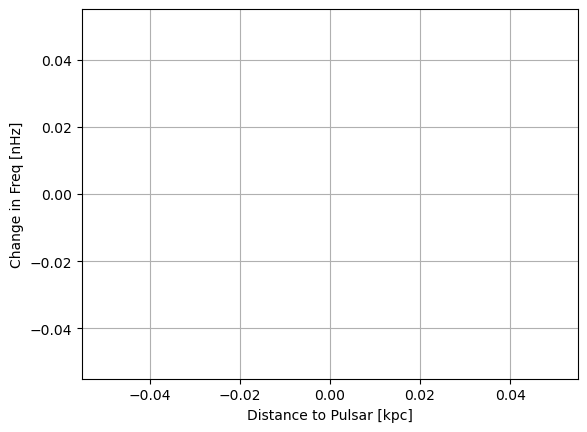

In [156]:
class Pulsar:
    def __init__(self, line):
        line = line.split()
        
        self.name = line[0]
        
        temp = line[1].split('+')
        self.meanDistance = float(temp[0])
        temporary = temp[1].split('-')
        self.plusError = float(temporary[0])
        self.minusError = float(temporary[1])
        
        self.rAsc = line[2]
        dividedUp = self.rAsc.split(':')
        hours = float(dividedUp[0])
        minutes = float(dividedUp[1])
        seconds = float(dividedUp[2])
        hours += (minutes / 60) + (seconds / 3600)
        self.phi = np.pi * hours / 12 #THIS IS IN RADIANS; DO WE WANT IT IN RADIANS?
        
        self.dec = line[3]
        divvyUp = self.dec.split(':')
        sign = divvyUp[0][0:1]
        divvyUp[0] = divvyUp[0][1:]
        degrees = float(divvyUp[0])
        minutes = float(divvyUp[1])
        seconds = float(divvyUp[2])
        degrees += (minutes / 60) + (seconds / 3600)
        if (sign.endswith('+')):
            self.theta = (np.pi/2) - (np.pi * degrees / 180)
        else:
            self.theta = (np.pi/2) + (np.pi * degrees / 180)
            
        self.pos = [np.sin(self.phi) * np.cos(self.theta), np.sin(self.phi) * np.sin(self.theta), np.cos(self.phi)]
        
    #can't do multiple constructors? evil evil evil
    
    def __str__(self):
        return str(self.name) + ", located at " + str(self.rAsc) + " " + str(self.dec)+": " + str(self.meanDistance) + "+" + str(self.plusError) + "-" + str(self.minusError) + " kpc"
    
baseM = 10 ** 9 #solar masses
baseFreq = 10 ** -7 #in hertz
#doesn't currently work for higher frequencies, some sort of complex number issue

f = open("pulsarDistPM.txt")
pulsars = []
for x in range(65):
    pulsars.append(Pulsar(f.readline()))
    
distances = np.array([])
for x in range(65):
    distances = np.append(distances, pulsars[x].meanDistance)

times = distances * const.kpc / const.c / const.yr
times = np.sort(times)
distances = np.sort(distances)

changes = []
for x in range(65):
    changes.append(changeInFreq(baseM, baseFreq, times[x]) * (10 ** 9))

truncatedChanges = np.delete(changes, [57, 58, 59, 60, 61, 62, 63, 64])
truncatedDistances = np.delete(distances, [57, 58, 59, 60, 61, 62, 63, 64])
    
plt.scatter(distances, changes)
#plt.scatter(truncatedDistances, truncatedChanges)
plt.plot(distances, changes)
plt.xlabel("Distance to Pulsar [kpc]")
plt.ylabel("Change in Freq [nHz]")
plt.grid()

Initial values: [4925.490947641268, 1e-08]
orbital frequency at 1.0: 3.141592653589793e-08; dw/dt at 1.0: 8.4514904288519e-21
orbital frequency at 1.000001: 3.141592653589793e-08; dw/dt at 1.000001: 8.4514904288519e-21
orbital frequency at 1.0000499999999999: 3.141592653589793e-08; dw/dt at 1.0000499999999999: 8.4514904288519e-21
orbital frequency at 1.000075: 3.141592653589793e-08; dw/dt at 1.000075: 8.4514904288519e-21
orbital frequency at 1.0001: 3.141592653589793e-08; dw/dt at 1.0001: 8.4514904288519e-21
orbital frequency at 1.0006: 3.141592653589794e-08; dw/dt at 1.0006: 8.451490428851907e-21
orbital frequency at 1.0008499999999998: 3.141592653589794e-08; dw/dt at 1.0008499999999998: 8.451490428851907e-21
orbital frequency at 1.0010999999999999: 3.1415926535897944e-08; dw/dt at 1.0010999999999999: 8.451490428851913e-21
orbital frequency at 1.0060999999999993: 3.1415926535897984e-08; dw/dt at 1.0060999999999993: 8.451490428851953e-21
orbital frequency at 1.008599999999999: 3.141592

orbital frequency at 1.0000499999999999: 3.141592653589793e-08; dw/dt at 1.0000499999999999: 8.4514904288519e-21
orbital frequency at 1.000075: 3.141592653589793e-08; dw/dt at 1.000075: 8.4514904288519e-21
orbital frequency at 1.0001: 3.141592653589793e-08; dw/dt at 1.0001: 8.4514904288519e-21
orbital frequency at 1.0006: 3.141592653589794e-08; dw/dt at 1.0006: 8.451490428851907e-21
orbital frequency at 1.0008499999999998: 3.141592653589794e-08; dw/dt at 1.0008499999999998: 8.451490428851907e-21
orbital frequency at 1.0010999999999999: 3.1415926535897944e-08; dw/dt at 1.0010999999999999: 8.451490428851913e-21
orbital frequency at 1.0060999999999993: 3.1415926535897984e-08; dw/dt at 1.0060999999999993: 8.451490428851953e-21
orbital frequency at 1.008599999999999: 3.1415926535898004e-08; dw/dt at 1.008599999999999: 8.451490428851972e-21
orbital frequency at 1.0110999999999988: 3.1415926535898024e-08; dw/dt at 1.0110999999999988: 8.451490428851992e-21
orbital frequency at 1.06109999999999

orbital frequency at 61111112.11109328: 3.1416443021014676e-08; dw/dt at 61111112.11109328: 8.451999903048096e-21
orbital frequency at 86111112.11109053: 3.141665434185448e-08; dw/dt at 86111112.11109053: 8.452208361795699e-21
orbital frequency at 111111112.11108778: 3.141686564185368e-08; dw/dt at 111111112.11108778: 8.452416803723569e-21
orbital frequency at 611111112.1110328: 3.142109185025554e-08; dw/dt at 611111112.1110328: 8.45658663309068e-21
orbital frequency at 861111112.1110053: 3.1423208081828494e-08; dw/dt at 861111112.1110053: 8.45867519546459e-21
orbital frequency at 1111111112.110978: 3.1425322230107963e-08; dw/dt at 1111111112.110978: 8.460762076347754e-21
orbital frequency at 6111111112.110429: 3.14676260404897e-08; dw/dt at 6111111112.110429: 8.502599030150048e-21
orbital frequency at 8611111112.110153: 3.148909172283408e-08; dw/dt at 8611111112.110153: 8.523885263720847e-21
orbital frequency at 11111111112.109879: 3.151034985488354e-08; dw/dt at 11111111112.109879: 8

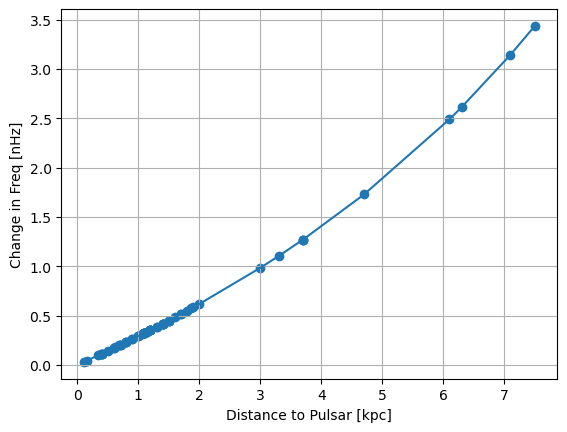

In [161]:
baseM = 10 ** 9 #solar masses
baseFreq = 10 ** -8 #in hertz
#doesn't currently work for higher frequencies, some sort of complex number issue

f = open("pulsarDistPM.txt")
pulsars = []
for x in range(65):
    pulsars.append(Pulsar(f.readline()))
    
distances = np.array([])
for x in range(65):
    distances = np.append(distances, pulsars[x].meanDistance)

times = distances * const.kpc / const.c / const.yr
times = np.sort(times)
distances = np.sort(distances)

changes = []
for x in range(65):
    changes.append(changeInFreqNumerical(baseM, baseFreq, times[x]) * (10 ** 9))
print(changes)
    
plt.scatter(distances, changes)
plt.plot(distances, changes)
plt.xlabel("Distance to Pulsar [kpc]")
plt.ylabel("Change in Freq [nHz]")
plt.grid()

In [120]:
def function(t, values):
    x = values[0]
    m = values[1]
    return [(-96/5) * m**(5/3) * (np.pi * x)**(11/3) / np.pi, 0]

"""def freqChangeRateNumerical(t, values):
    #values contains [m in solar masses, GW frequency]
    M = values[0] * const.Tsun
    gwFreq = values[1]
    freq = gwFreq * np.pi
        
    dwdt = (-96/5) * (M**(5/3)) * (freq**(11/3))
    #print(dwdt)
    return [0, dwdt / np.pi]"""

y0 = np.array([1, 2])

t_span = [1, 10]
t_eval = np.linspace(0, 10, num = 11)

# Solve the ODE
solution = solve_ivp(function, [0, 10], y0, t_eval=t_eval)

print(solution)
print(solution.y[0])

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  1.000e+00  2.000e+00  3.000e+00  4.000e+00
             5.000e+00  6.000e+00  7.000e+00  8.000e+00  9.000e+00
             1.000e+01]
        y: [[ 1.000e+00  4.724e-02 ...  2.073e-02  1.992e-02]
            [ 2.000e+00  2.000e+00 ...  2.000e+00  2.000e+00]]
      sol: None
 t_events: None
 y_events: None
     nfev: 128
     njev: 0
      nlu: 0
[1.         0.04724219 0.03641761 0.03129218 0.02808869 0.02584052
 0.02412168 0.02277291 0.02166868 0.02072871 0.01992256]


/tmp/ipykernel_521/1300743971.py:4: RuntimeWarning: invalid value encountered in scalar power
  return [(-96/5) * m**(5/3) * (np.pi * x)**(11/3) / np.pi, 0]
